# Desafío Spike
El objetivo del desafío es predecir el precio de la leche mensual. Para esto se cuenta con:

- **precipitaciones.csv:** Archivo que contiene datos sobre precipitaciones mensuales para cada región de Chile.
- **precio_leche.csv:** Archivo que contiene los precios de la leche mensuales sin iva.
- **banco_central.csv:** Archivo que ccontiene distinto datos económicos a nivel mensual.

Este notebook es dividido en las siguientes secciones:

- EDA: Carga de datos y analisis exploratorio.
- Visualización: Como parte del desafío se pide programar varias funciones para visualziar los datos, las cuales se encuentran en esta sección.
- Tratamiento, selección y creación de variables: En base al analisis de las correlaciones entre las variables de los archivos de entrada y el precio de la leche se seleccionan las variables para el modelo. Se crean las variables año, mes y trimestre. Se programa una función que permiete obtener las variables lageadas y algunos estadisticos en un rango de tiempo dado.
- Modelo: Se entrena el modelo y se compara con un modelo más simple, en este caso, el modelo simple es usar como predicción el precio del mes anterior. Para comparar los modelo se utiliza como métrica la raiz del error cudrático medio. Para validar el modelo se dividen los datos en 67% de entrenamiento y 33% de validación respetando el orden temporal.

Como resultado se obtiene un modelo en base a variables lageadas, variables temporales (año,mes,cuatrimestres) y algunas variables exógenas (precipitaciones y variables económicas). 

# EDA

Para cargar los datos se creo la función `cargar_datos`  que carga los 3 archivos csv y los mezcla en un solo dataframe en base a la fecha. También detecta y elimina valores extraños, como por ejemplo, las 'a' en el archivo banco_central.csv.

Para estudiar los datos se crean las siguientes funciones 

- `plot_n_datos`: recive una lista de variables y crea un gráfico de barras con la cantidad de valores no nulos.
- `box_plot_por_mes`: recive una lista de variables y un numero de columnas para crear subplots. Para cada variable se crea un boxplot agrupado por los meses.
- `box_plot_por_variable`: recive una lista de variables y crea una figura con los boxplots de cada variable.

In [1]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

In [2]:
###Necesitamos saber que regiones están en la base de datos de precipitaciones.
regiones=['Coquimbo','Valparaiso','Metropolitana_de_Santiago',
                            'Libertador_Gral__Bernardo_O_Higgins','Maule','Biobio','La_Araucania','Los_Rios']
meses=['enero','febrero','marzo','abril','mayo','junio','julio','agosto','septiembre','octubre','noviembre',
      'diciembre']

In [3]:
def cargar_datos():
    
    df_precipitaciones=pd.read_csv('precipitaciones.csv')
    df_precipitaciones.rename(columns={'date':'Fecha'},inplace=True)
    df_precipitaciones['Fecha']=pd.to_datetime(df_precipitaciones['Fecha'])
    df_precipitaciones=df_precipitaciones.sort_values(by='Fecha')
    df_banco=pd.read_csv('banco_central.csv',engine='python')
    df_banco.rename(columns={'Periodo':'Fecha'},inplace=True)
    df_banco['Fecha']=df_banco['Fecha'].apply(lambda x:x.replace(' UTC',''))
    df_banco['year']=df_banco['Fecha'].apply(lambda x: int(x.split('-')[0]))
    df_banco['month']=df_banco['Fecha'].apply(lambda x: int(x.split('-')[1]))
    df_banco.loc[df_banco['month']==13,'month']=12
    df_banco['day']=1
    df_banco['Fecha']=pd.to_datetime(df_banco[['year','month','day']])
    df_banco.drop(columns=['year','month','day'],inplace=True)
    df_banco=df_banco.sort_values(by='Fecha')
    df_leche=pd.read_csv('precio_leche.csv')
    dic_meses={mes: i+1 for i,mes in enumerate(df_leche['Mes'].unique())}
    df_leche['month']=df_leche['Mes'].apply(lambda x: dic_meses[x])
    df_leche['day']=1
    df_leche['year']=df_leche['Anio']
    df_leche['Fecha']=pd.to_datetime(df_leche[['day','month','year']],yearfirst=True,)
    df_leche.drop(columns=['month','day','year','Anio','Mes'],inplace=True)
    df_leche=df_leche.sort_values(by='Fecha')
    print('Fecha inicio precio leche',df_leche['Fecha'].min())
    print('Fecha inicio precipitaciones',df_precipitaciones['Fecha'].min())
    print('Fecha inicio indices banco',df_banco['Fecha'].min())
    print('Fecha final precio leche',df_leche['Fecha'].max())
    print('Fecha final precipitaciones',df_precipitaciones['Fecha'].max())
    print('Fecha final indices banco',df_banco['Fecha'].max())
    print('Numero de columnas leche:', df_leche.shape[1])
    print('Numero de columnas precipitaciones:', df_precipitaciones.shape[1])
    print('Numero de columnas indices banco:', df_banco.shape[1])
    print('Numero de filas leche:', df_leche.shape[0])
    print('Numero de filas precipitaciones:', df_precipitaciones.shape[0])
    print('Numero de filas indices banco:', df_banco.shape[0])
    print('columnas con problemas:')
    print('****')
    for col in df_banco.columns:
        if df_banco.dtypes[col]=='object':
            print(col)
            print('Valores extraños:')
            mask_1=(~df_banco[col].isna())
            mask_2=df_banco[col].apply(lambda x: str(x).replace('.','').isnumeric())
            mask_numerics=mask_1&mask_2
            df_banco.loc[mask_numerics,col]=df_banco.loc[mask_numerics,col].apply(lambda x:str(x).replace('.',''))
            print(df_banco.loc[~mask_2&mask_1 ,col].values)
            df_banco.loc[~mask_2,col]=np.nan
            df_banco[col]=pd.to_numeric(df_banco[col])
    
    print('Numero duplicados banco',np.sum(df_banco.duplicated(subset='Fecha')))
    print('Numero duplicados leche',np.sum(df_leche.duplicated(subset='Fecha')))
    print('Numero duplicados precipitaciones',np.sum(df_precipitaciones.duplicated(subset='Fecha')))
    df_banco.drop_duplicates(inplace=True)
    df_merged=pd.merge(left=df_leche,right=df_precipitaciones,how='left',on='Fecha')
    df_merged=pd.merge(left=df_merged,right=df_banco,how='left',on='Fecha')
    print('Numero duplicados',np.sum(df_merged.duplicated(subset='Fecha')))
    return df_merged
def box_plot_por_mes(variables,n_cols=4):
    n_rows=len(regiones)//n_cols+1
    for i,variable in enumerate(variables):
        plt.subplot(n_rows,n_cols,i+1)
        plt.boxplot([df_merged.loc[df_merged['Fecha'].dt.month==j,variable].dropna().values
                     for j in range(1,13)])
        plt.title('boxplot '+ variable)
        plt.xticks(range(1,13),meses,rotation=90)
        plt.grid()
    plt.tight_layout()
def box_plot_por_variable(variables):
    plt.boxplot([df_merged[variable].dropna()for variable in variables])
    plt.xticks(range(1,len(variables)+1),variables,rotation=90)
    plt.grid()
def plot_n_datos(variables):
    n_datos=df_merged[variables].count().sort_values()
    plt.barh(n_datos.index,n_datos.values)
    for i,variable in enumerate(n_datos.index):
        texto=str(n_datos[variable])
        plt.text(n_datos[variable]+0.5,i,texto)
    plt.tight_layout()
def plot_hist(col,escalar=False):
    
    
    if escalar:
        leyenda='N_datos:{}\nMínimo: {:.2f}\nMediana: {:.2f}\nMaximo: {:.2f}\nPromedio: {:.2f}\nDevStd: {:.2f}'.format(
    df_merged[col].count(),df_merged[col].min()/df_merged[col].mean(),df_merged[col].median()/df_merged[col].mean(),
        df_merged[col].max()/df_merged[col].mean(),df_merged[col].mean()/df_merged[col].mean(),
            df_merged[col].std()/df_merged[col].mean())
        plt.hist(df_merged[col]/df_merged[col].mean(),edgecolor='k',label=leyenda,bins='auto');
    else:
        leyenda='N_datos:{}\nMínimo: {:.2f}\nMediana: {:.2f}\nMaximo: {:.2f}\nPromedio: {:.2f}\nDevStd: {:.2f}'.format(
    df_merged[col].count(),df_merged[col].min(),df_merged[col].median(),
        df_merged[col].max(),df_merged[col].mean(),df_merged[col].std())
        plt.hist(df_merged[col],edgecolor='k',label=leyenda,bins='auto');
    plt.grid()
    plt.legend()

In [4]:
df_merged=cargar_datos()

Fecha inicio precio leche 1979-01-01 00:00:00
Fecha inicio precipitaciones 1979-01-01 00:00:00
Fecha inicio indices banco 1970-01-01 00:00:00
Fecha final precio leche 2021-02-01 00:00:00
Fecha final precipitaciones 2020-04-01 00:00:00
Fecha final indices banco 2020-12-01 00:00:00
Numero de columnas leche: 2
Numero de columnas precipitaciones: 9
Numero de columnas indices banco: 85
Numero de filas leche: 506
Numero de filas precipitaciones: 496
Numero de filas indices banco: 614
columnas con problemas:
****
Imacec_empalmado
Valores extraños:
[]
Imacec_produccion_de_bienes
Valores extraños:
[]
Imacec_minero
Valores extraños:
[]
Imacec_industria
Valores extraños:
['a']
Imacec_resto_de_bienes
Valores extraños:
[]
Imacec_comercio
Valores extraños:
[]
Imacec_servicios
Valores extraños:
[]
Imacec_a_costo_de_factores
Valores extraños:
[]
Imacec_no_minero
Valores extraños:
[]
PIB_Agropecuario_silvicola
Valores extraños:
['a']
PIB_Pesca
Valores extraños:
[]
PIB_Mineria
Valores extraños:
[]
PIB_M

**Observación:** Todos los dataframe tienen el mismo inicio, pero no el mismo final. En particular el precio de la leche termina el 2021, mientras que el banco y las precipitaciones terminan el 2020.

**Observación:** En los indices bancarios hay un periodo con mes=13, vamos a asumir que es un error de tipeo y lo vamos a cambiar por 12.

**Observación:** Hay alguna columnas en el archivo banco_central.csv que tienen una 'a' en alguna celda.

**Observación:** El archivo banco_central.csv viene con separador de cientos. Probablemente hubo un erro en la exportación de estos datos.


In [5]:
columnas_banco=[col for col in df_merged.columns if col!='Fecha' and col not in regiones and col !='Precio_leche']
columnas_imacec=[col for col in df_merged.columns if 'Imacec' in col]
columnas_pib=[col for col in df_merged.columns if 'PIB' in col]
columnas_precio=[col for col in df_merged.columns if 'Precio' in col]
columnas_ocupacion=[col for col in df_merged.columns if 'Ocupacion' in col]+['Ocupados']
columnas_indice=[col for col in df_merged.columns if 'Indice' in col]
columnas_resto=[col for col in columnas_banco if col  not in (columnas_imacec+columnas_pib+columnas_indice
                                                                  +columnas_precio+ columnas_ocupacion )]

**No Nulos banco_central.csv**
Las columnas asociadas al banco central tienen una gran cantidad de valores en nulos, donde la columna con mas valores tiene 501 valores y la con menos tiene 80.

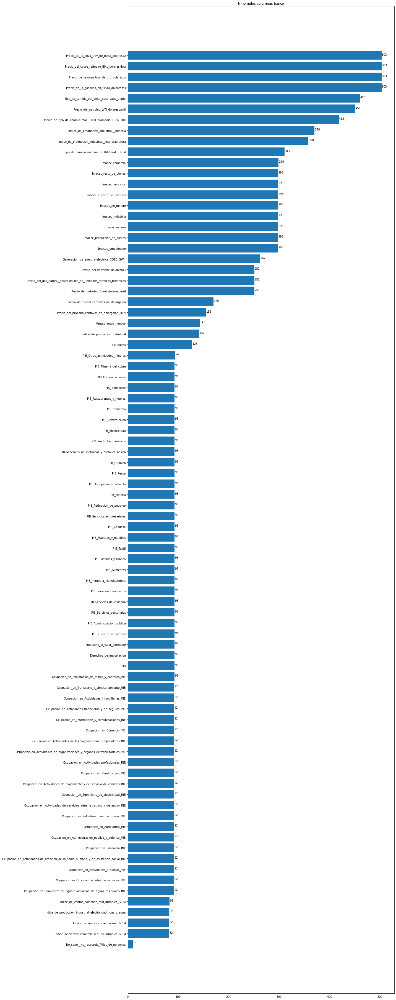

In [6]:
plt.figure(figsize=(20,50))
plot_n_datos(columnas_banco)
plt.title('N no nulos columnas banco');

**No Nulos precopitaciones.csv**
Las columnas asociadas a las precipitaciones no tienen muchos valores nulos.

Text(0.5, 1.0, 'N no nulos precipitaciones')

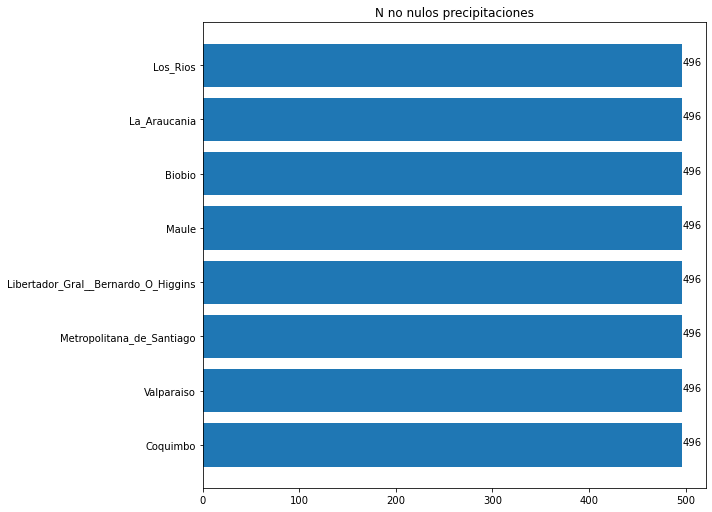

In [7]:
plt.figure(figsize=(10,7))
plot_n_datos(regiones)
plt.title('N no nulos precipitaciones')

**Distribución precio leche:** La distribución del precio de la leche no es estacionaria, se puede apreciar que claramente hay una tendencia lineal en los datos. Además la distribución es asimetrica y tiene soporte en los números positivos (lo cual es evidente pues es un precio). Para trabajar con esta variable vamos a utilizar la transformación su transformación logaritmica para asegurar que al modelar las predicciones sean nueros positivos.

Text(0.5, 1.01, 'Precio de la leche leche')

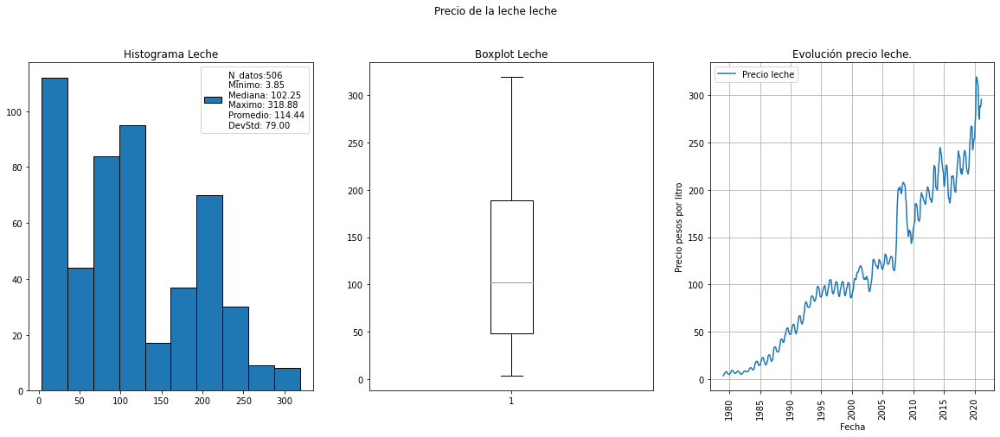

In [8]:
from sklearn.linear_model import LinearRegression
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plot_hist('Precio_leche')
plt.grid()
plt.title('Histograma Leche')
plt.subplot(1,3,2)
plt.boxplot(df_merged['Precio_leche']);
plt.title('Boxplot Leche')
plt.subplot(1,3,3)
plt.plot(df_merged['Fecha'],df_merged['Precio_leche'],label='Precio leche');
plt.xticks(rotation=90)
plt.ylabel('Precio pesos por litro')
plt.xlabel('Fecha')
plt.title('Evolución precio leche.')
plt.legend()
plt.grid()
plt.suptitle('Precio de la leche leche',y=1.01)

In [9]:
df_merged['Precio_leche']=np.log(df_merged['Precio_leche'])###Transformamos los datos

Text(0.5, 1.0, 'Evolución logaritmo precio precio leche')

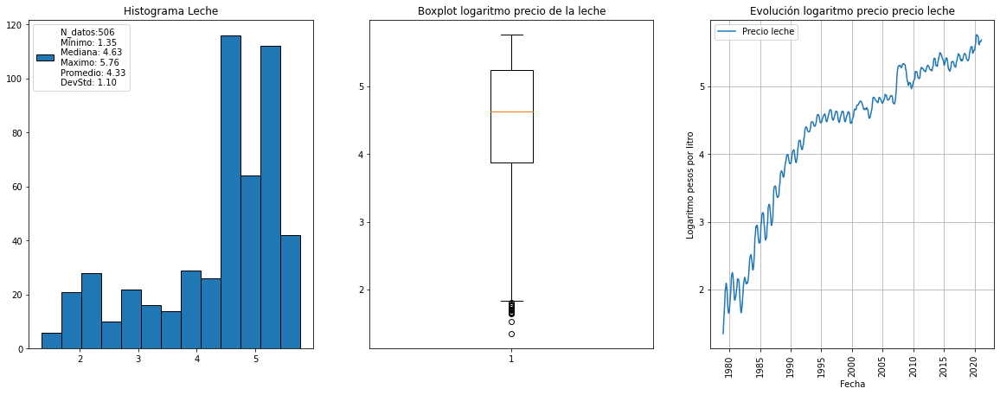

In [10]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plot_hist('Precio_leche')
plt.grid()
plt.title('Histograma Leche')
plt.subplot(1,3,2)
plt.boxplot(df_merged['Precio_leche']);
plt.title('Boxplot logaritmo precio de la leche')
plt.subplot(1,3,3)
plt.plot(df_merged['Fecha'],df_merged['Precio_leche'].values,label='Precio leche');
plt.xticks(rotation=90)
plt.ylabel('Logaritmo pesos por litro')
plt.xlabel('Fecha')
plt.legend()
plt.grid()
plt.title('Evolución logaritmo precio precio leche')

Para comprender el comportamiento temporal del precio de la leche se utiliza la autocorrelación y la autocorrelación parcial. Podemos ver que el precio de la leche está altamente correlacionado con sus precios anteriores. Sin embargo, de acuerdo al plot de autocorrelación parcial, este aporte está dado principalmente por el precio del mes anterior.

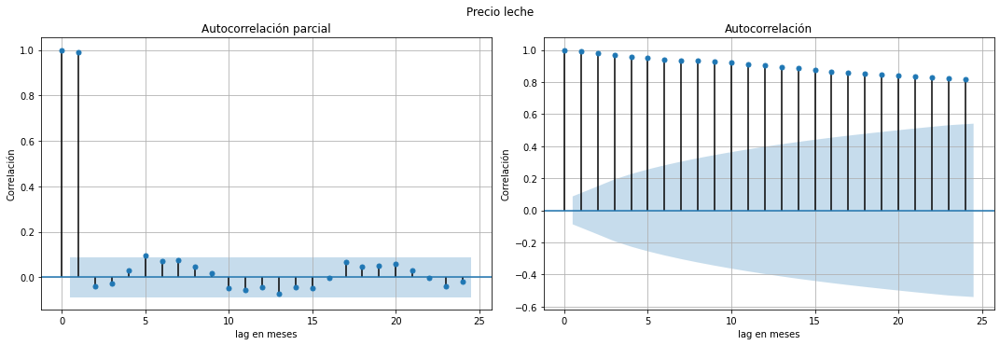

In [11]:
from statsmodels.graphics.tsaplots import plot_pacf,plot_acf
fig=plt.figure(figsize=(15,5))
ax=fig.add_subplot(1,2,1)
plot_pacf(df_merged['Precio_leche'].dropna().values, lags=24,ax=ax)
plt.title('Autocorrelación parcial')
plt.xlabel('lag en meses')
plt.ylabel('Correlación')
plt.grid()
ax=fig.add_subplot(1,2,2)
plot_acf(df_merged['Precio_leche'].dropna().values, lags=24,ax=ax)
plt.title('Autocorrelación')
plt.xlabel('lag en meses')
plt.ylabel('Correlación')
plt.grid()
plt.suptitle('Precio leche',y=1.02)
plt.tight_layout()
plt.show()

Dada la tendencia lineal de los datos, es iteresante ver el comportamiendo del precio diferenciado (resta entre el precio de un mes dado y el anterior), pues esto logra estacionalizar los datos (al menos en terminos de la media). En este caso nuevamente se aprecia que la correlación está dada principalmente con el mes anterior. Además se observa un cierto comportamiento estacionario.

**Observación:** Esto indica que no se debiesen utilizar demasiados lags para modelar el precio de la leche (a lo más 6-7).

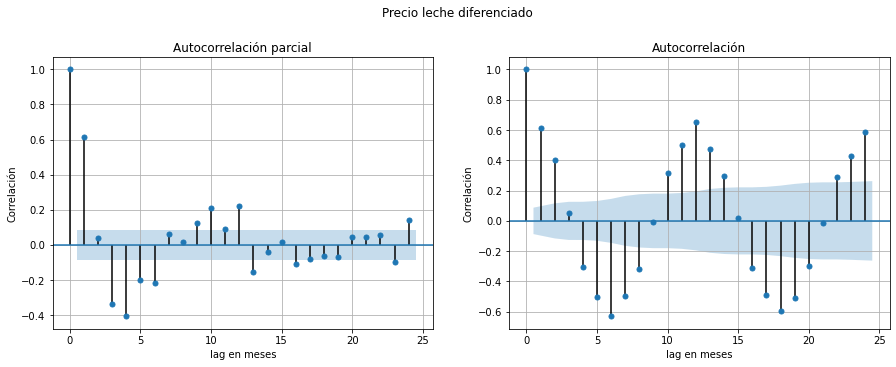

In [12]:
from statsmodels.graphics.tsaplots import plot_pacf,plot_acf
fig=plt.figure(figsize=(15,5))
ax=fig.add_subplot(1,2,1)
plot_pacf(df_merged['Precio_leche'].diff(1).dropna().values, lags=24,ax=ax)
plt.title('Autocorrelación parcial')
plt.xlabel('lag en meses')
plt.ylabel('Correlación')
plt.grid()
ax=fig.add_subplot(1,2,2)
plot_acf(df_merged['Precio_leche'].diff(1).dropna().values, lags=24,ax=ax)
plt.xlabel('lag en meses')
plt.ylabel('Correlación')
plt.title('Autocorrelación')
plt.grid()
plt.suptitle('Precio leche diferenciado',y=1.02)
plt.show()

**Distribución precipitaciones:** Según los boxplots para cada  región, podemos observar que las regiones más al su tienen medianas de precipitaciones mensuales mayores. De los boxplots para cada región por mes, se observa que las precipitaciones para todas las regiones se concentran entre abril y octubre.

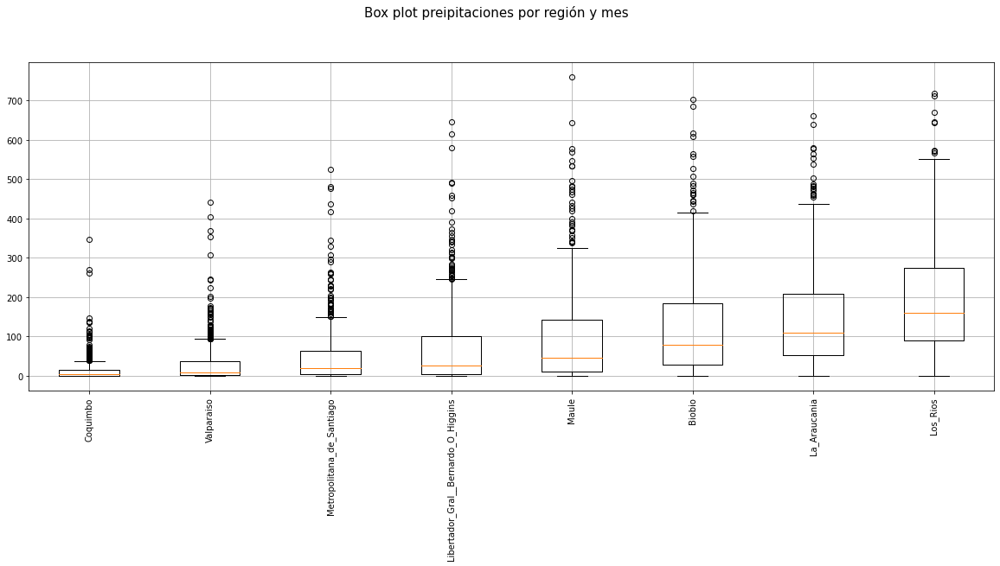

In [13]:
plt.figure(figsize=(20,7))
box_plot_por_variable(regiones)
plt.suptitle('Box plot preipitaciones por región y mes',y=1.01,fontsize=15);

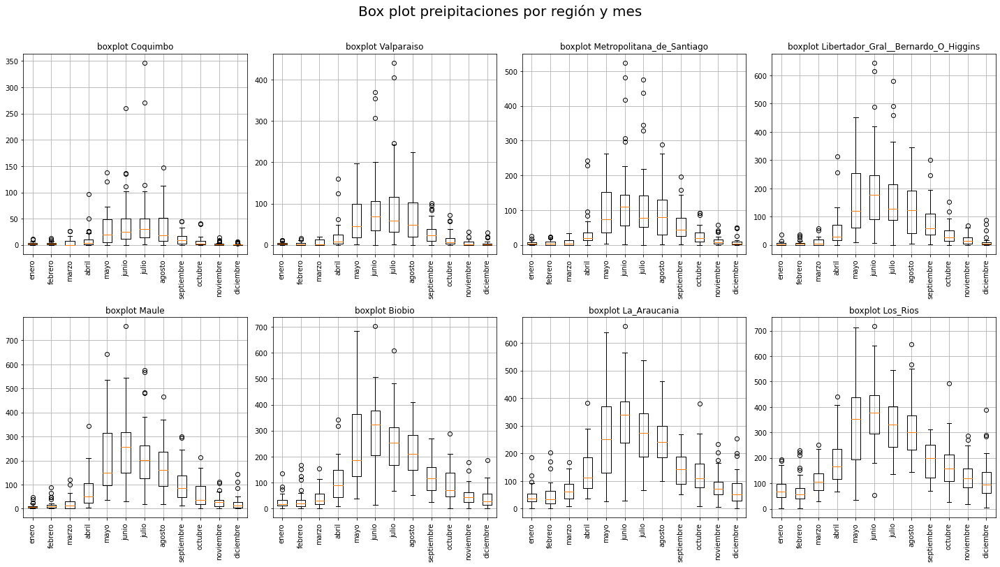

In [14]:
####Boxplot precipitaciones por mes
fig=plt.figure(figsize=(20,15))
box_plot_por_mes(regiones,n_cols=4)

fig.suptitle('Box plot preipitaciones por región y mes',y=1.04,fontsize=20);
plt.tight_layout()

**Distribución banco central:** Según los boxplots, en general todas las variables que estaban en el archivo banco_central.csv tienen algunos outliers que están muy alejados de sus distribuciones. Es probable que haya habido algún problema con la importación de los datos o que estos vengan contaminados.

Para no perder los datos anomalos se investigo el comportamiento de estos datos en la página del banco central y se modificarón de manera que la base de datos entregada tuviera un comportamiento similar a lo observado en la página del banco central.

Un error tipico al trabajar con archivos csv es que la ',' de los números flotantes se corra y por lo tanto algunos datos queden en un escala distinta. Se modificaran los datos de forma que para una misma variavble todos esten en un misma escala y sean coherentes con el comportamiento de lo observado en las bases de datos del banco central.

**Observación:** Sería más conveniente volver a exportar los datos, sin embargo, con un fin didactico se prefiere tratar de solucionar el problema de la forma expresada anteriormente.

In [15]:
def plot_linea_hist(col):
    df_aux=df_merged.dropna(subset=[col])[['Fecha',col]]
    plt.figure(figsize=(20,5))
    
    plt.subplot(1,3,1)
    plt.plot(df_aux['Fecha'],df_aux[col]/np.mean(df_aux[col]),label=col)
    plt.grid(True)
    plt.xlabel('Fecha')
    plt.title('Evolución temportal '+col+' escalado')
    plt.subplot(1,3,2)
    plot_hist(col,True)
    plt.title('Histograma '+col+' escalado')
    plt.subplot(1,3,3)
    plt.boxplot(df_aux[col]/np.mean(df_aux[col]))
    plt.title('Boxplot '+col+' escalado')

Para resolver este problema primero se gráfica la evolución de cada una de las variables bancarias divididas por su media. Asumiendo que los datos errados tengan un problema de escala, podriamos observar que datos escalar y como. Tambien se gráfica la distribución de estos datos

<Figure size 720x360 with 0 Axes>

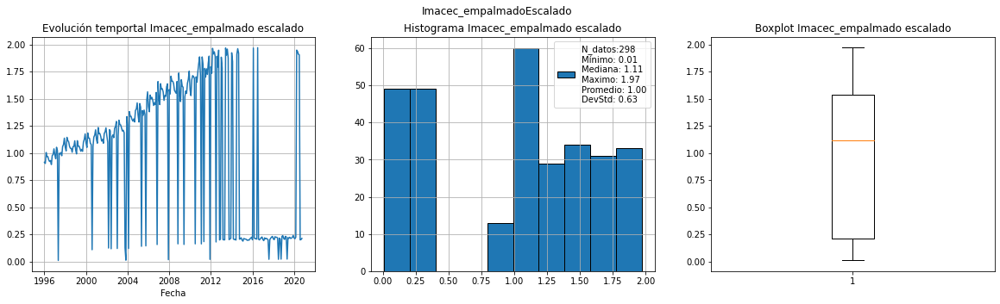

<Figure size 720x360 with 0 Axes>

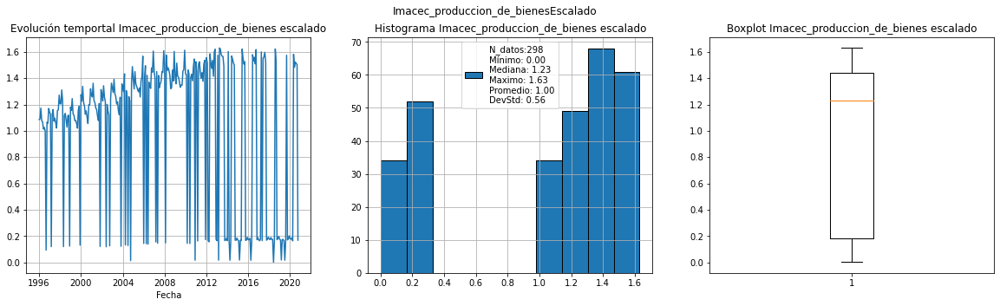

<Figure size 720x360 with 0 Axes>

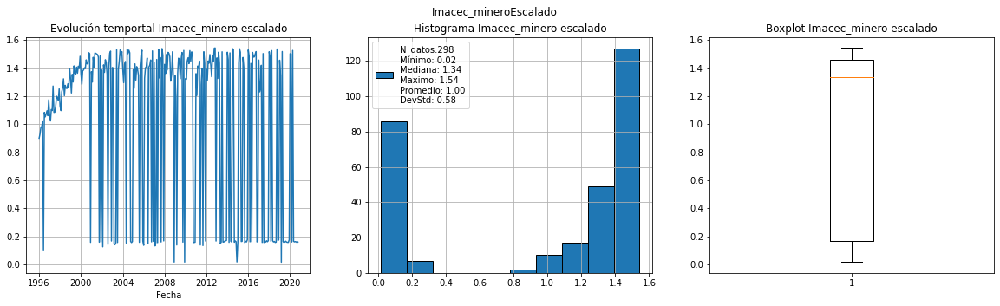

<Figure size 720x360 with 0 Axes>

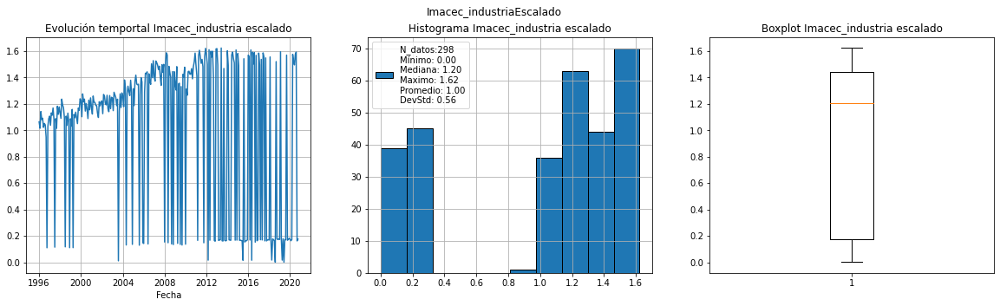

<Figure size 720x360 with 0 Axes>

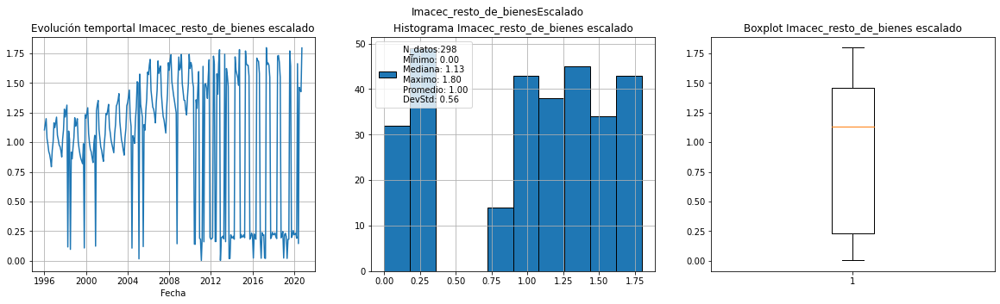

<Figure size 720x360 with 0 Axes>

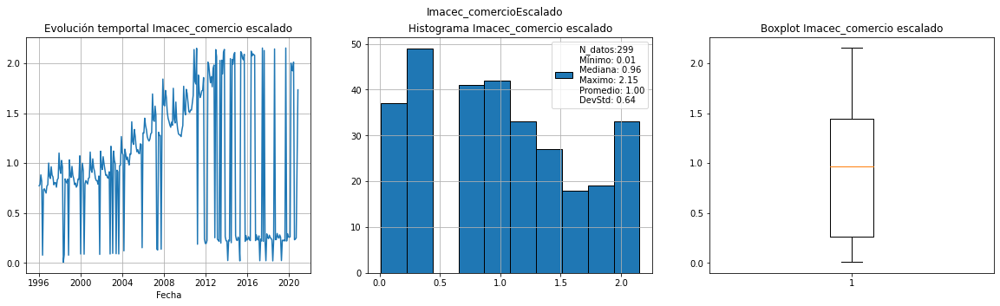

<Figure size 720x360 with 0 Axes>

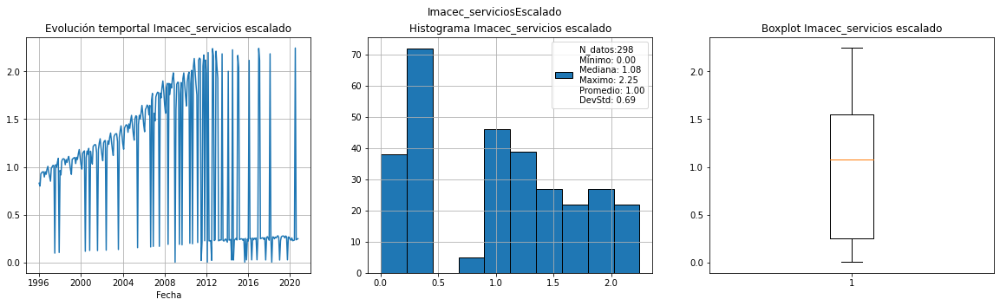

<Figure size 720x360 with 0 Axes>

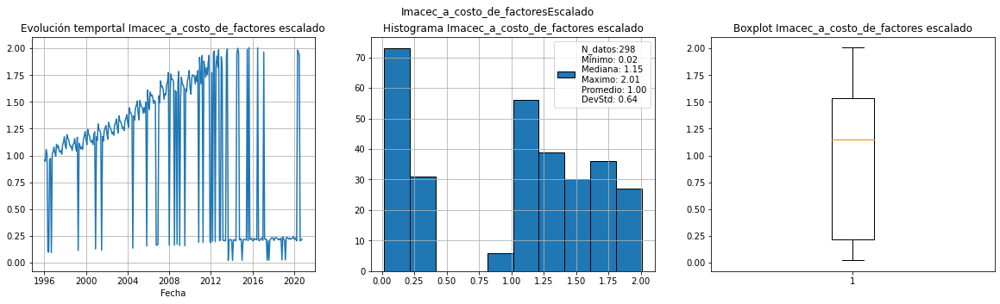

<Figure size 720x360 with 0 Axes>

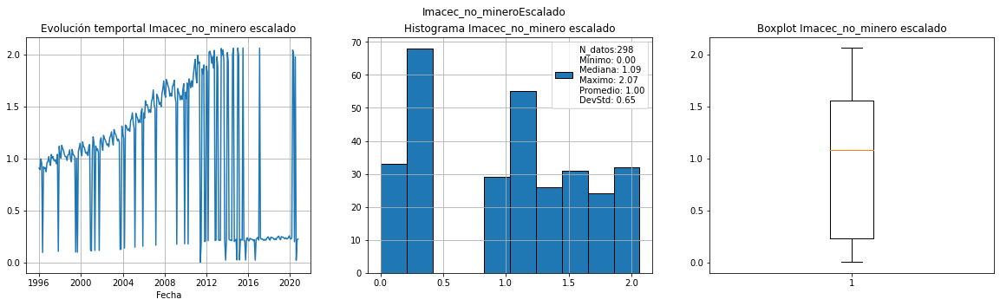

<Figure size 720x360 with 0 Axes>

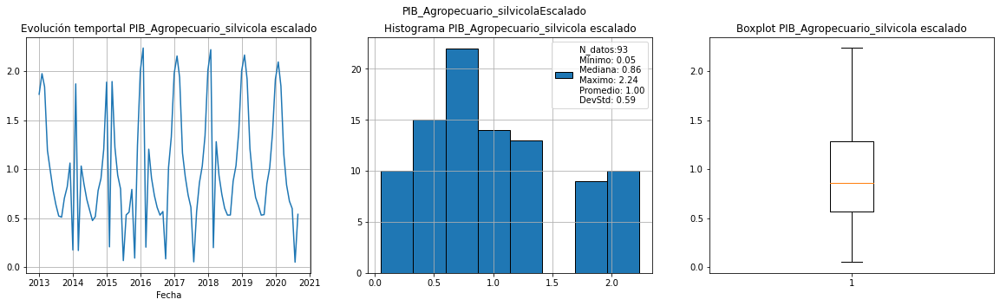

<Figure size 720x360 with 0 Axes>

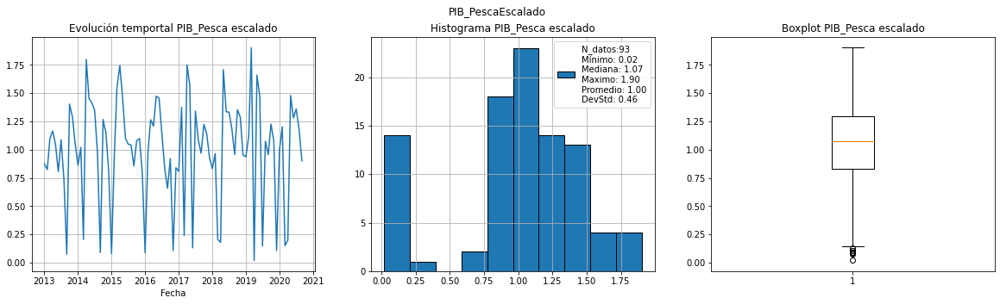

<Figure size 720x360 with 0 Axes>

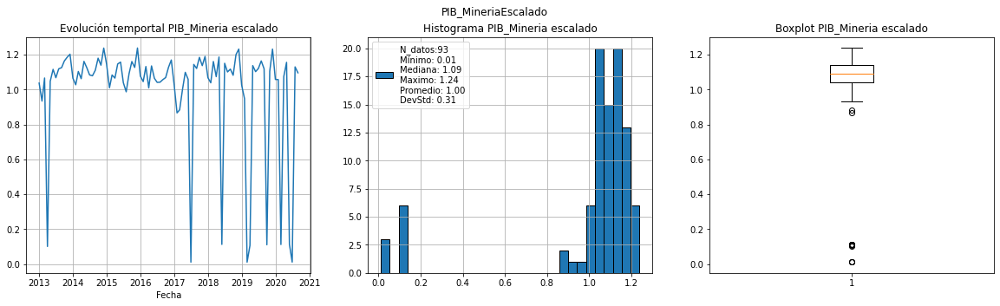

<Figure size 720x360 with 0 Axes>

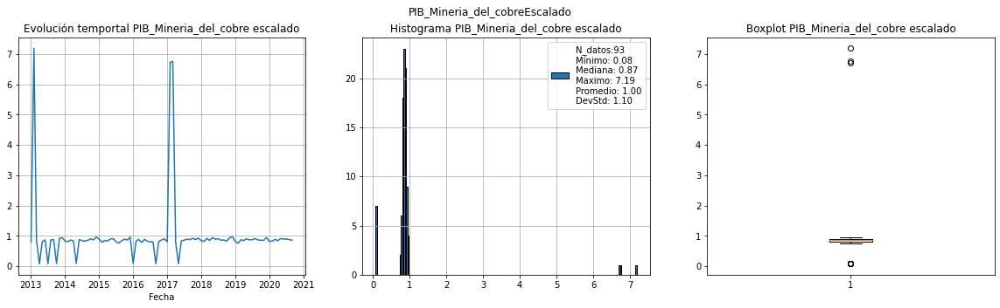

<Figure size 720x360 with 0 Axes>

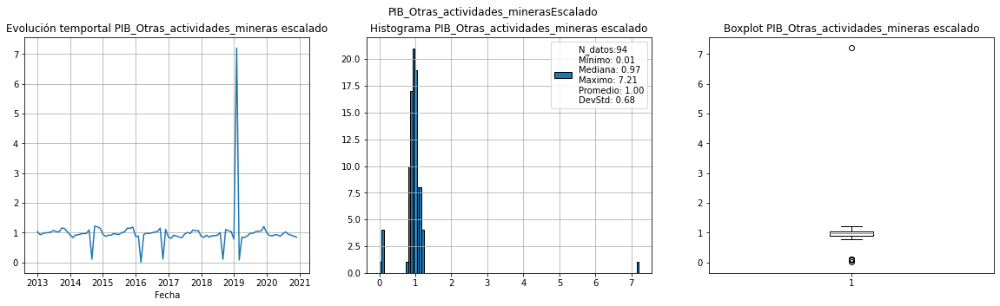

<Figure size 720x360 with 0 Axes>

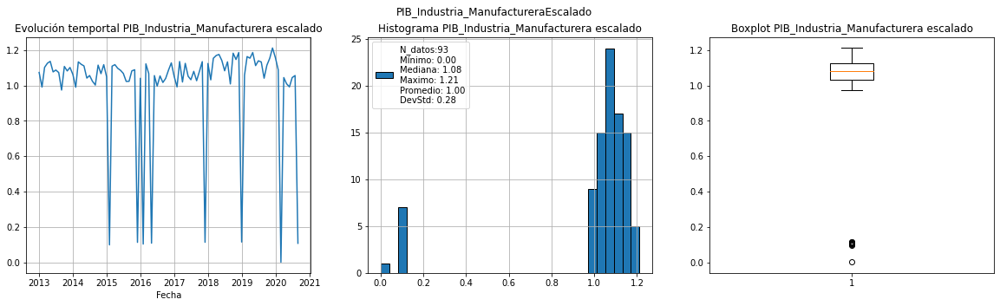

<Figure size 720x360 with 0 Axes>

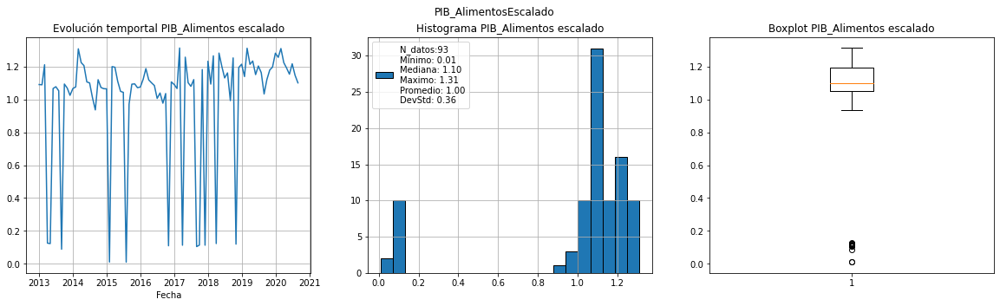

<Figure size 720x360 with 0 Axes>

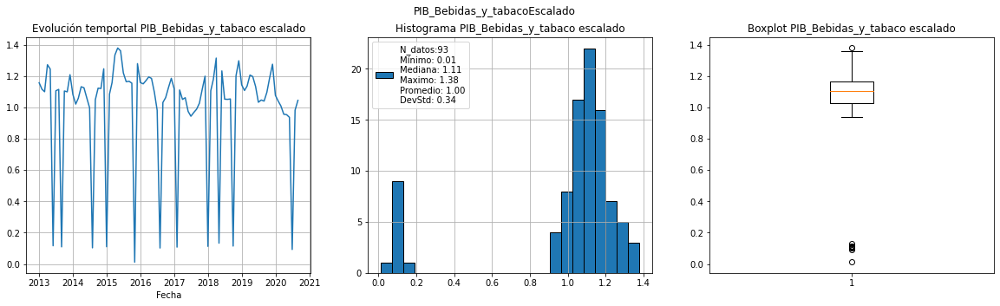

<Figure size 720x360 with 0 Axes>

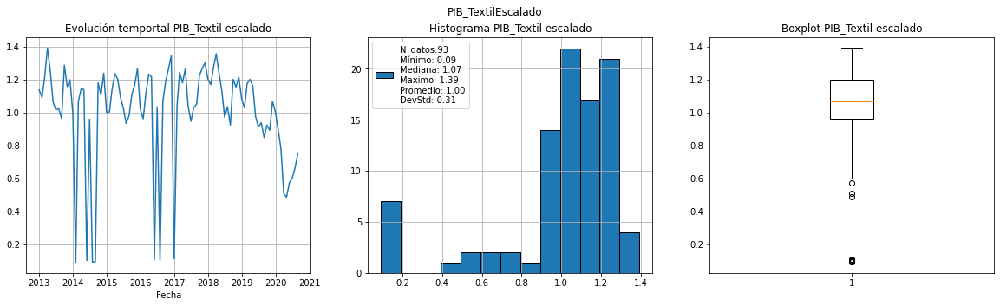

<Figure size 720x360 with 0 Axes>

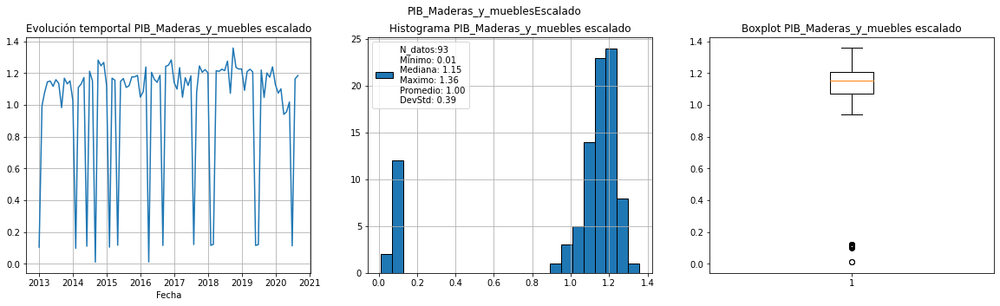

<Figure size 720x360 with 0 Axes>

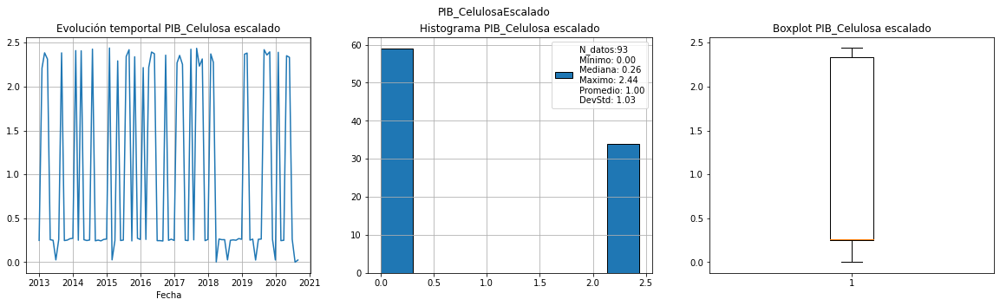

<Figure size 720x360 with 0 Axes>

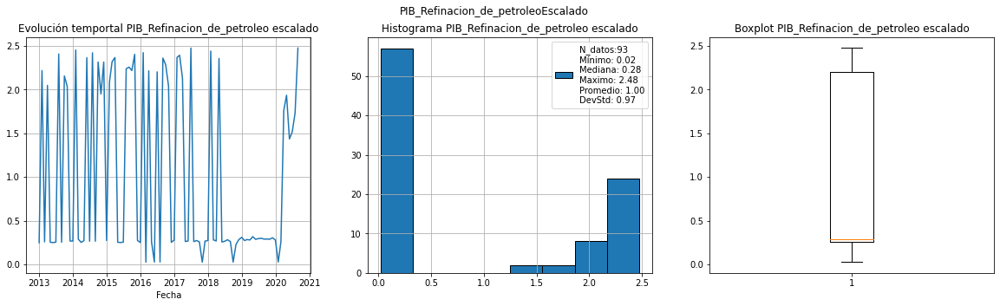

<Figure size 720x360 with 0 Axes>

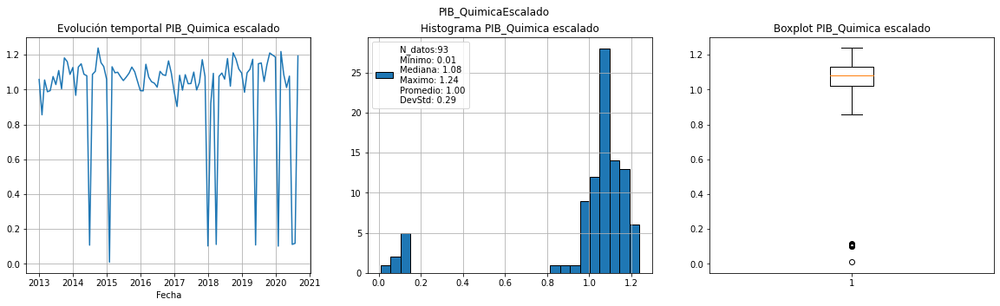

<Figure size 720x360 with 0 Axes>

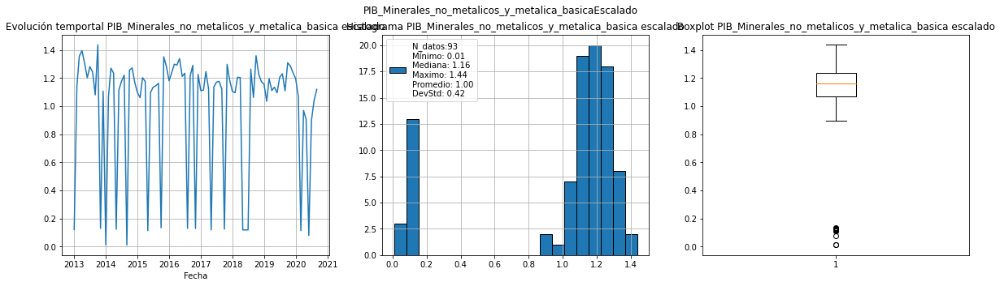

<Figure size 720x360 with 0 Axes>

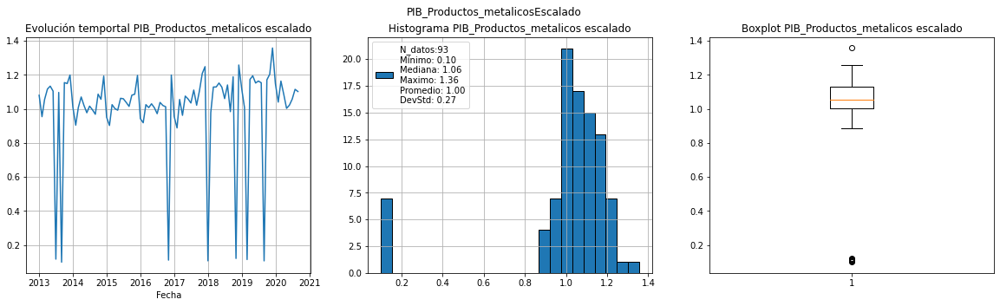

<Figure size 720x360 with 0 Axes>

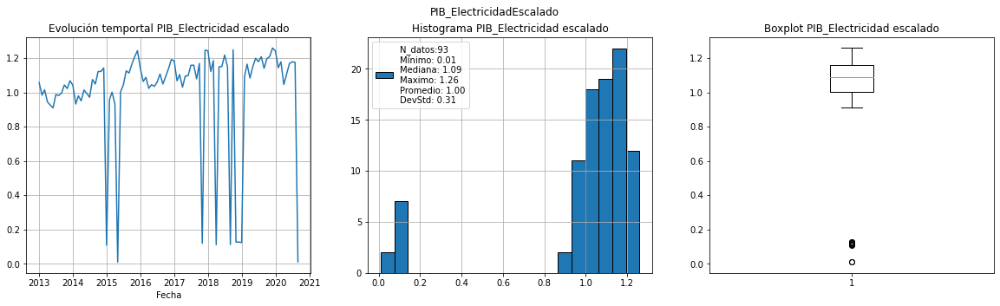

<Figure size 720x360 with 0 Axes>

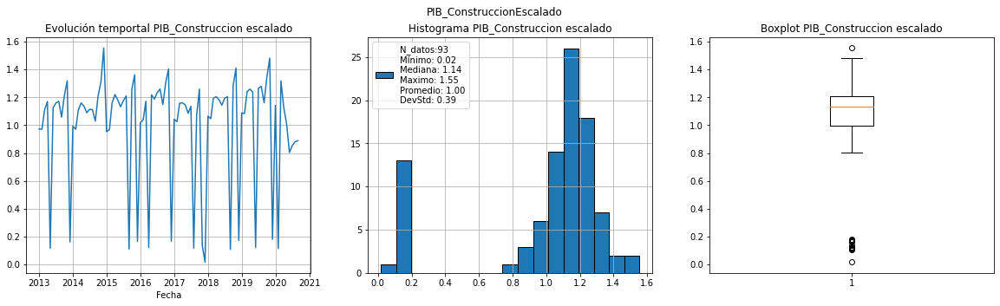

<Figure size 720x360 with 0 Axes>

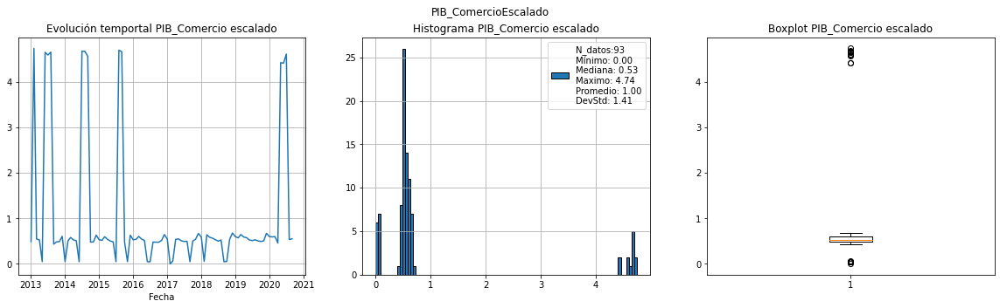

<Figure size 720x360 with 0 Axes>

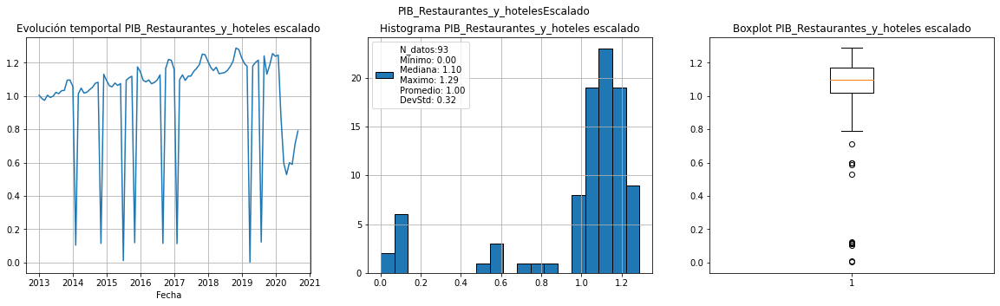

<Figure size 720x360 with 0 Axes>

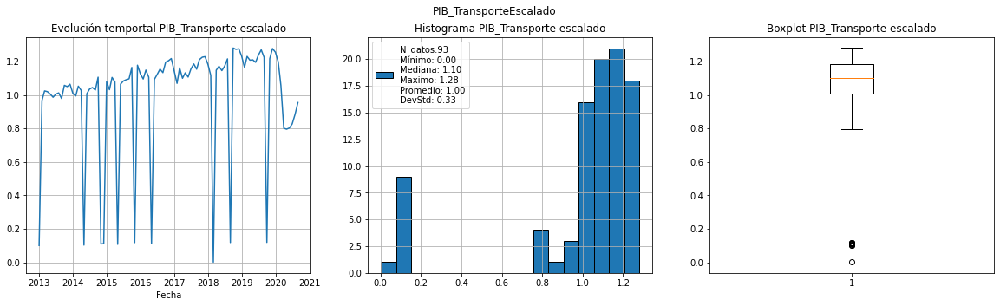

<Figure size 720x360 with 0 Axes>

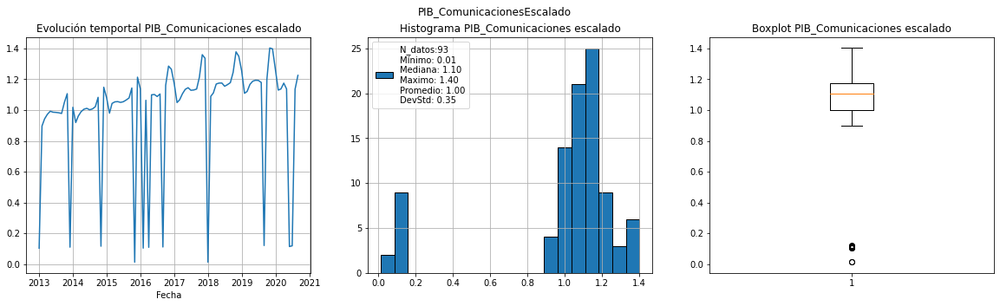

<Figure size 720x360 with 0 Axes>

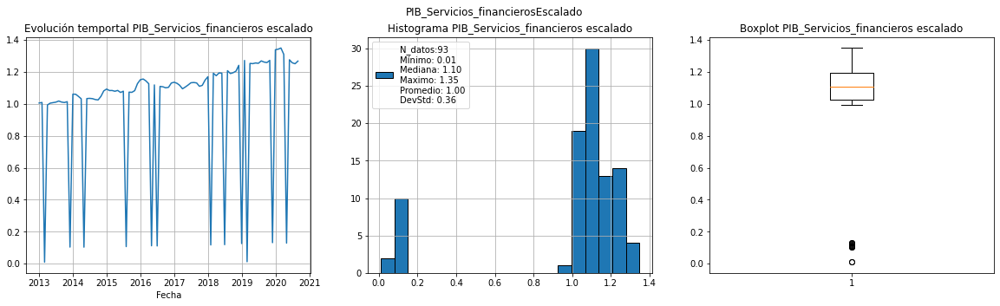

<Figure size 720x360 with 0 Axes>

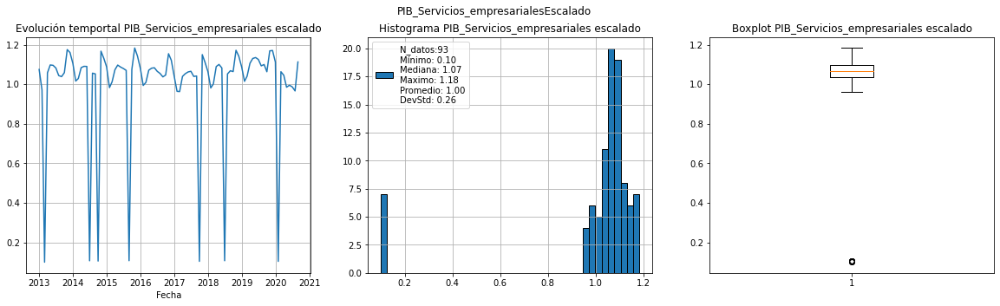

<Figure size 720x360 with 0 Axes>

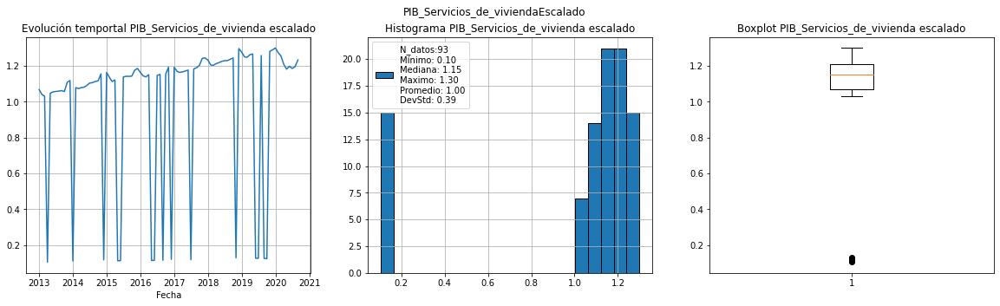

<Figure size 720x360 with 0 Axes>

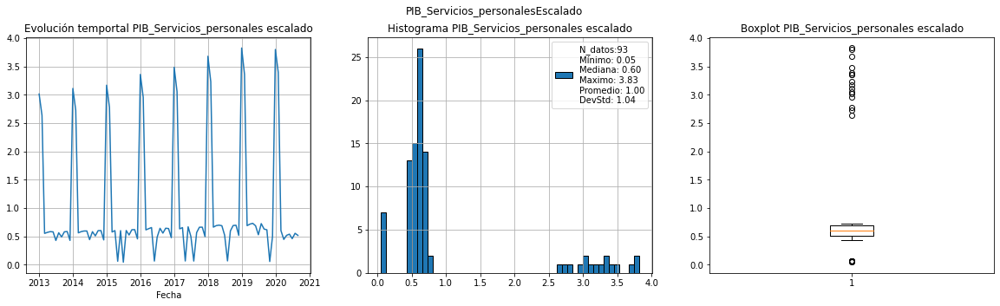

<Figure size 720x360 with 0 Axes>

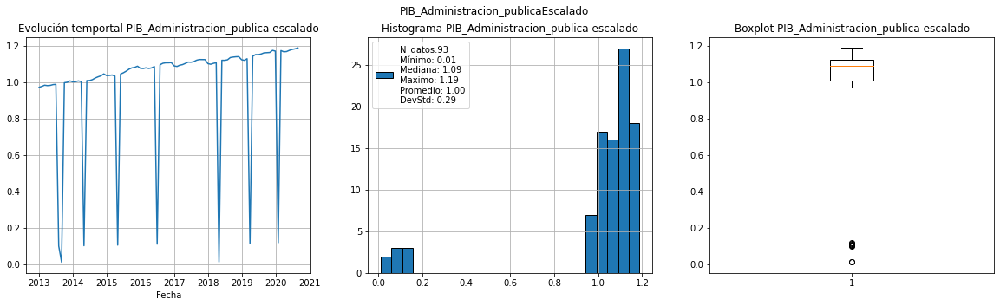

<Figure size 720x360 with 0 Axes>

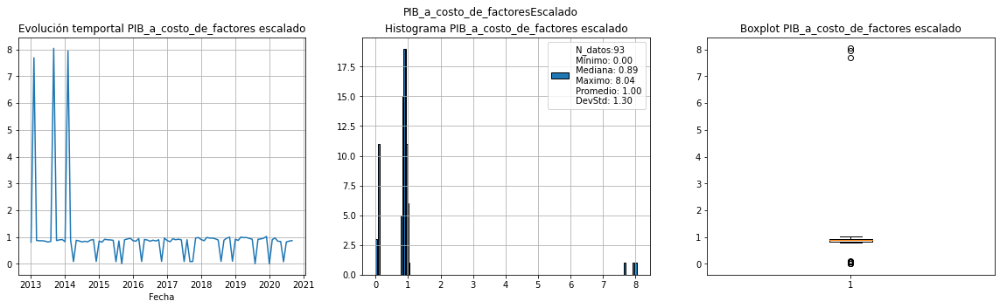

<Figure size 720x360 with 0 Axes>

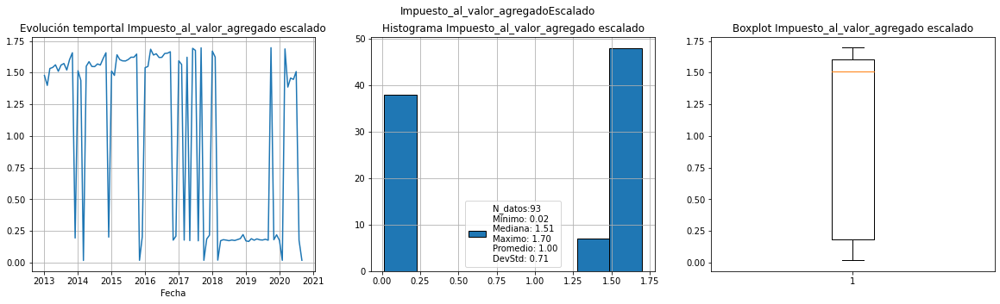

<Figure size 720x360 with 0 Axes>

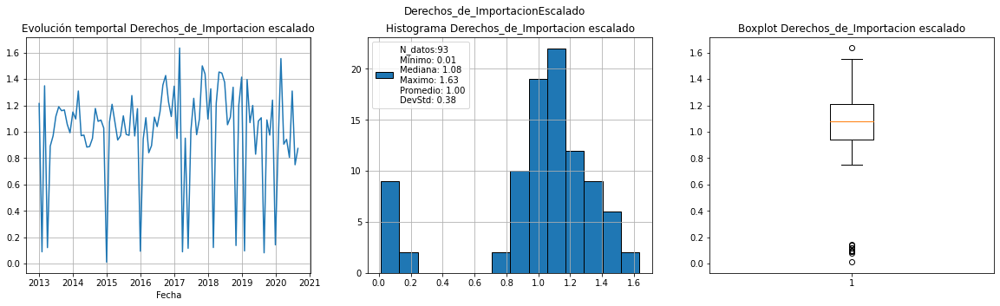

<Figure size 720x360 with 0 Axes>

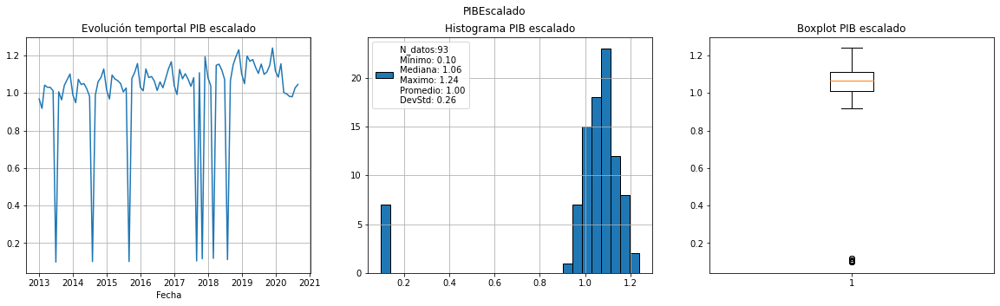

<Figure size 720x360 with 0 Axes>

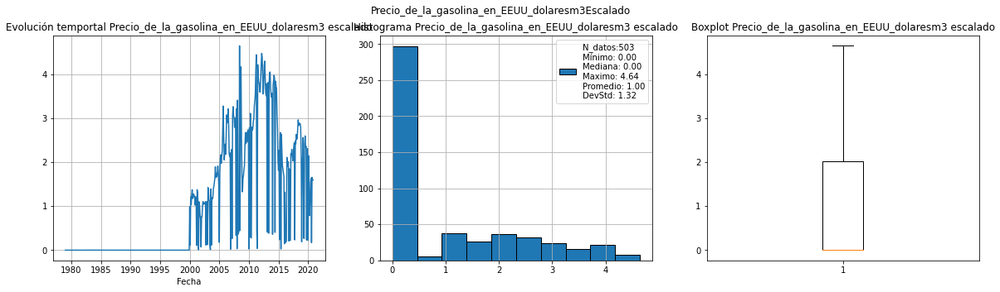

<Figure size 720x360 with 0 Axes>

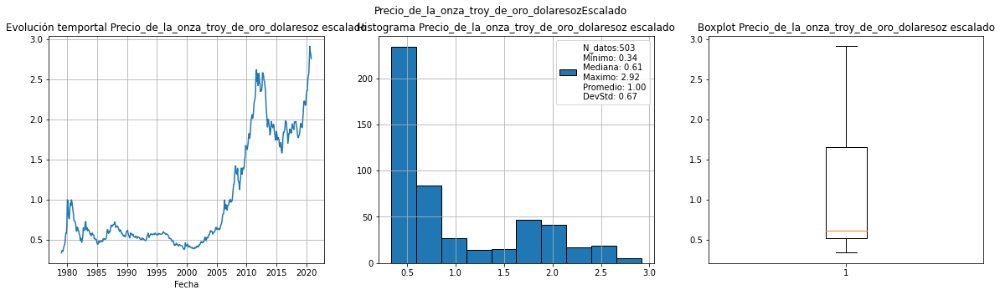

<Figure size 720x360 with 0 Axes>

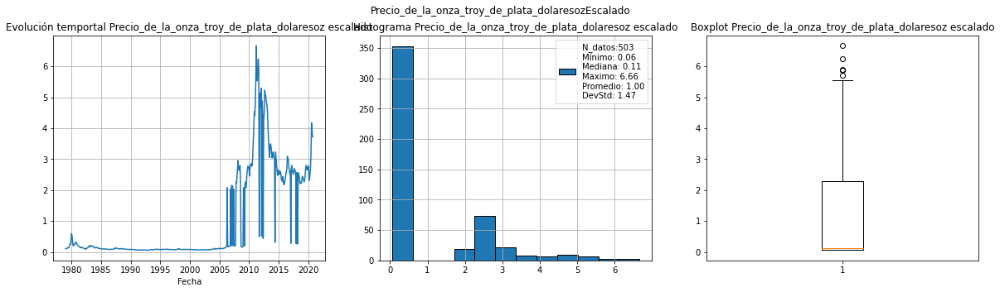

<Figure size 720x360 with 0 Axes>

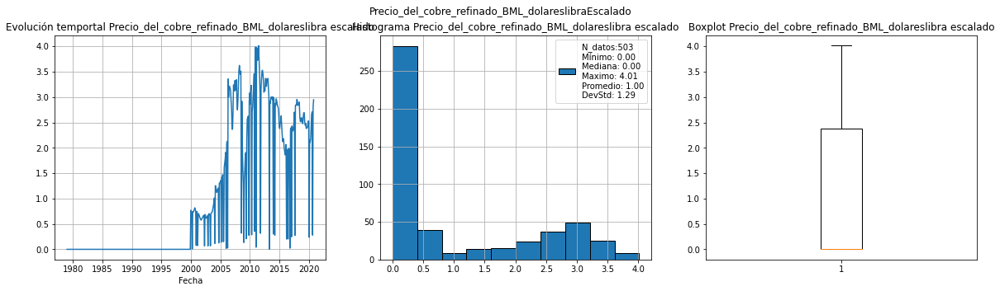

<Figure size 720x360 with 0 Axes>

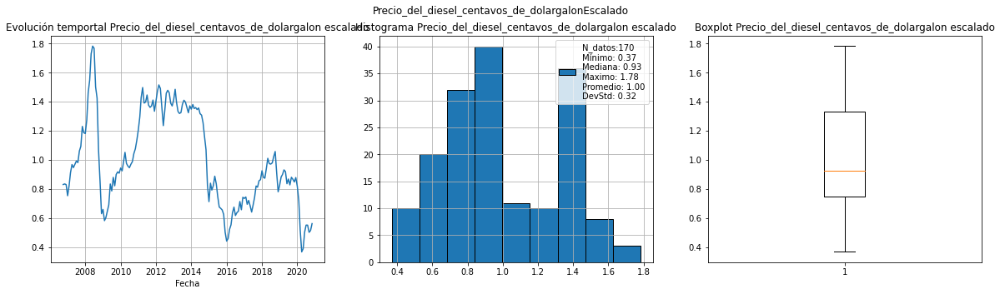

<Figure size 720x360 with 0 Axes>

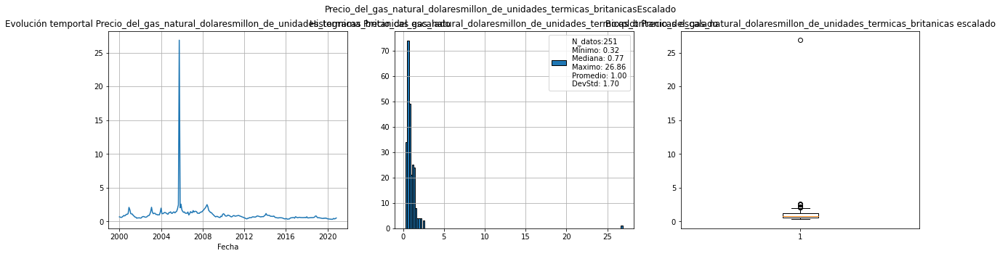

<Figure size 720x360 with 0 Axes>

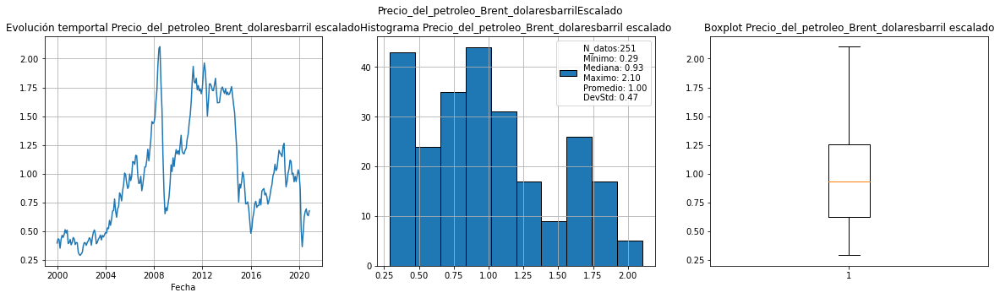

<Figure size 720x360 with 0 Axes>

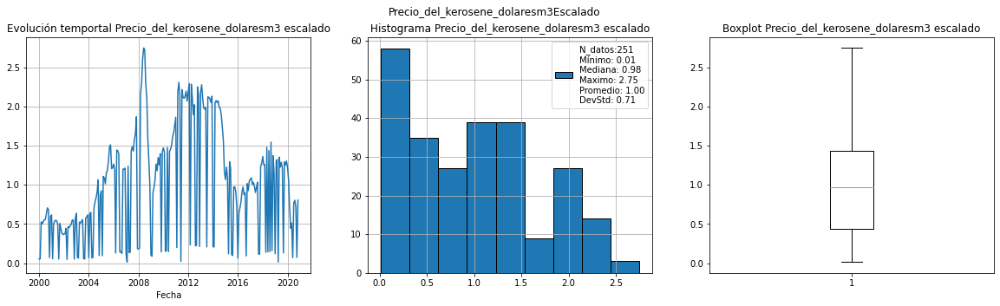

<Figure size 720x360 with 0 Axes>

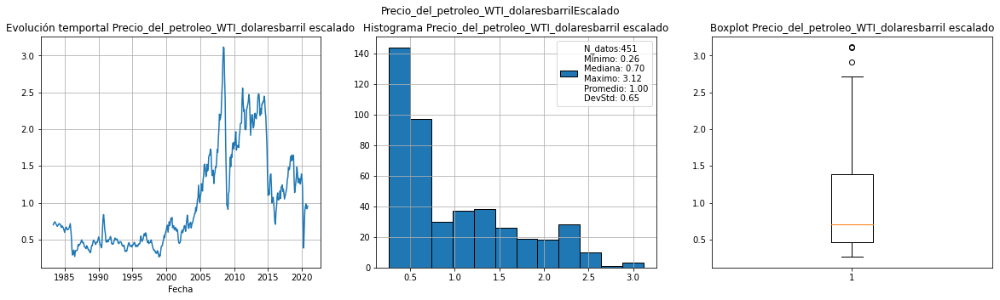

<Figure size 720x360 with 0 Axes>

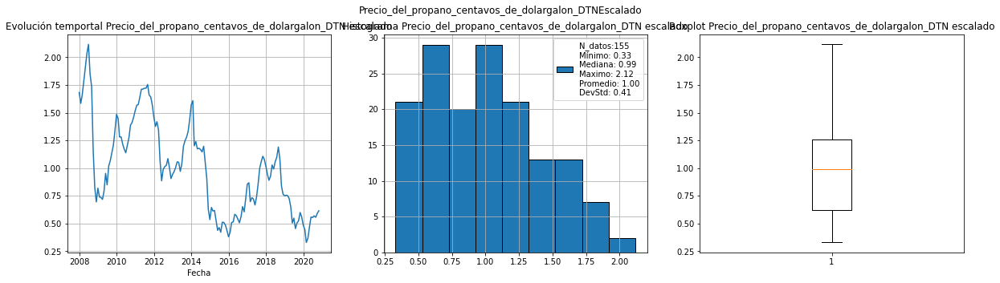

<Figure size 720x360 with 0 Axes>

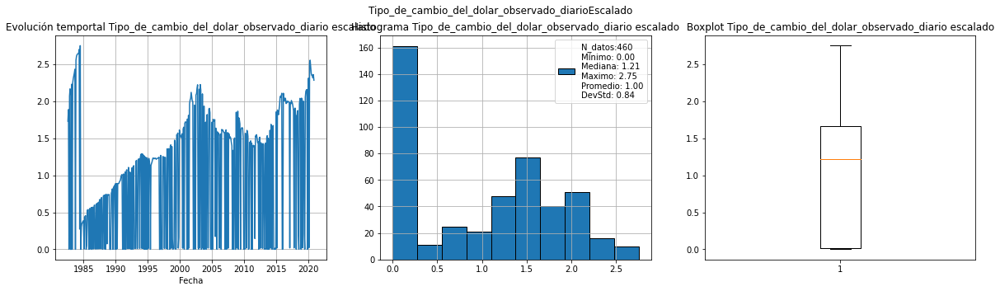

<Figure size 720x360 with 0 Axes>

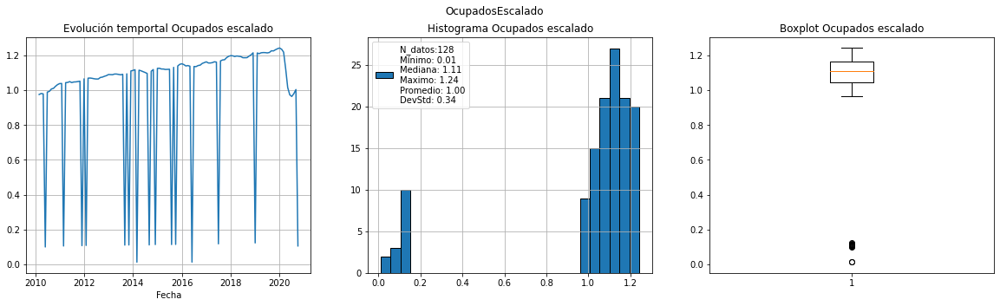

<Figure size 720x360 with 0 Axes>

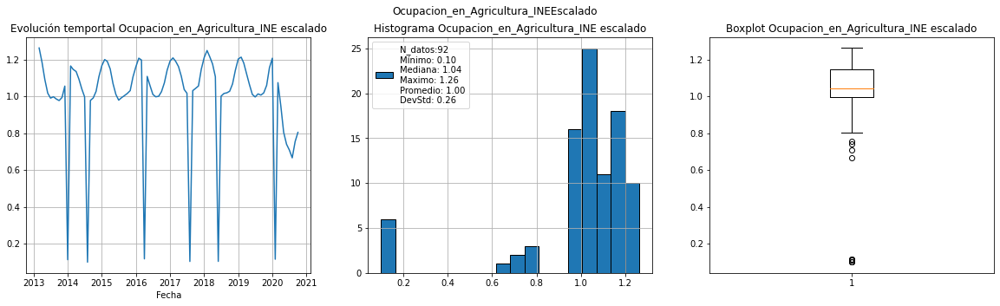

<Figure size 720x360 with 0 Axes>

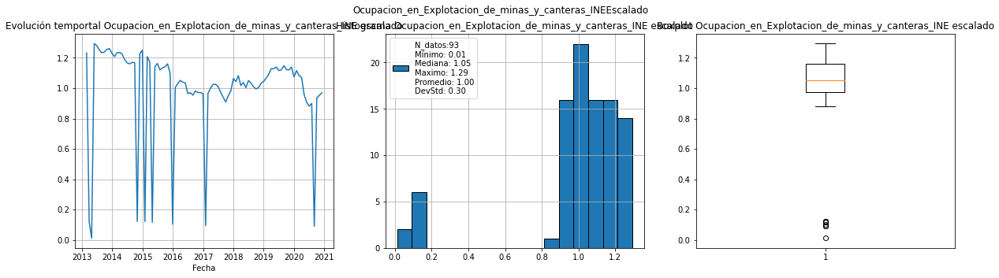

<Figure size 720x360 with 0 Axes>

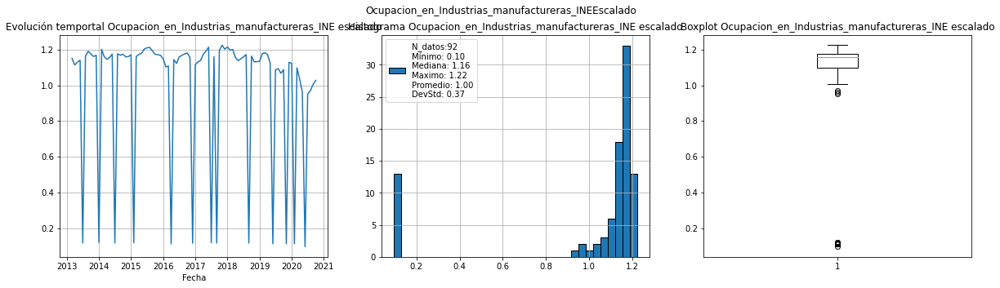

<Figure size 720x360 with 0 Axes>

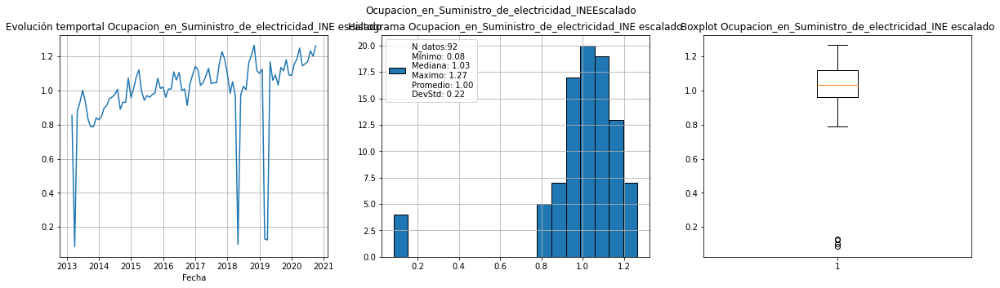

<Figure size 720x360 with 0 Axes>

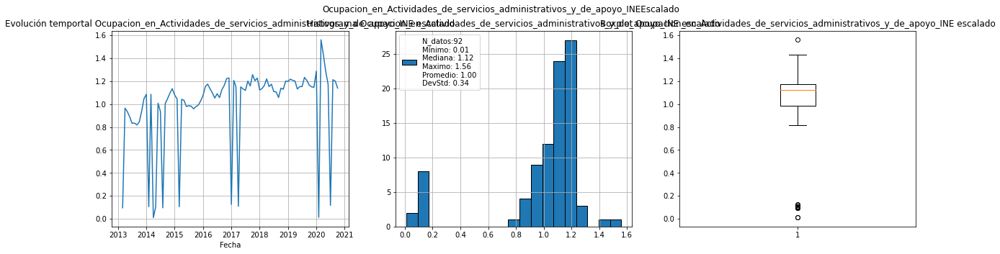

<Figure size 720x360 with 0 Axes>

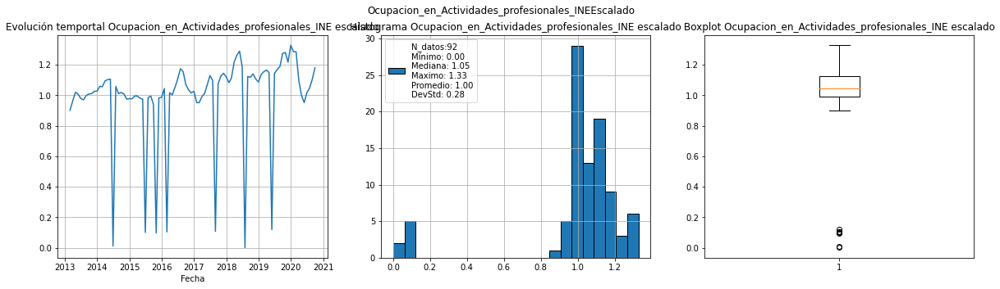

<Figure size 720x360 with 0 Axes>

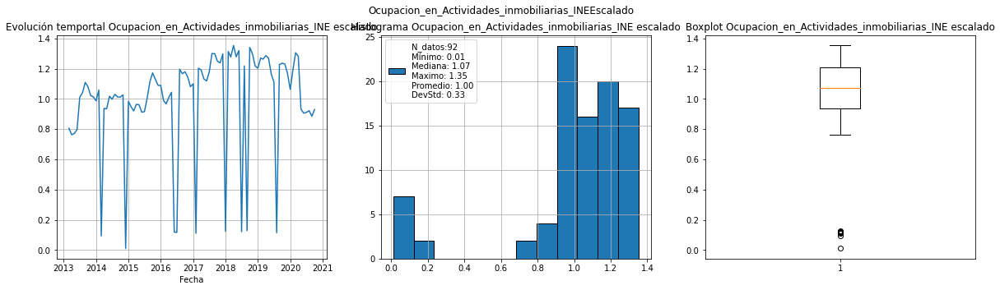

<Figure size 720x360 with 0 Axes>

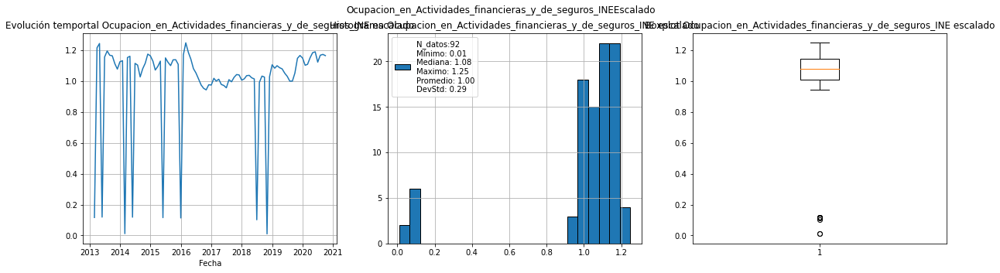

<Figure size 720x360 with 0 Axes>

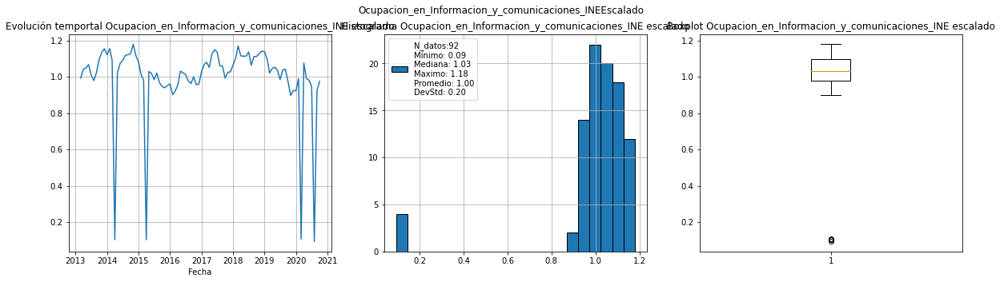

<Figure size 720x360 with 0 Axes>

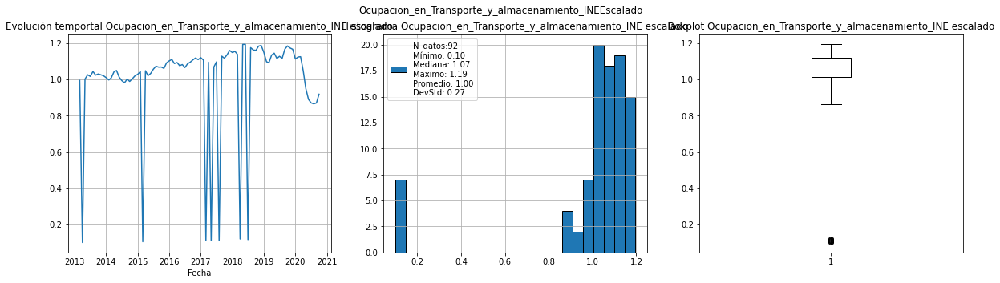

<Figure size 720x360 with 0 Axes>

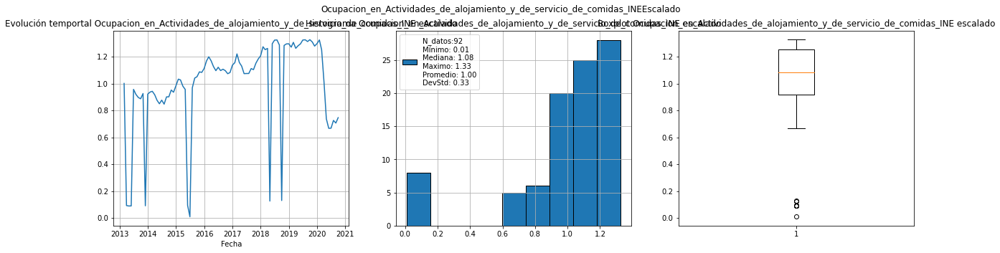

<Figure size 720x360 with 0 Axes>

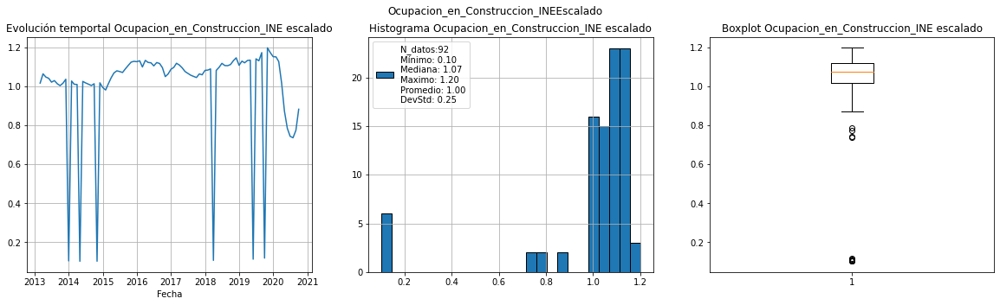

<Figure size 720x360 with 0 Axes>

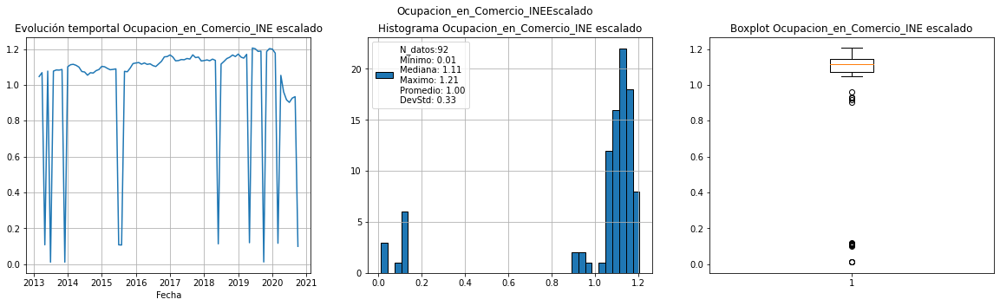

<Figure size 720x360 with 0 Axes>

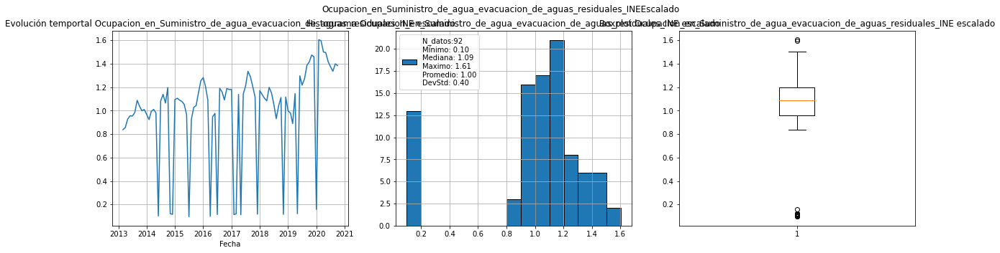

<Figure size 720x360 with 0 Axes>

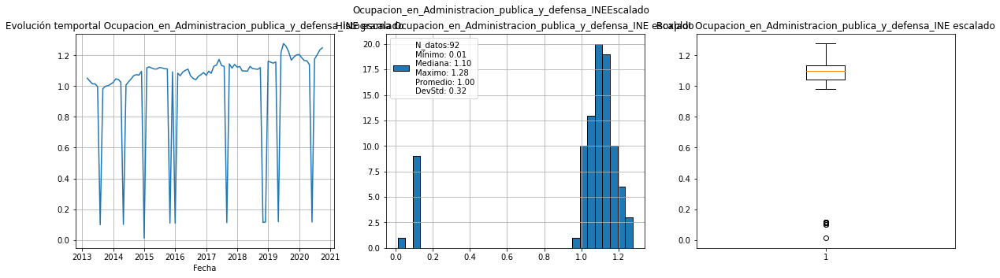

<Figure size 720x360 with 0 Axes>

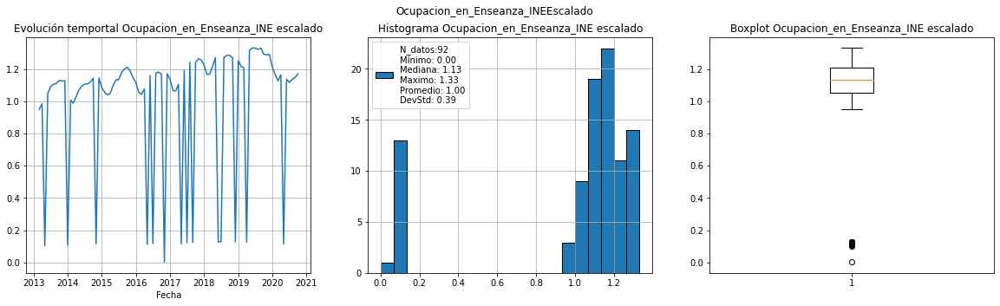

<Figure size 720x360 with 0 Axes>

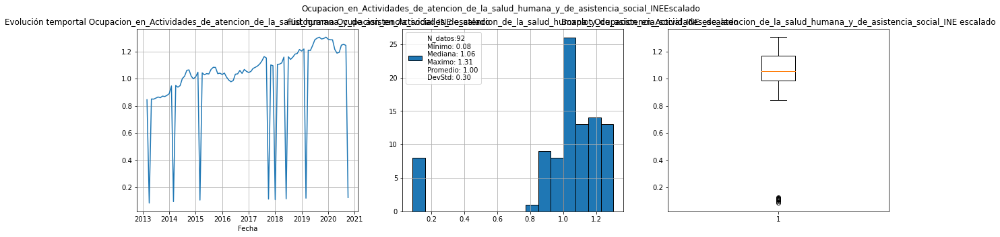

<Figure size 720x360 with 0 Axes>

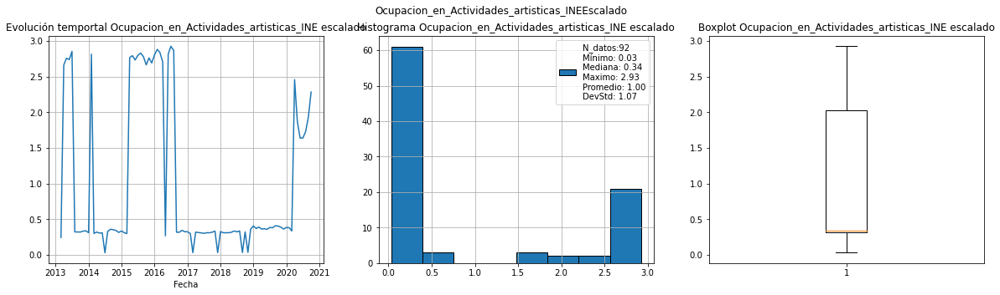

<Figure size 720x360 with 0 Axes>

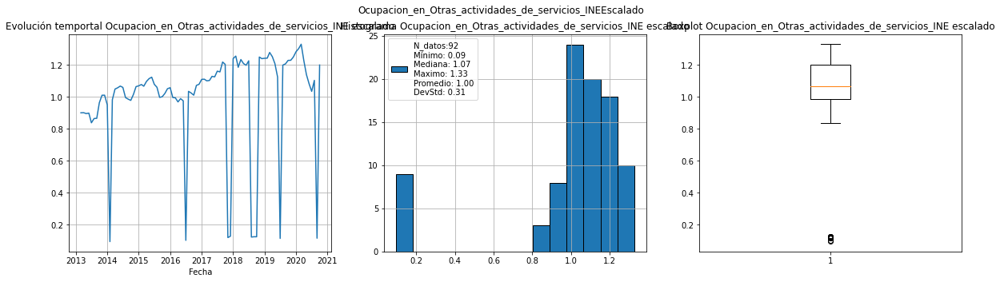

<Figure size 720x360 with 0 Axes>

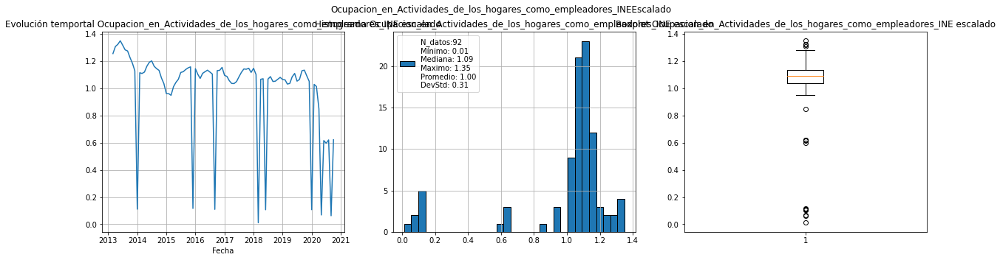

<Figure size 720x360 with 0 Axes>

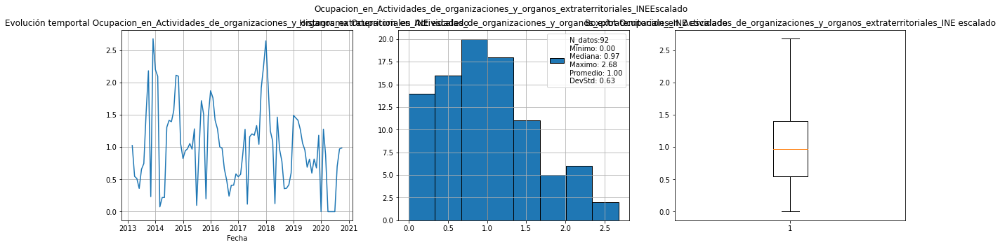

<Figure size 720x360 with 0 Axes>

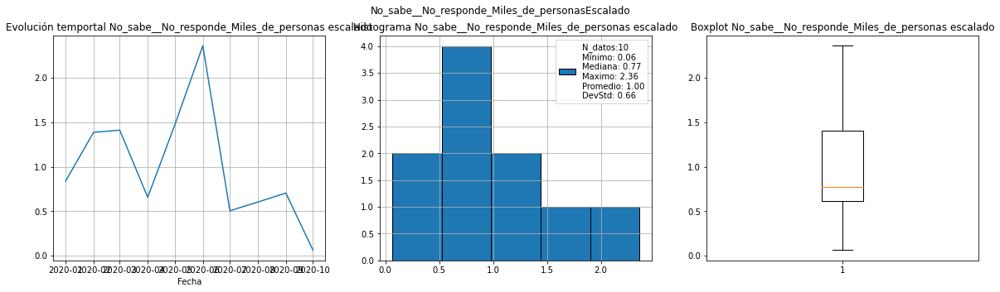

<Figure size 720x360 with 0 Axes>

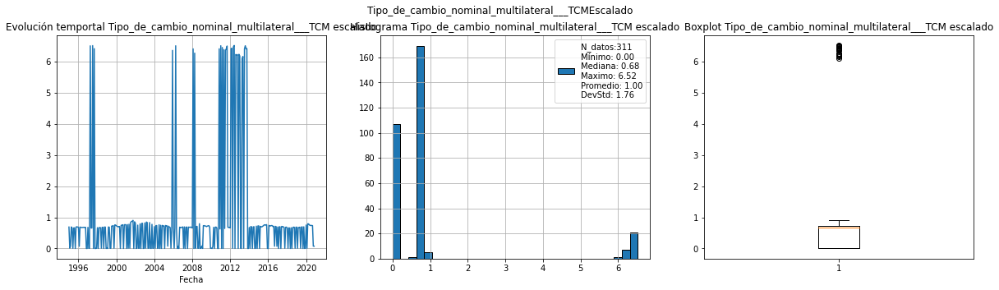

<Figure size 720x360 with 0 Axes>

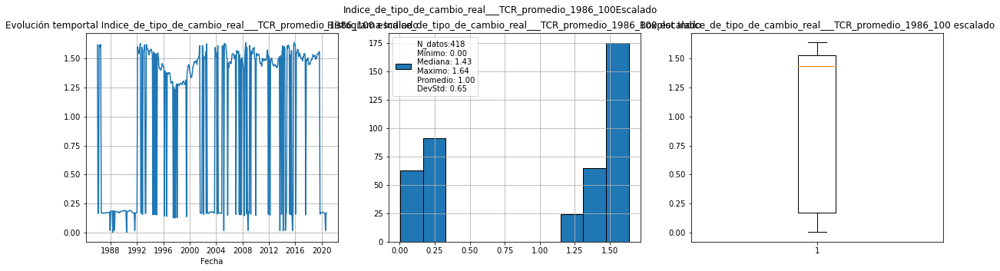

<Figure size 720x360 with 0 Axes>

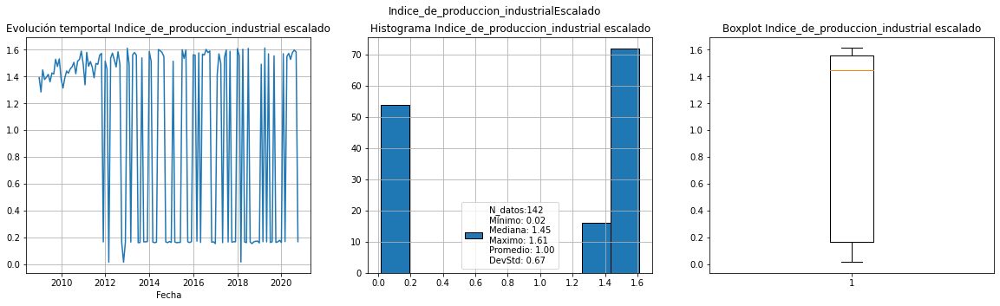

<Figure size 720x360 with 0 Axes>

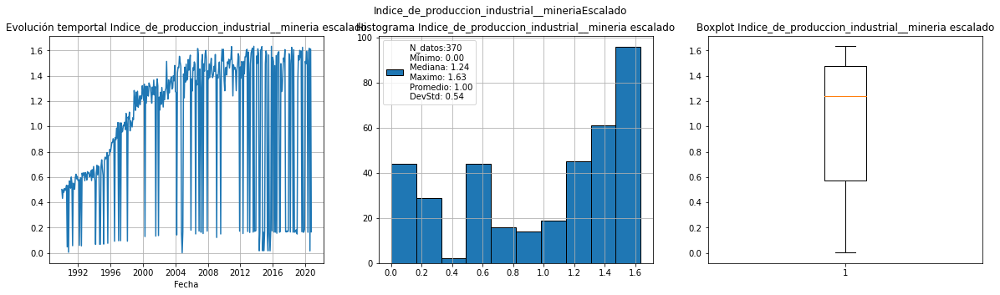

<Figure size 720x360 with 0 Axes>

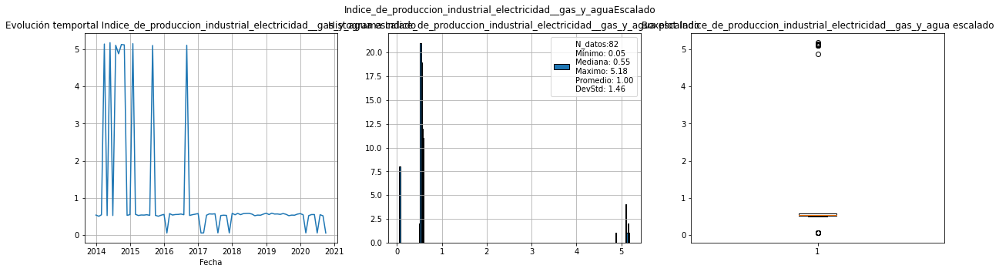

<Figure size 720x360 with 0 Axes>

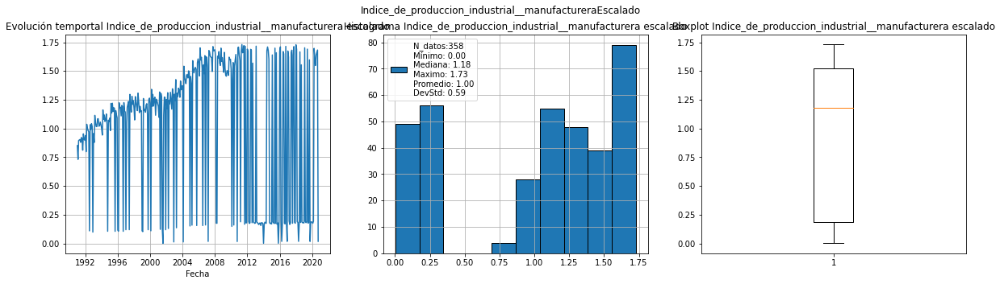

<Figure size 720x360 with 0 Axes>

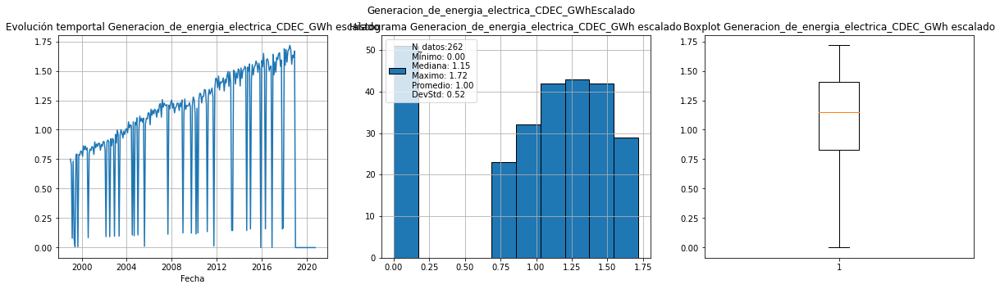

<Figure size 720x360 with 0 Axes>

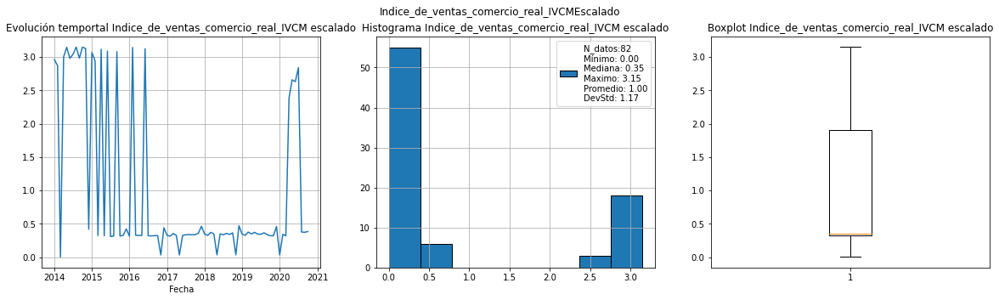

<Figure size 720x360 with 0 Axes>

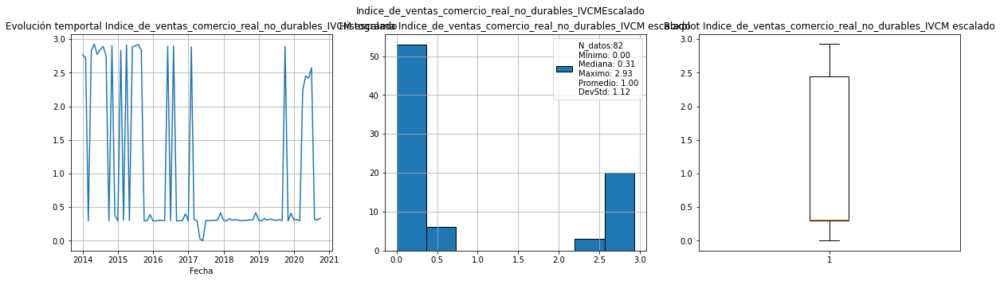

<Figure size 720x360 with 0 Axes>

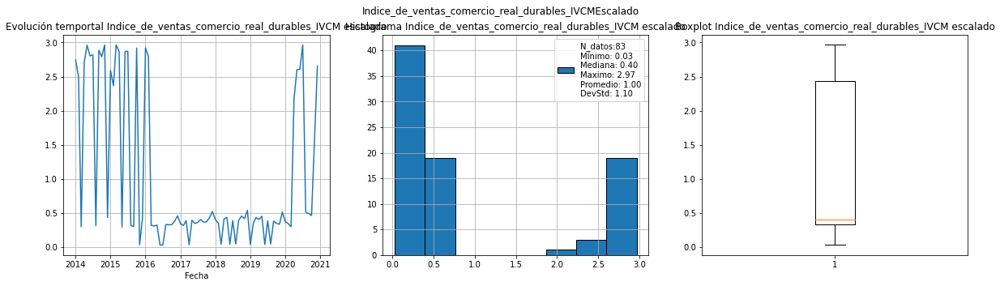

<Figure size 720x360 with 0 Axes>

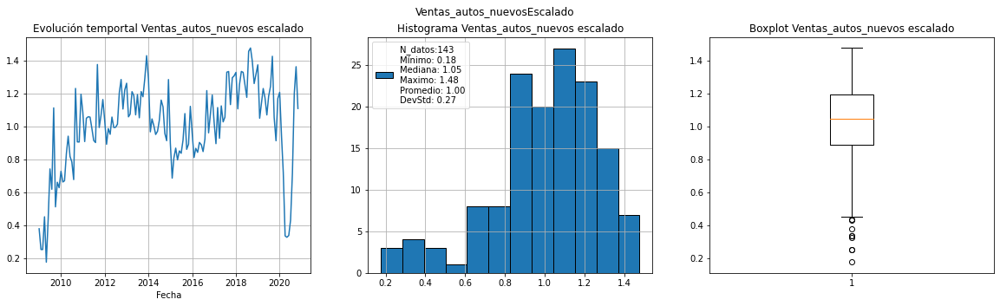

In [16]:
for col in columnas_banco:
    plt.figure(figsize=(10,5))
    plot_linea_hist(col)
    plt.suptitle(col+'Escalado')
    plt.show()

In [17]:
columnas_banco_2=['Ventas_autos_nuevos',
            'Precio_del_petroleo_WTI_dolaresbarril','Precio_del_petroleo_Brent_dolaresbarril',
                         'Precio_del_diesel_centavos_de_dolargalon','Precio_de_la_onza_troy_de_oro_dolaresoz',
                         'Precio_del_propano_centavos_de_dolargalon_DTN'
                         ,'PIB_Servicios_personales','PIB_Refinacion_de_petroleo',
                        'Precio_del_gas_natural_dolaresmillon_de_unidades_termicas_britanicas',
                        'Precio_del_cobre_refinado_BML_dolareslibra',
                        'Precio_de_la_onza_troy_de_plata_dolaresoz']
###Guaramos columnas que no requieran ser modificadas o que requieran un modificación epsecial

In [18]:
from functools import partial
def trans_col_p(escala,x):
    if x/escala>=10:
        return x/100
    if x/escala>=3:
        return x/10
    if  x/escala<=0.00003:
        return x*100000
    
    if  x/escala<=0.0003:
        return x*10000
    
    if  x/escala<=0.003:
        return x*1000
    if  x/escala<=0.03:
        return x*100
    
    
    if x/escala<=0.3:
        return x*10
        
    return x
for col in columnas_banco:
    if col not in columnas_banco_2:
        df_merged[col]=df_merged[col].apply(partial(trans_col_p,df_merged[col].mean()) )
###El PIB del petroleo esta desestacionalizado

In [19]:
def trans_PIB_Servicios_personales(scal,x):
    if x/scal<0.2:
        return x*10
    
    if x/scal>1.5:
        return x/10
        
    return x
def trans_Precio_del_gas_natural_dolaresmillon_de_unidades_termicas_britanicas(scal,x):

    if x/scal>5:
        return x/100
        
    return x

def trans_PIB_Refinacion_de_petroleo(scal,x):
    if x/scal<0.2:
        return x*10
    
    if x/scal>1.0:
        return x/10
        
    return x
def trans_Indice_de_ventas_comercio_real_durables_IVCM(scal,x):
    if x/scal<0.15:
        return x*10
    
    if x/scal>1.0:
        return x/10
        
    return x

df_merged['Precio_del_gas_natural_dolaresmillon_de_unidades_termicas_britanicas']=df_merged['Precio_del_gas_natural_dolaresmillon_de_unidades_termicas_britanicas'].apply(
    partial(trans_Precio_del_gas_natural_dolaresmillon_de_unidades_termicas_britanicas,df_merged['Precio_del_gas_natural_dolaresmillon_de_unidades_termicas_britanicas'].mean()) )

df_merged['PIB_Servicios_personales']=df_merged['PIB_Servicios_personales'].apply(
    partial(trans_PIB_Servicios_personales,df_merged['PIB_Servicios_personales'].mean()) )

df_merged['PIB_Refinacion_de_petroleo']=df_merged['PIB_Refinacion_de_petroleo'].apply(
    partial(trans_PIB_Refinacion_de_petroleo,df_merged['PIB_Refinacion_de_petroleo'].mean()) )

df_merged['Indice_de_ventas_comercio_real_durables_IVCM']=df_merged['Indice_de_ventas_comercio_real_durables_IVCM'].apply(
    partial(trans_Indice_de_ventas_comercio_real_durables_IVCM,
            df_merged['Indice_de_ventas_comercio_real_durables_IVCM'].mean()) )

df_merged['Indice_de_ventas_comercio_real_no_durables_IVCM']=df_merged['Indice_de_ventas_comercio_real_no_durables_IVCM'].apply(
    partial(trans_Indice_de_ventas_comercio_real_durables_IVCM,
            df_merged['Indice_de_ventas_comercio_real_no_durables_IVCM'].mean()) )

df_merged['Indice_de_ventas_comercio_real_IVCM']=df_merged['Indice_de_ventas_comercio_real_IVCM'].apply(
    partial(trans_Indice_de_ventas_comercio_real_durables_IVCM,
            df_merged['Indice_de_ventas_comercio_real_IVCM'].mean()) )

df_merged['Precio_del_cobre_refinado_BML_dolareslibra']=df_merged['Precio_del_cobre_refinado_BML_dolareslibra'].apply(
    partial(trans_Indice_de_ventas_comercio_real_durables_IVCM,
            df_merged['Precio_del_cobre_refinado_BML_dolareslibra'].mean()) )

df_merged['Precio_de_la_onza_troy_de_plata_dolaresoz']=df_merged['Precio_de_la_onza_troy_de_plata_dolaresoz'].apply(
    partial(trans_Indice_de_ventas_comercio_real_durables_IVCM,
            df_merged['Precio_de_la_onza_troy_de_plata_dolaresoz'].mean()) )
df_merged['Precio_del_gas_natural_dolaresmillon_de_unidades_termicas_britanicas']=df_merged['Precio_del_gas_natural_dolaresmillon_de_unidades_termicas_britanicas'].apply(
    partial(trans_Indice_de_ventas_comercio_real_durables_IVCM,
            df_merged['Precio_del_gas_natural_dolaresmillon_de_unidades_termicas_britanicas'].mean()) )

In [20]:
def trans_Precio_del_gas_natural_dolaresmillon_de_unidades_termicas_britanicas_2(scal,x):

    if x/scal<0.7:
        return x*10
        
    return x
df_merged['Precio_del_gas_natural_dolaresmillon_de_unidades_termicas_britanicas']=df_merged['Precio_del_gas_natural_dolaresmillon_de_unidades_termicas_britanicas'].apply(
    partial(trans_Precio_del_gas_natural_dolaresmillon_de_unidades_termicas_britanicas_2,df_merged['Precio_del_gas_natural_dolaresmillon_de_unidades_termicas_britanicas'].mean()) )


In [21]:
df_merged.loc[df_merged['Fecha'].dt.year<1985,'Tipo_de_cambio_del_dolar_observado_diario']=(
    df_merged.loc[df_merged['Fecha'].dt.year<1985,'Tipo_de_cambio_del_dolar_observado_diario'])/10

<Figure size 720x360 with 0 Axes>

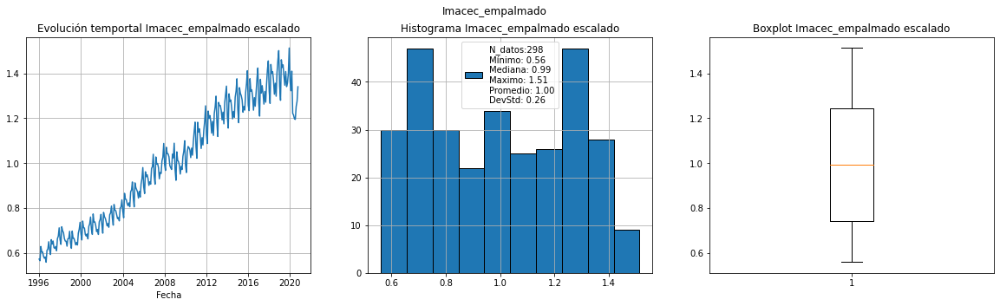

<Figure size 720x360 with 0 Axes>

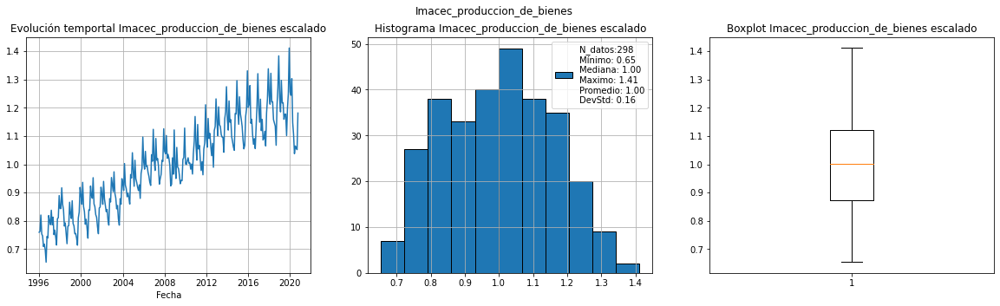

<Figure size 720x360 with 0 Axes>

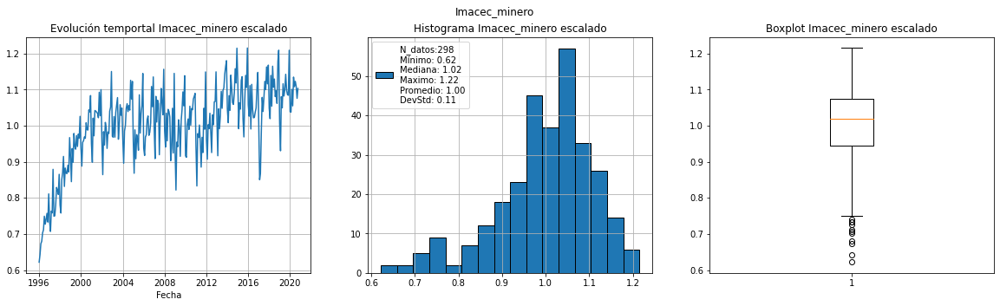

<Figure size 720x360 with 0 Axes>

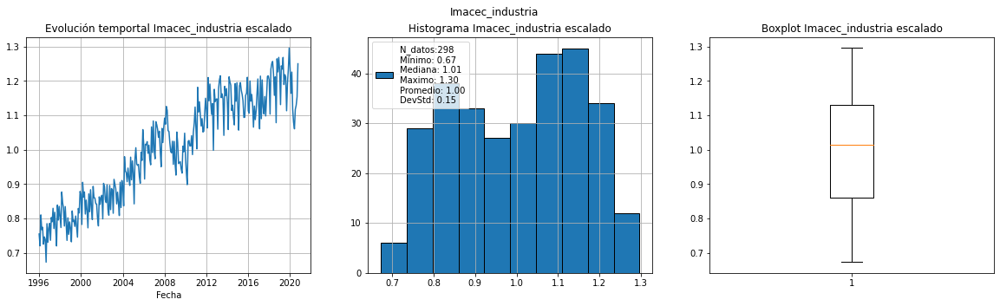

<Figure size 720x360 with 0 Axes>

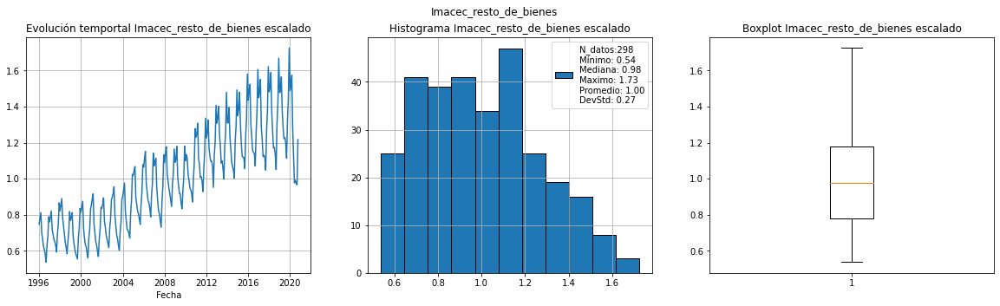

<Figure size 720x360 with 0 Axes>

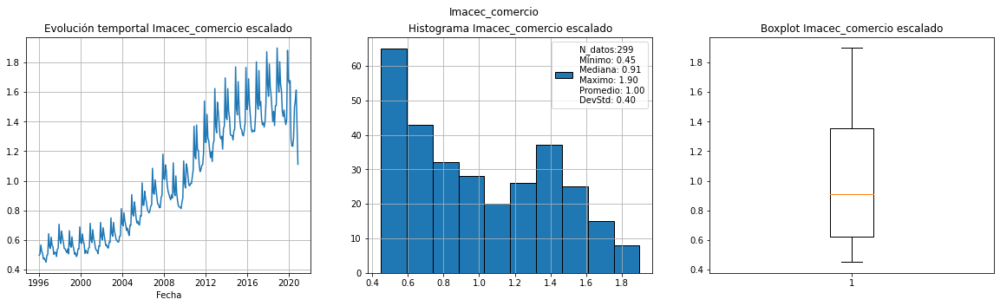

<Figure size 720x360 with 0 Axes>

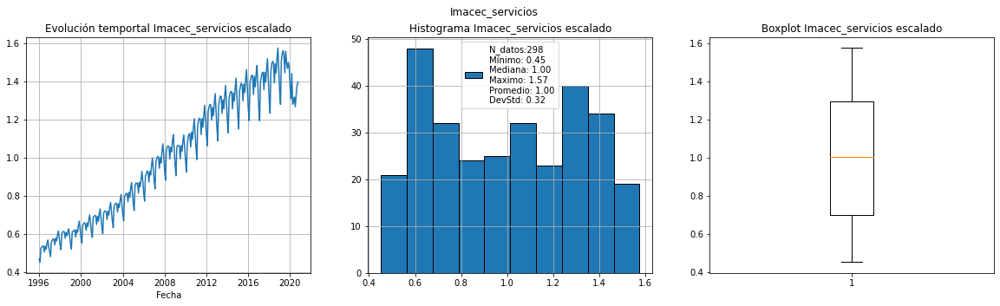

<Figure size 720x360 with 0 Axes>

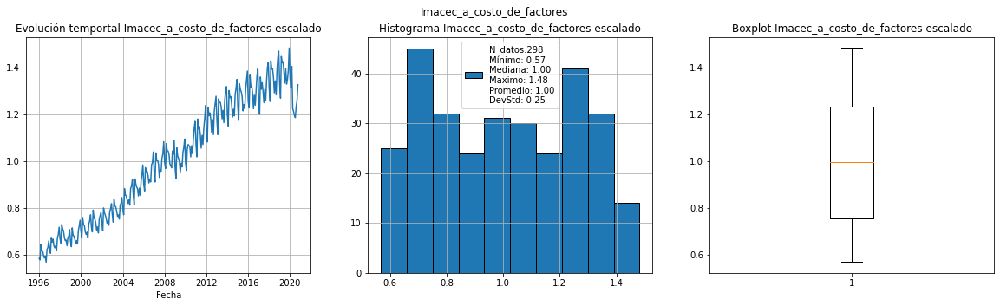

<Figure size 720x360 with 0 Axes>

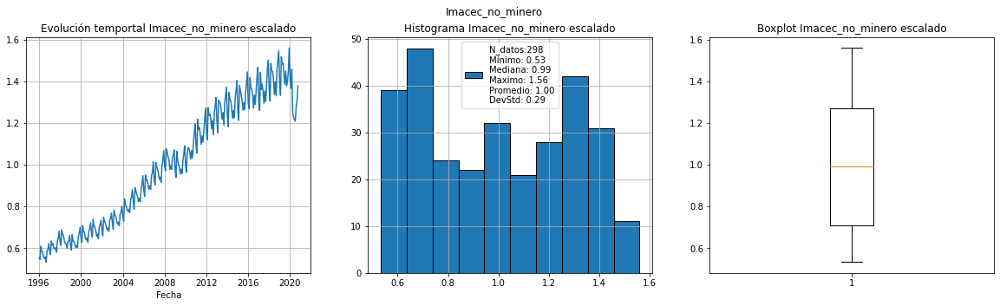

<Figure size 720x360 with 0 Axes>

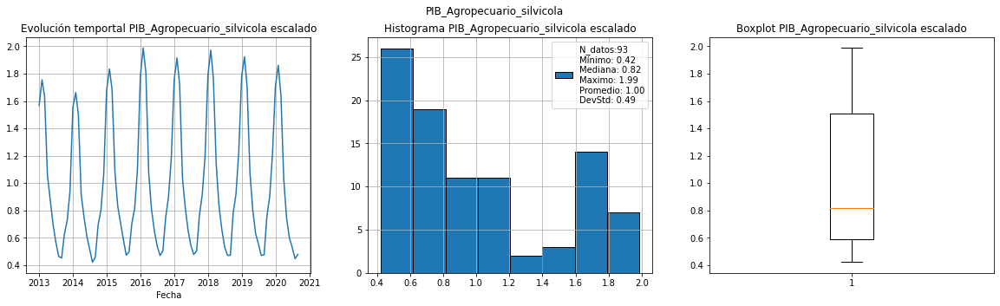

<Figure size 720x360 with 0 Axes>

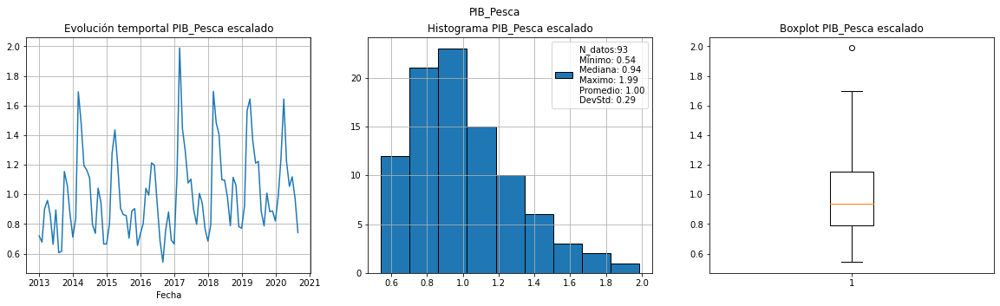

<Figure size 720x360 with 0 Axes>

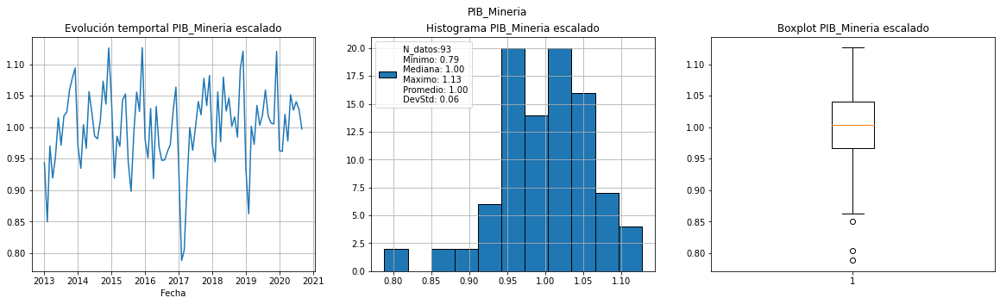

<Figure size 720x360 with 0 Axes>

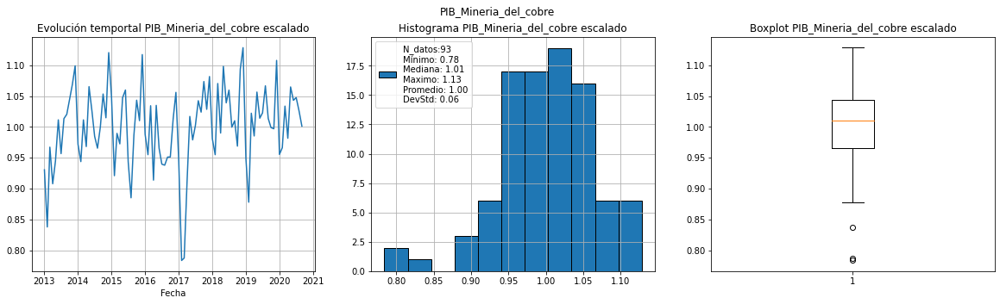

<Figure size 720x360 with 0 Axes>

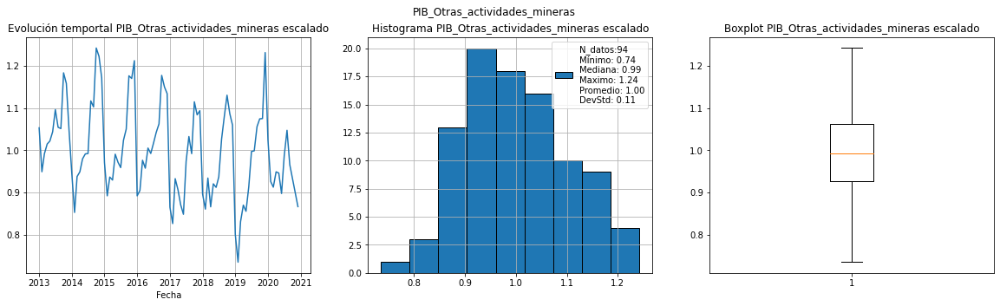

<Figure size 720x360 with 0 Axes>

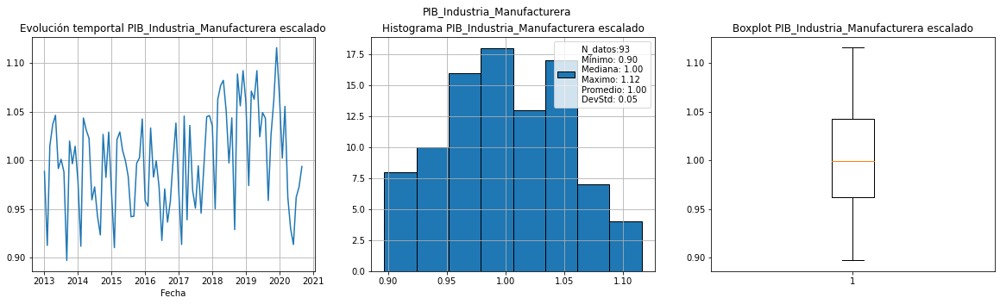

<Figure size 720x360 with 0 Axes>

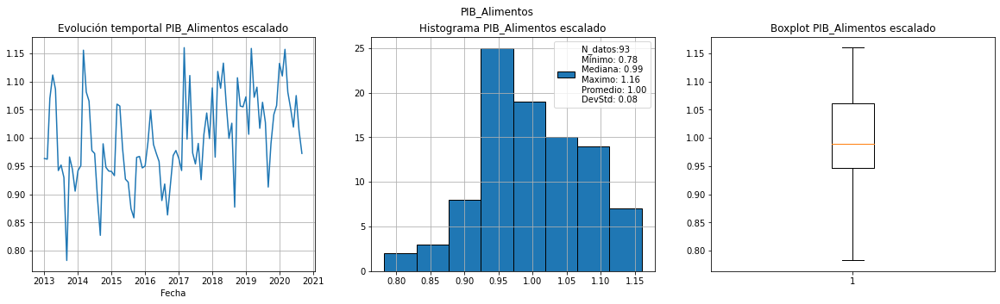

<Figure size 720x360 with 0 Axes>

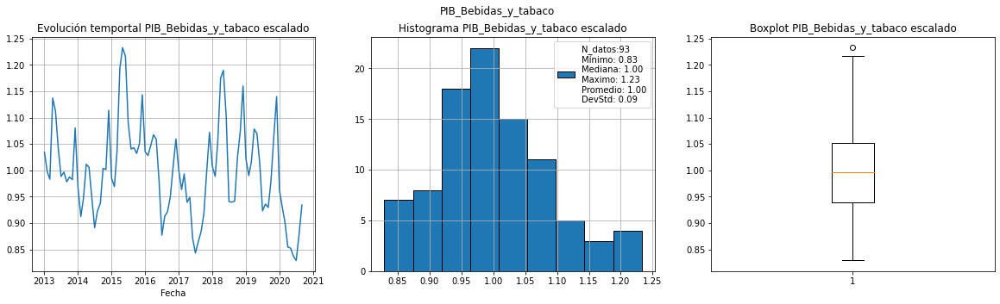

<Figure size 720x360 with 0 Axes>

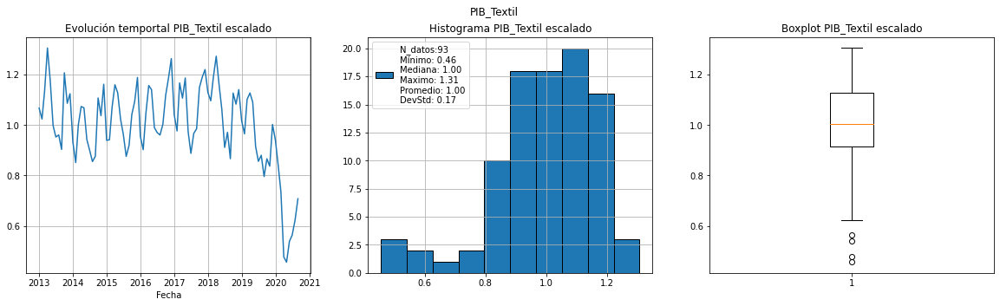

<Figure size 720x360 with 0 Axes>

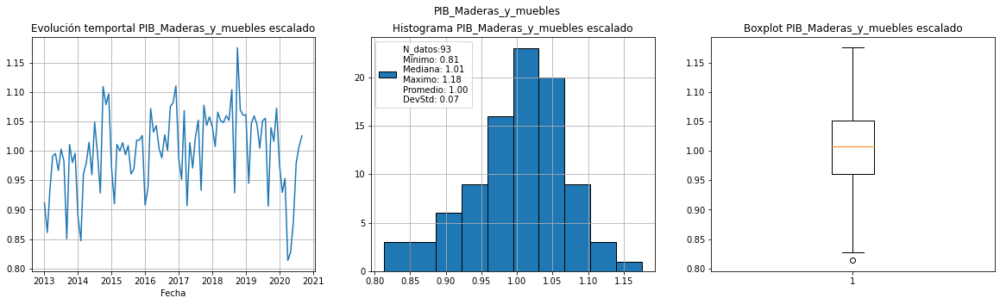

<Figure size 720x360 with 0 Axes>

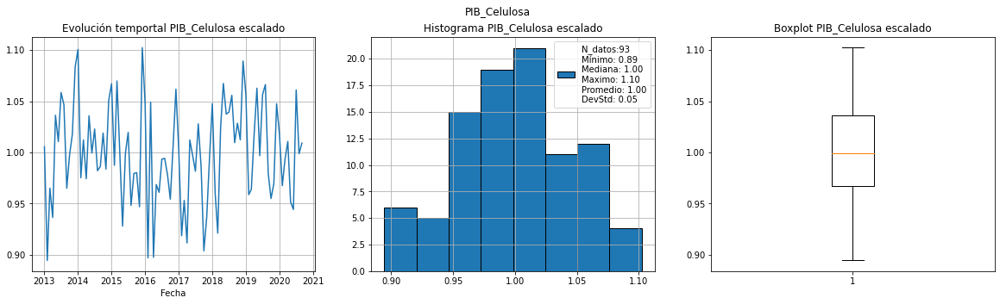

<Figure size 720x360 with 0 Axes>

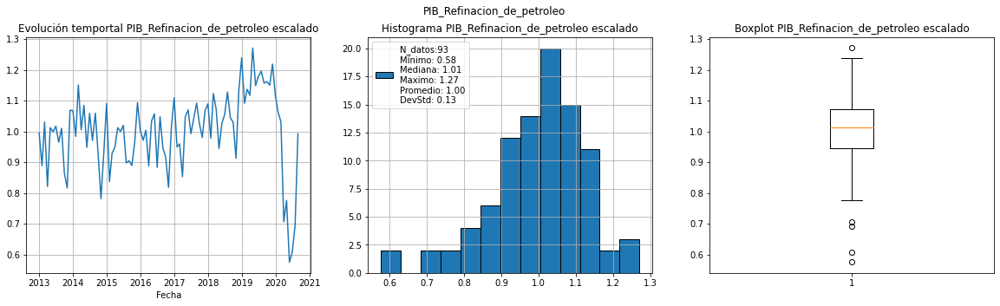

<Figure size 720x360 with 0 Axes>

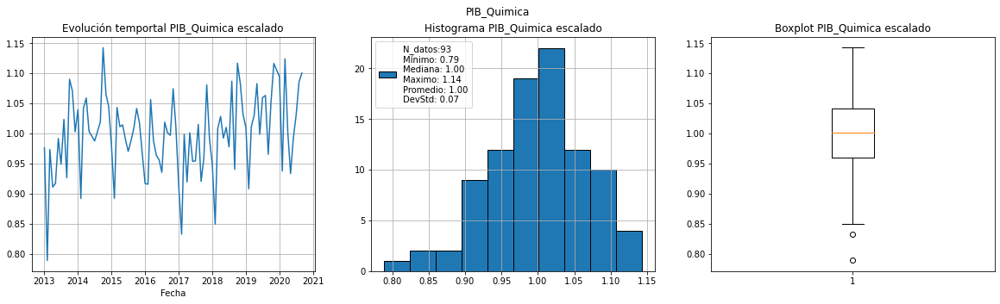

<Figure size 720x360 with 0 Axes>

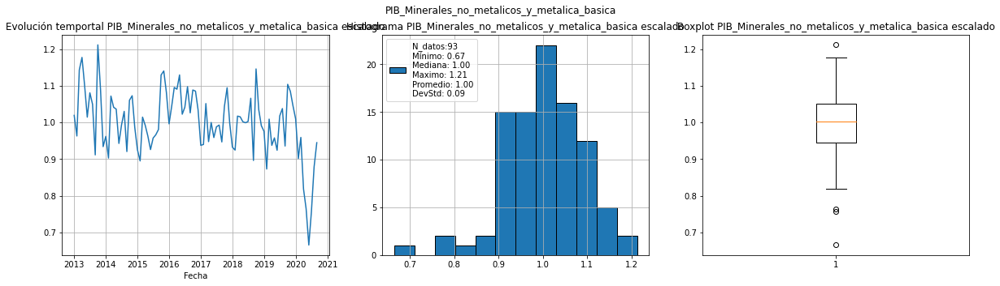

<Figure size 720x360 with 0 Axes>

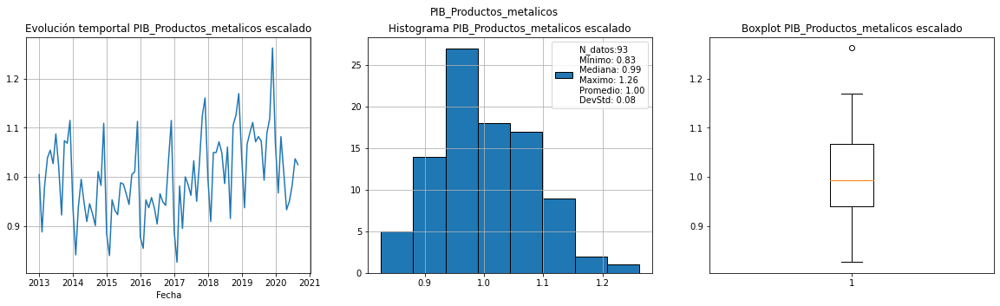

<Figure size 720x360 with 0 Axes>

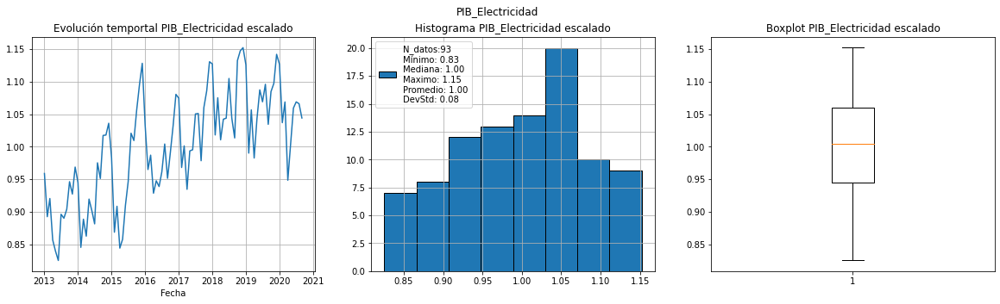

<Figure size 720x360 with 0 Axes>

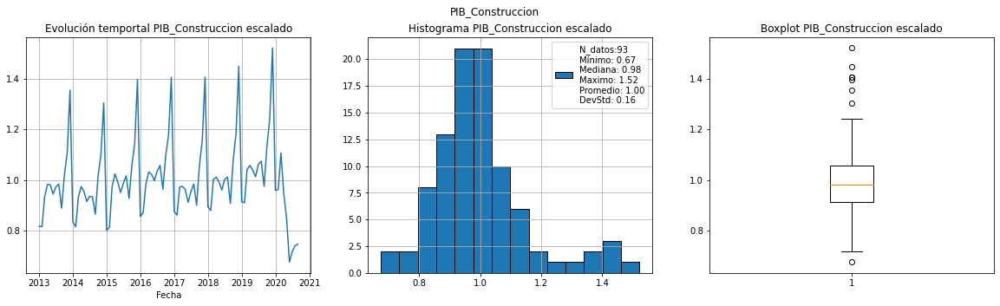

<Figure size 720x360 with 0 Axes>

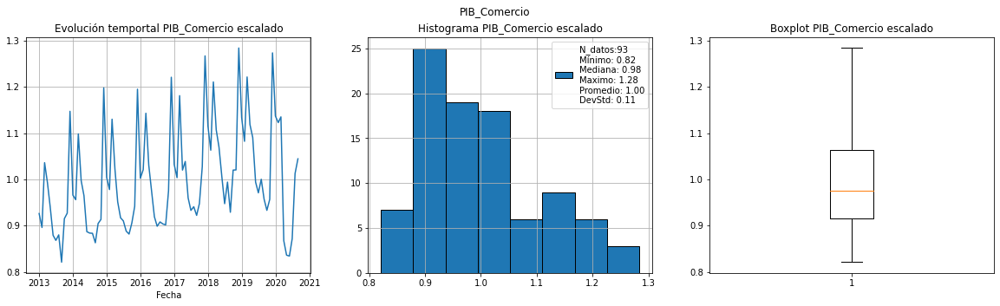

<Figure size 720x360 with 0 Axes>

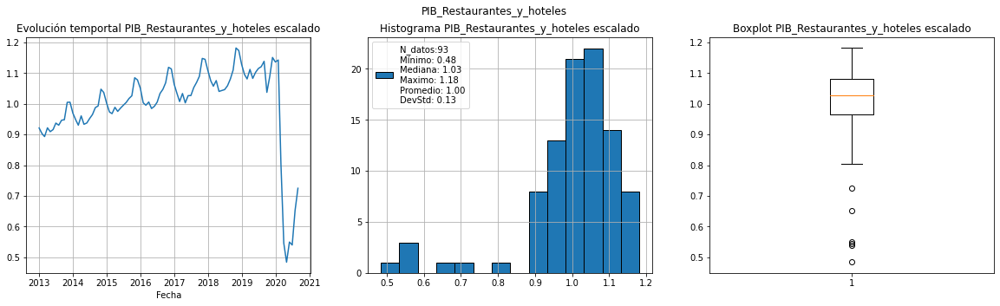

<Figure size 720x360 with 0 Axes>

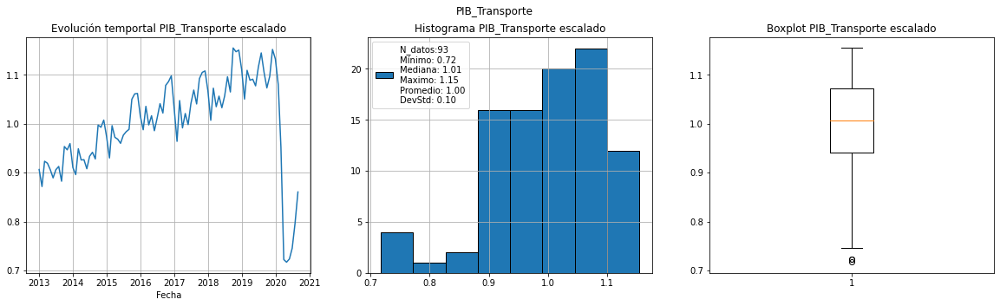

<Figure size 720x360 with 0 Axes>

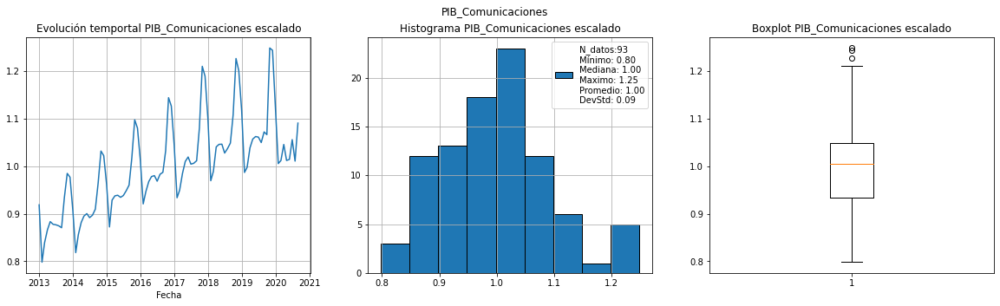

<Figure size 720x360 with 0 Axes>

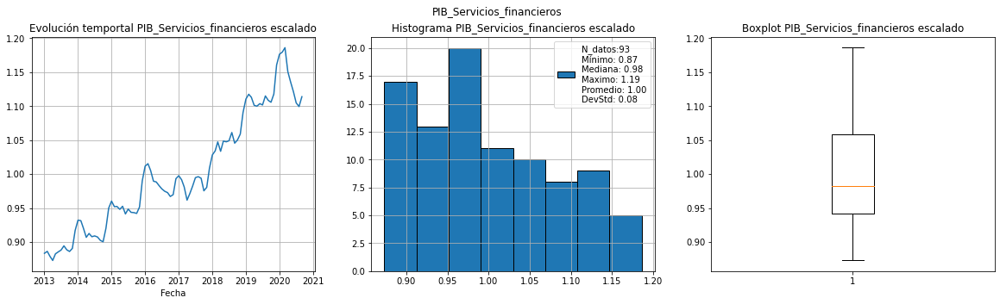

<Figure size 720x360 with 0 Axes>

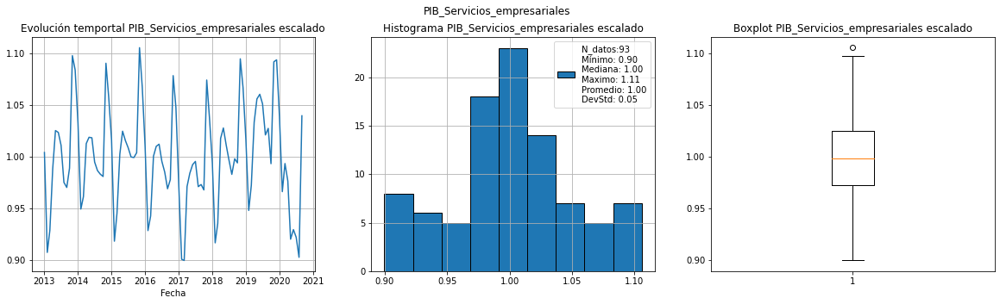

<Figure size 720x360 with 0 Axes>

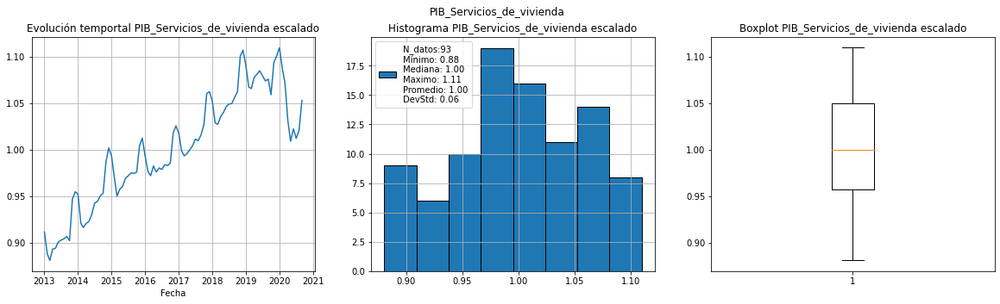

<Figure size 720x360 with 0 Axes>

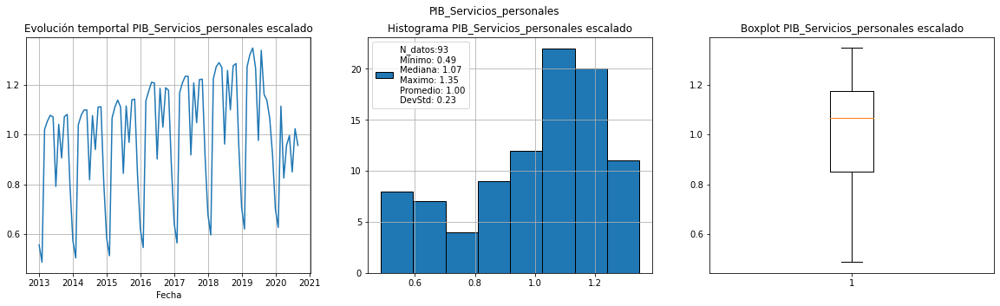

<Figure size 720x360 with 0 Axes>

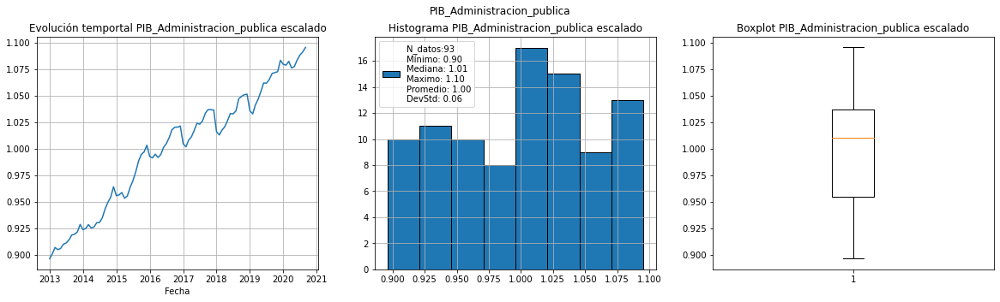

<Figure size 720x360 with 0 Axes>

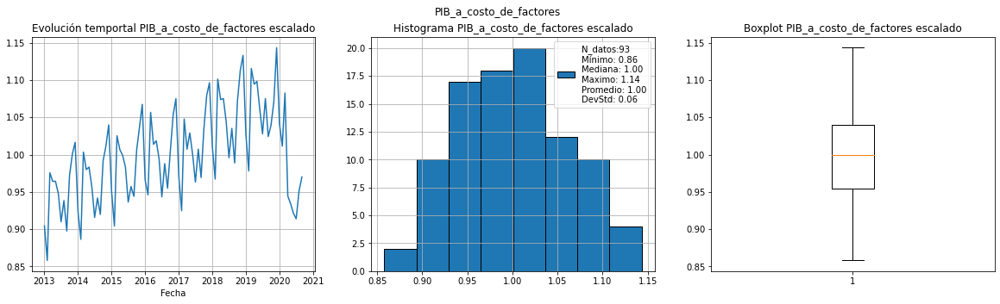

<Figure size 720x360 with 0 Axes>

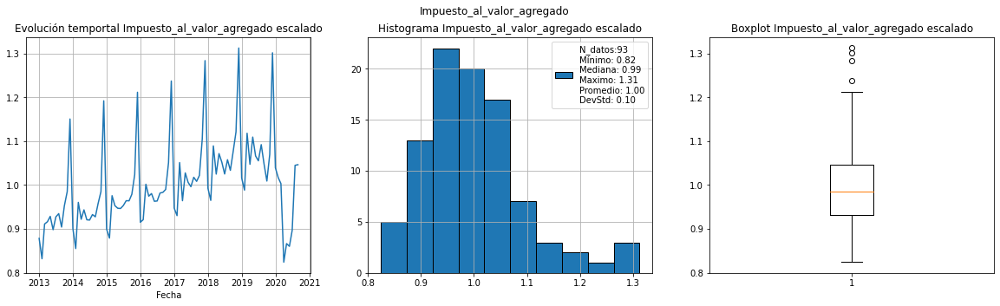

<Figure size 720x360 with 0 Axes>

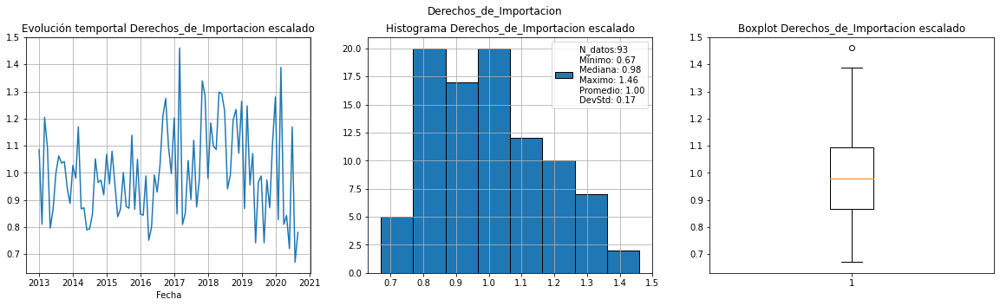

<Figure size 720x360 with 0 Axes>

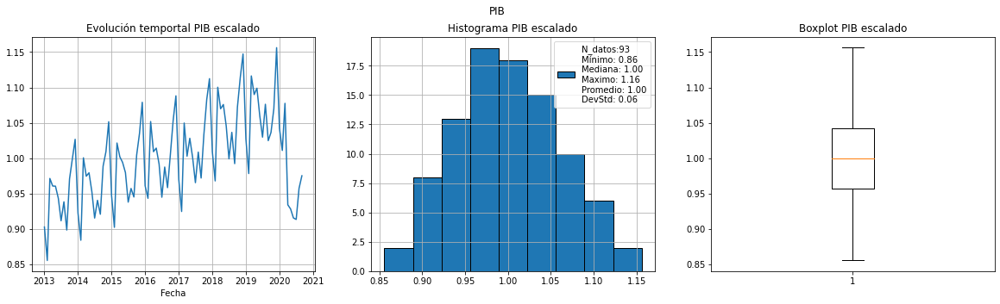

<Figure size 720x360 with 0 Axes>

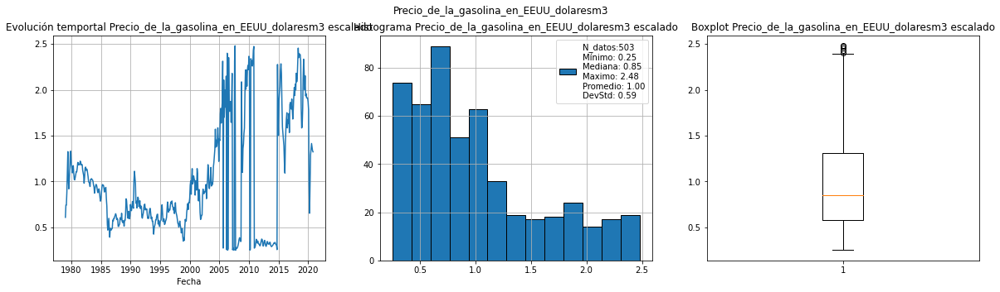

<Figure size 720x360 with 0 Axes>

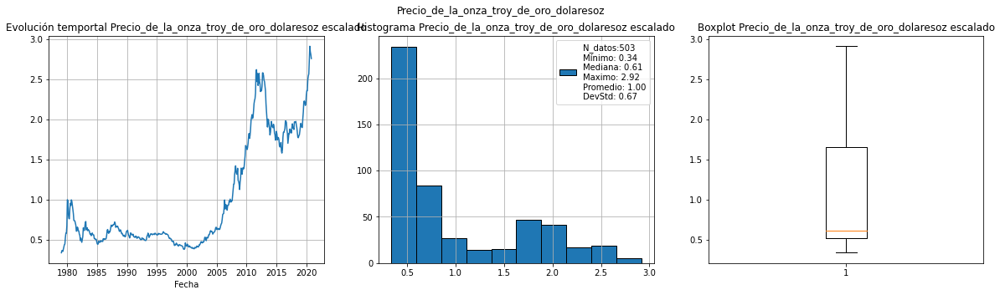

<Figure size 720x360 with 0 Axes>

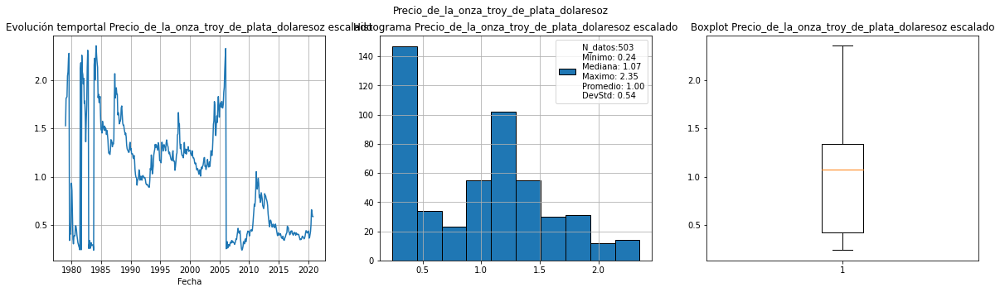

<Figure size 720x360 with 0 Axes>

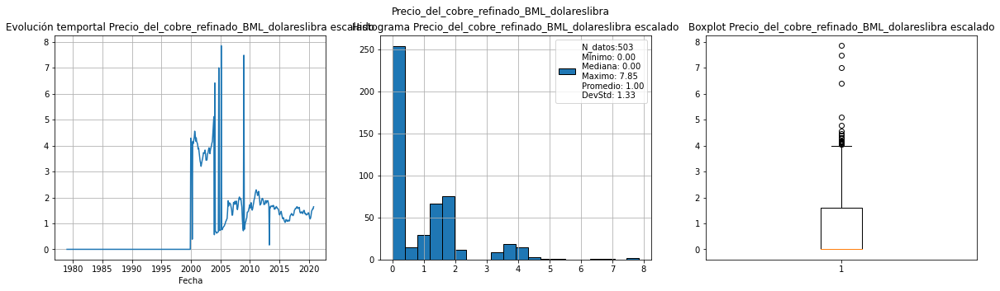

<Figure size 720x360 with 0 Axes>

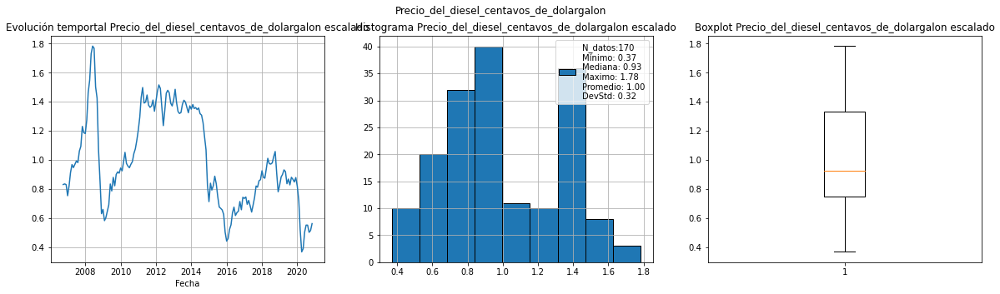

<Figure size 720x360 with 0 Axes>

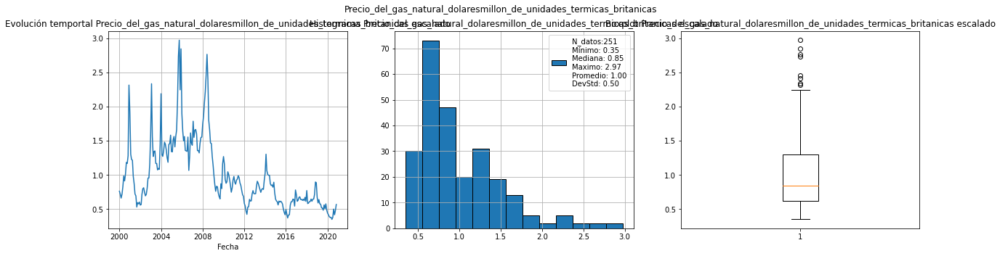

<Figure size 720x360 with 0 Axes>

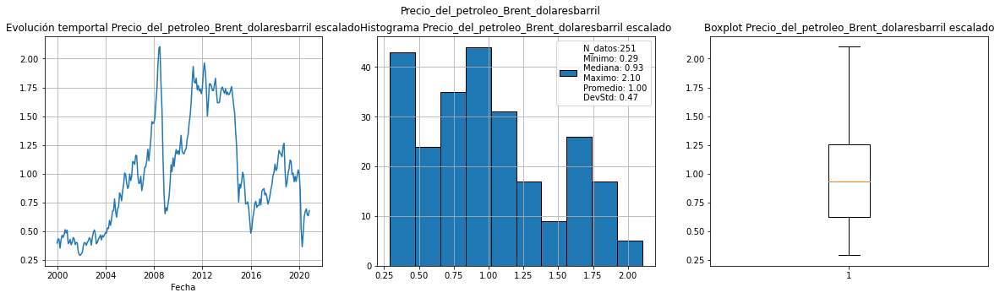

<Figure size 720x360 with 0 Axes>

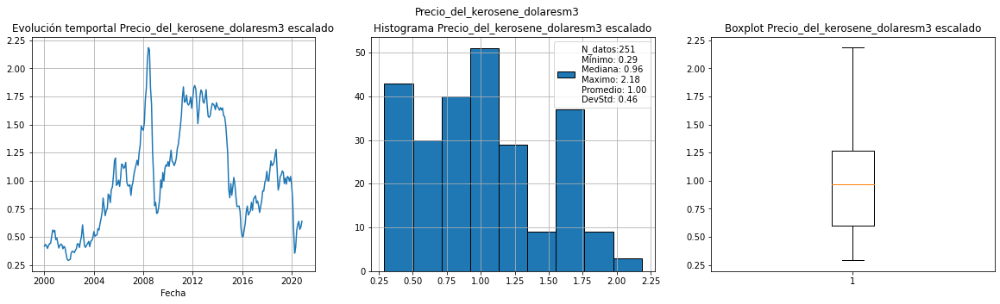

<Figure size 720x360 with 0 Axes>

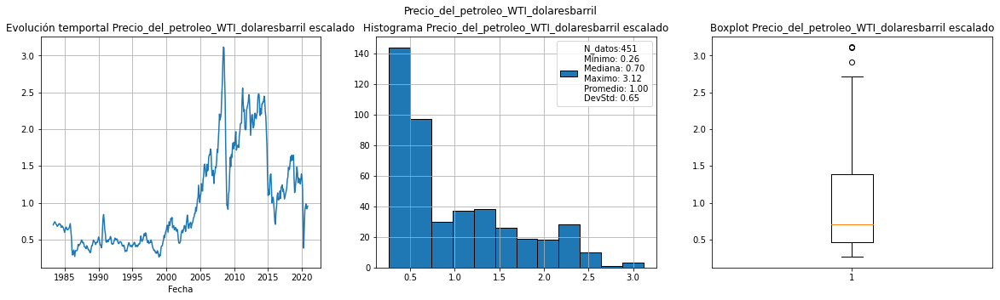

<Figure size 720x360 with 0 Axes>

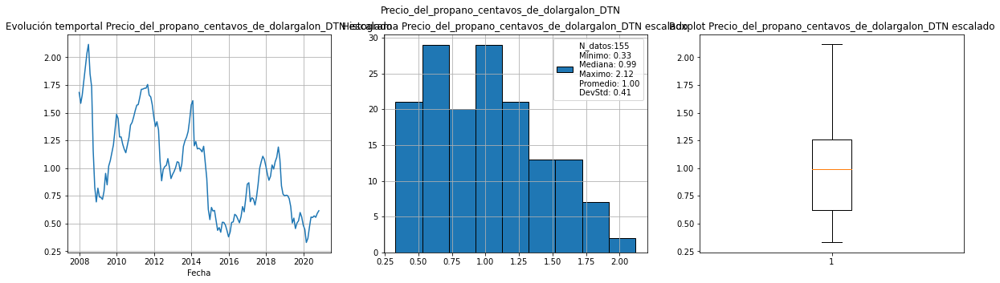

<Figure size 720x360 with 0 Axes>

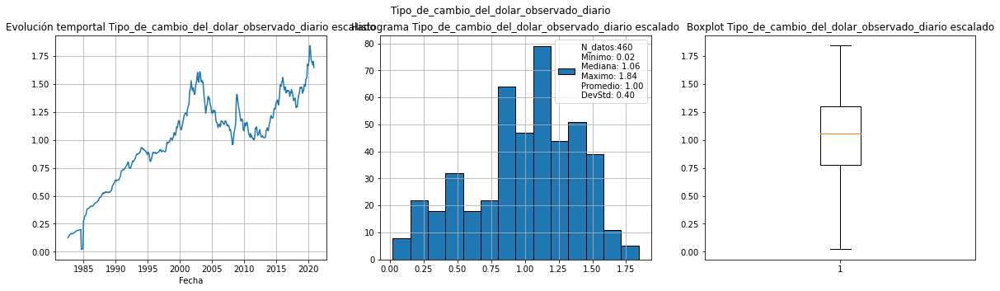

<Figure size 720x360 with 0 Axes>

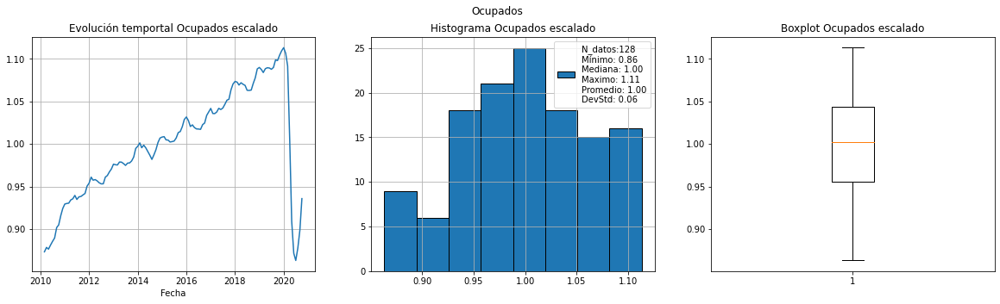

<Figure size 720x360 with 0 Axes>

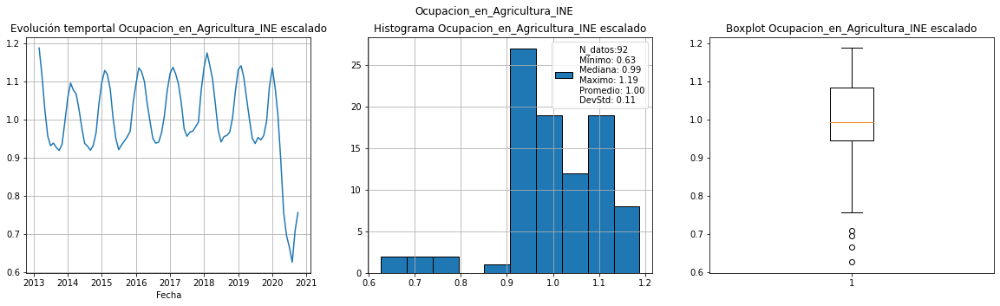

<Figure size 720x360 with 0 Axes>

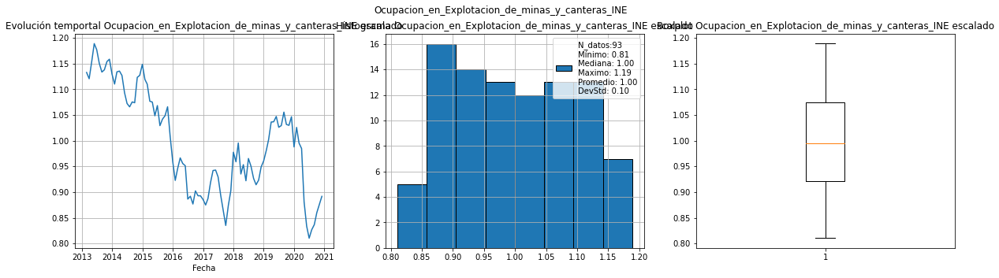

<Figure size 720x360 with 0 Axes>

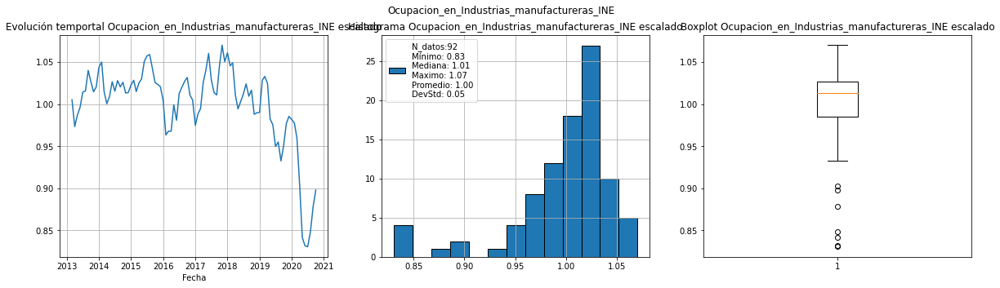

<Figure size 720x360 with 0 Axes>

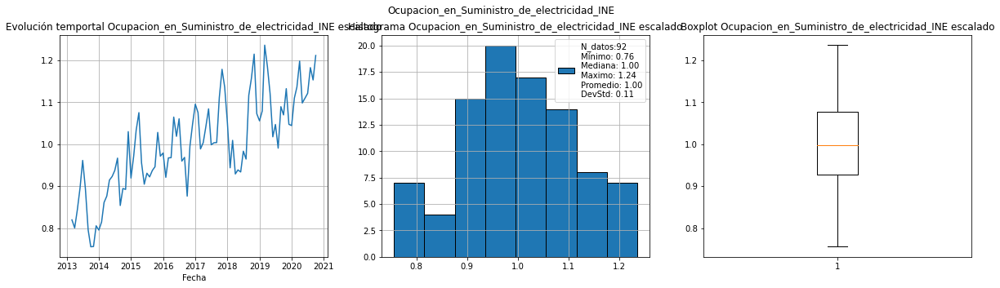

<Figure size 720x360 with 0 Axes>

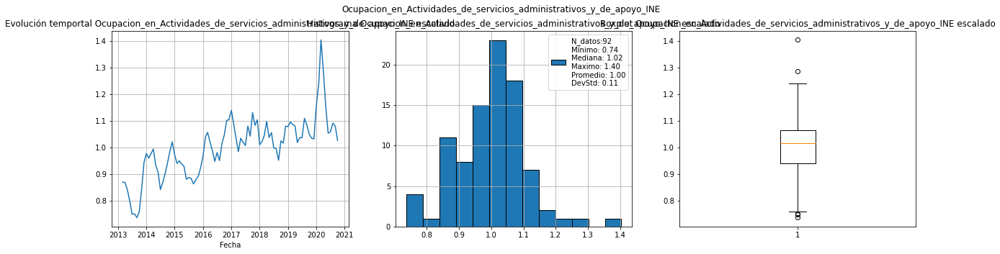

<Figure size 720x360 with 0 Axes>

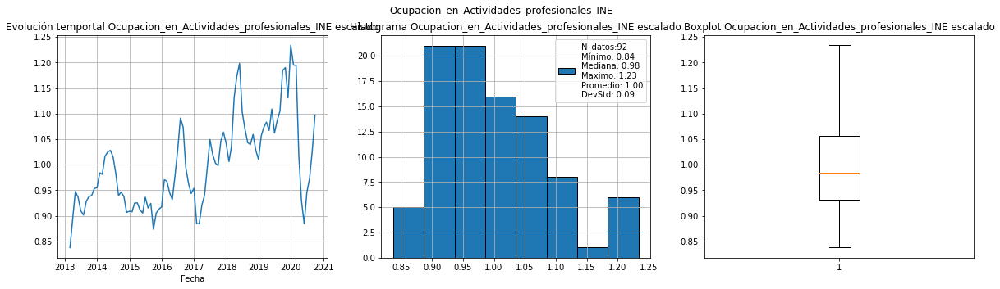

<Figure size 720x360 with 0 Axes>

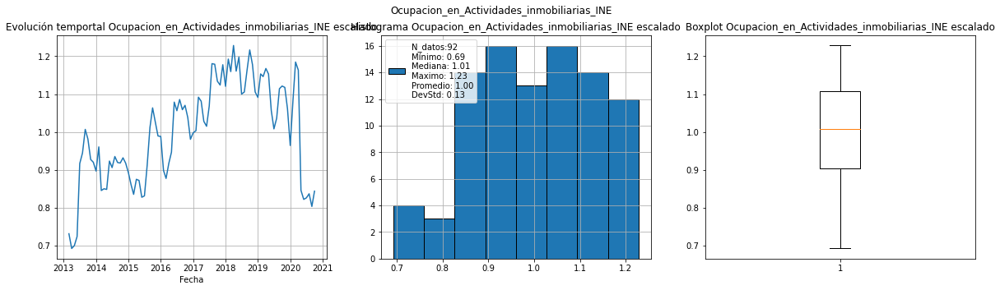

<Figure size 720x360 with 0 Axes>

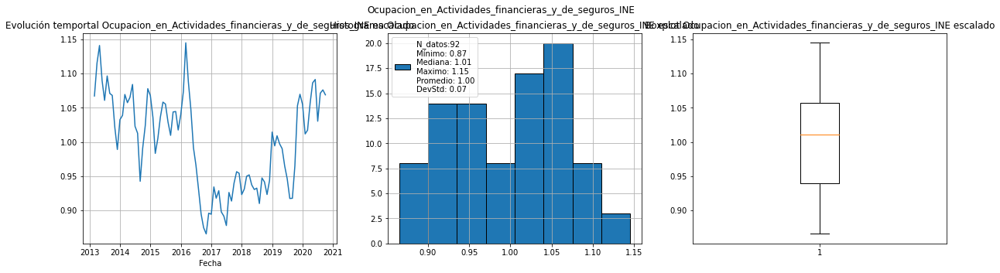

<Figure size 720x360 with 0 Axes>

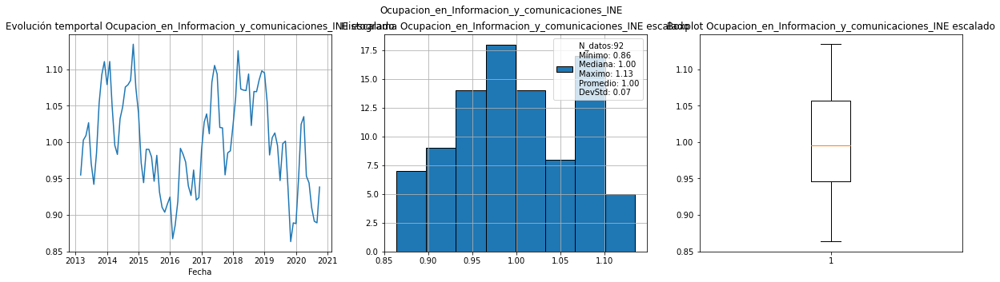

<Figure size 720x360 with 0 Axes>

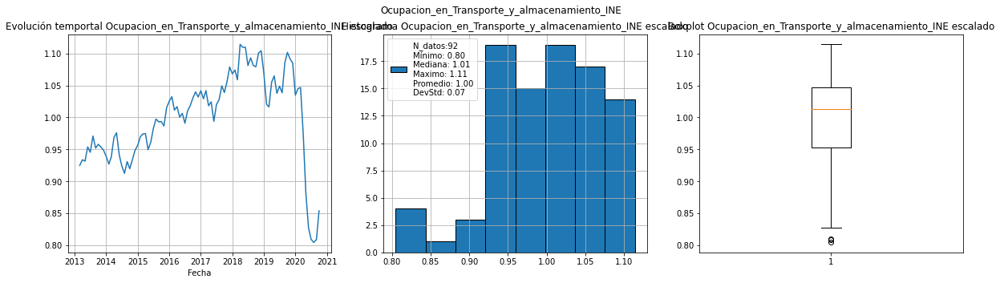

<Figure size 720x360 with 0 Axes>

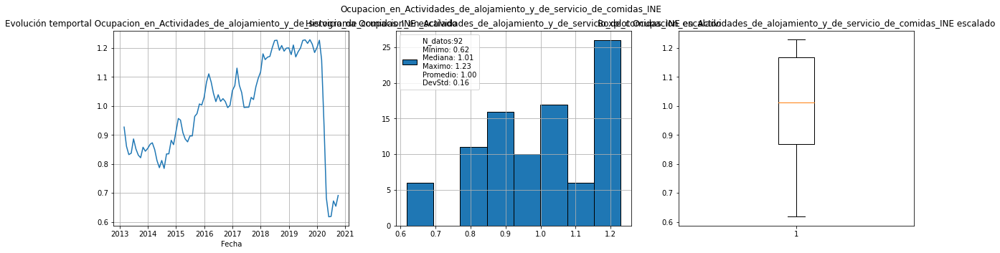

<Figure size 720x360 with 0 Axes>

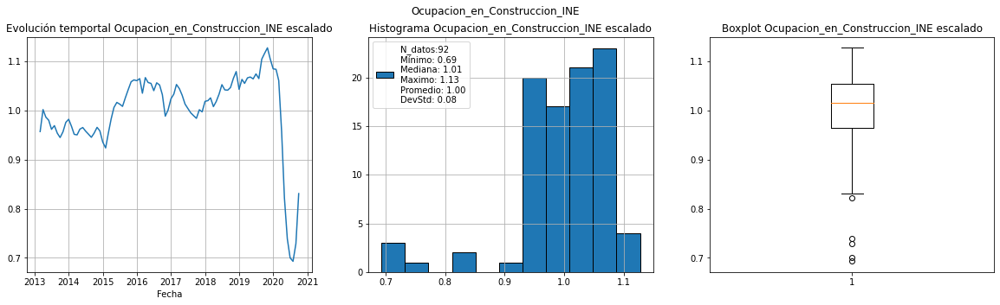

<Figure size 720x360 with 0 Axes>

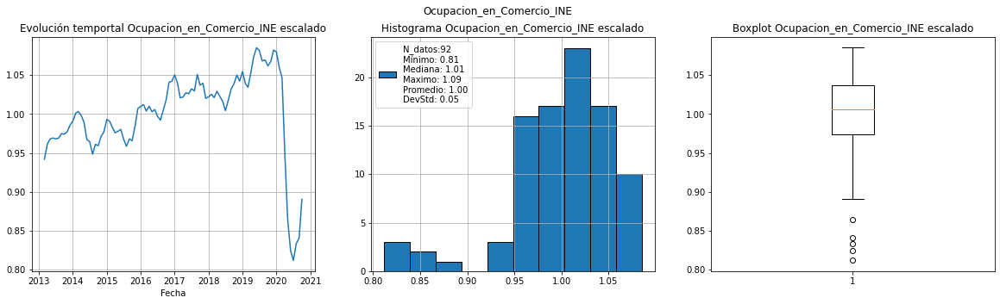

<Figure size 720x360 with 0 Axes>

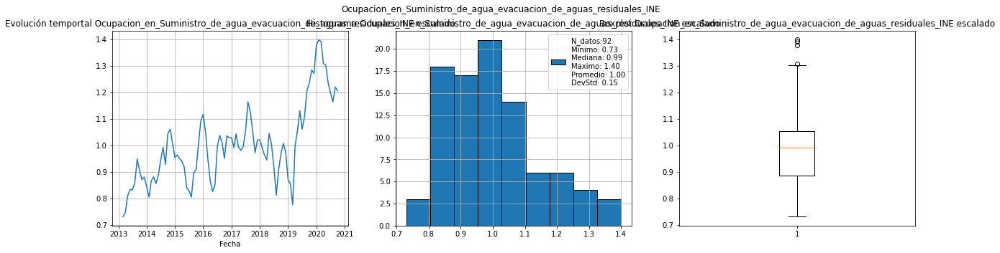

<Figure size 720x360 with 0 Axes>

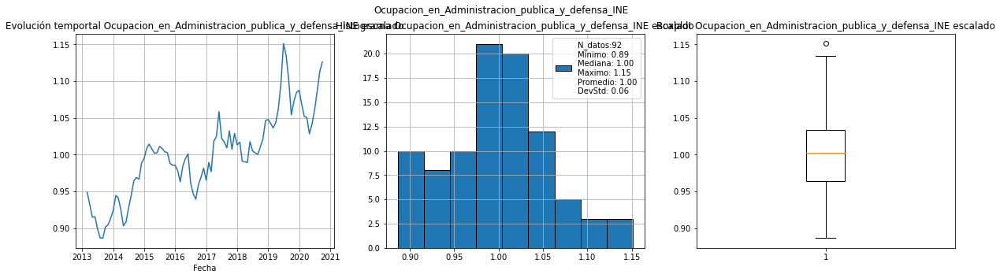

<Figure size 720x360 with 0 Axes>

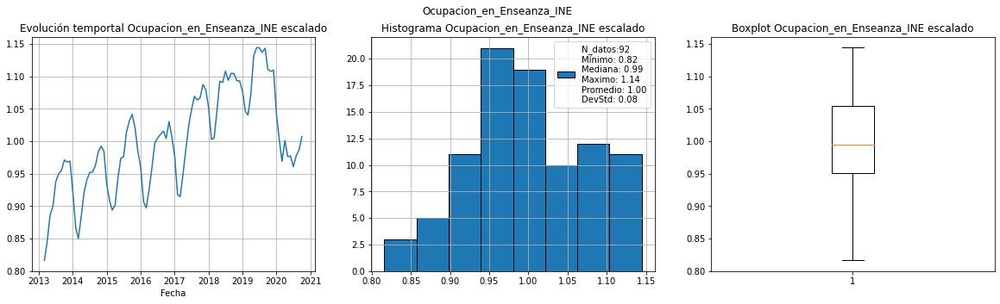

<Figure size 720x360 with 0 Axes>

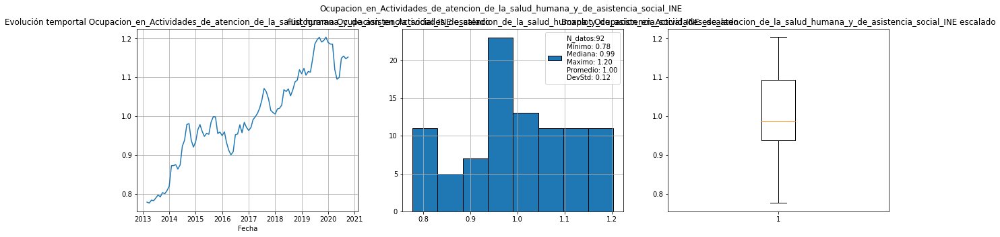

<Figure size 720x360 with 0 Axes>

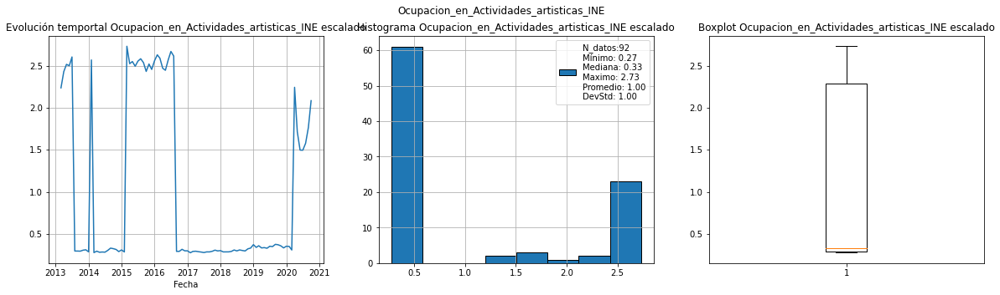

<Figure size 720x360 with 0 Axes>

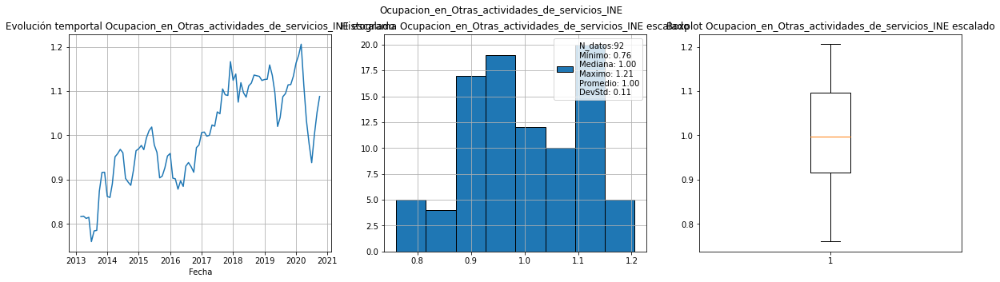

<Figure size 720x360 with 0 Axes>

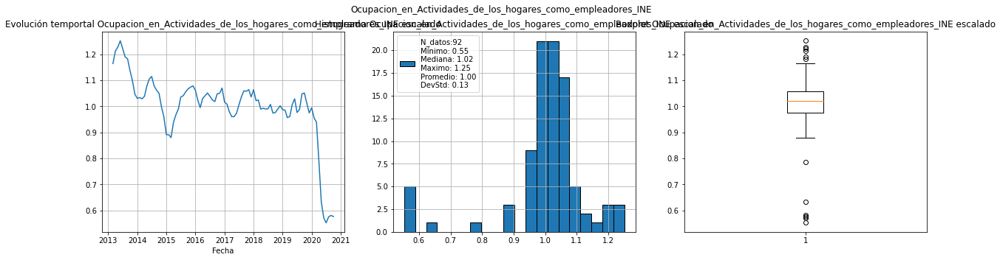

<Figure size 720x360 with 0 Axes>

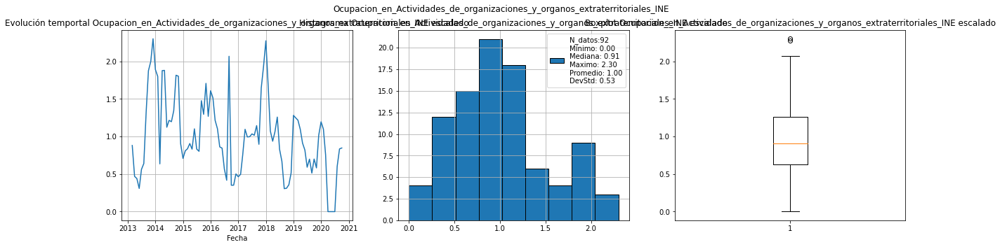

<Figure size 720x360 with 0 Axes>

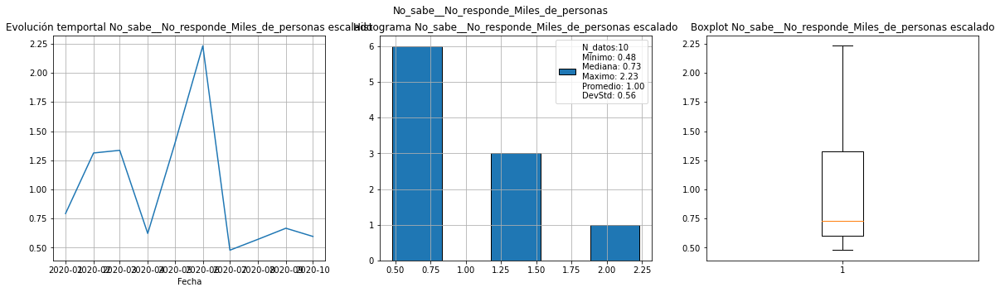

<Figure size 720x360 with 0 Axes>

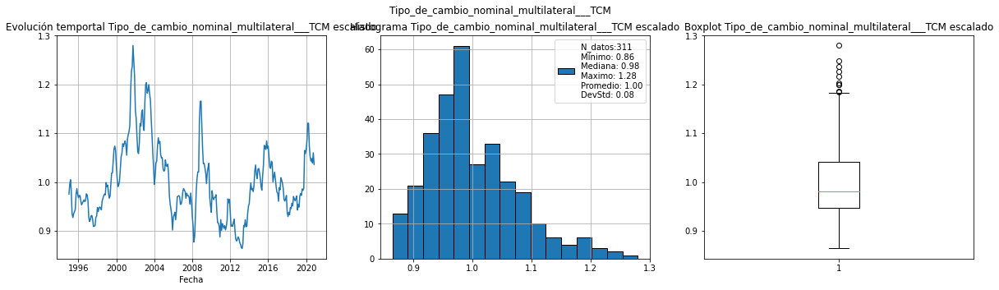

<Figure size 720x360 with 0 Axes>

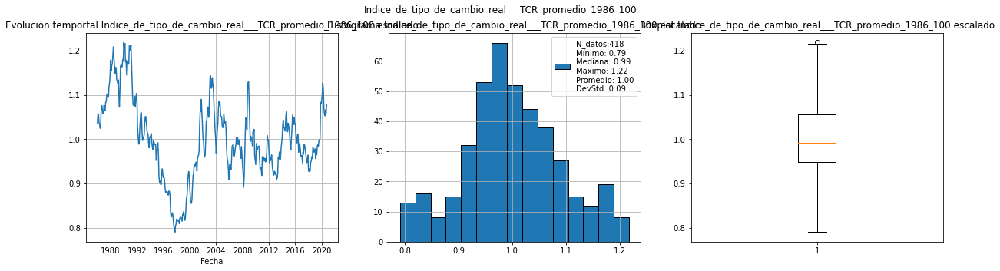

<Figure size 720x360 with 0 Axes>

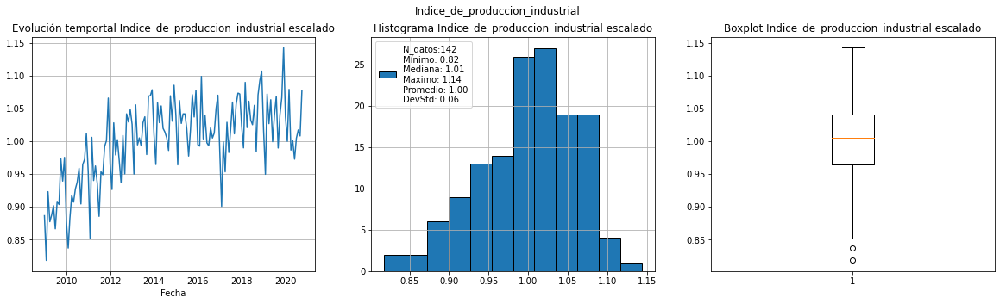

<Figure size 720x360 with 0 Axes>

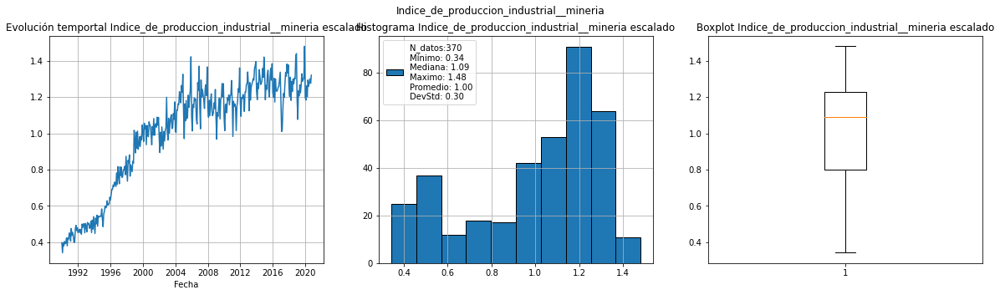

<Figure size 720x360 with 0 Axes>

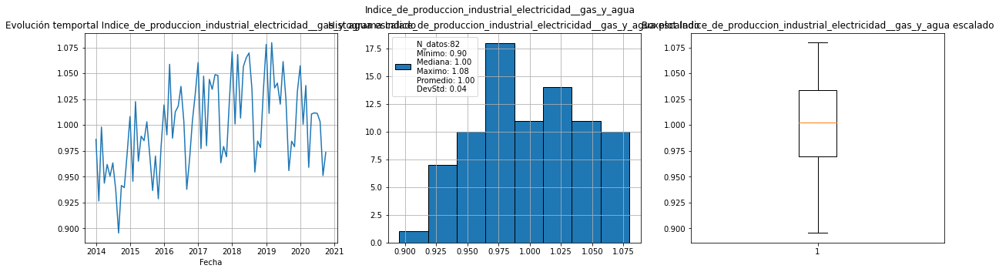

<Figure size 720x360 with 0 Axes>

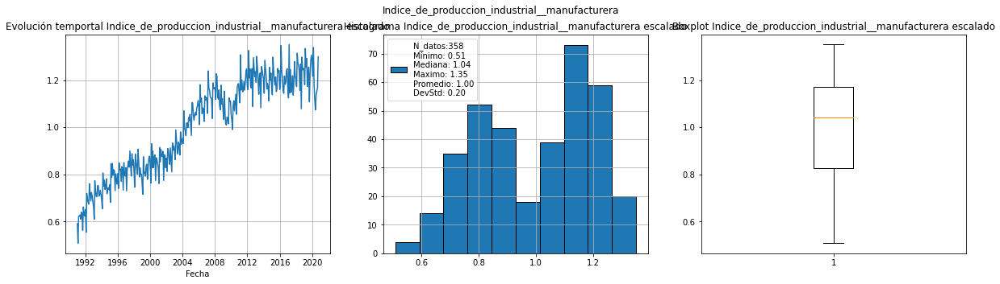

<Figure size 720x360 with 0 Axes>

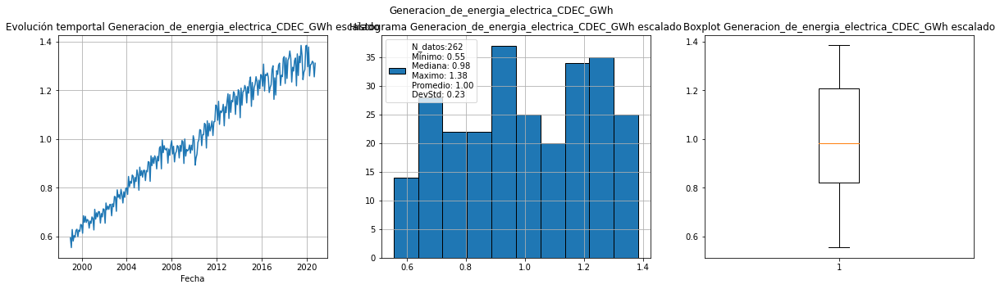

<Figure size 720x360 with 0 Axes>

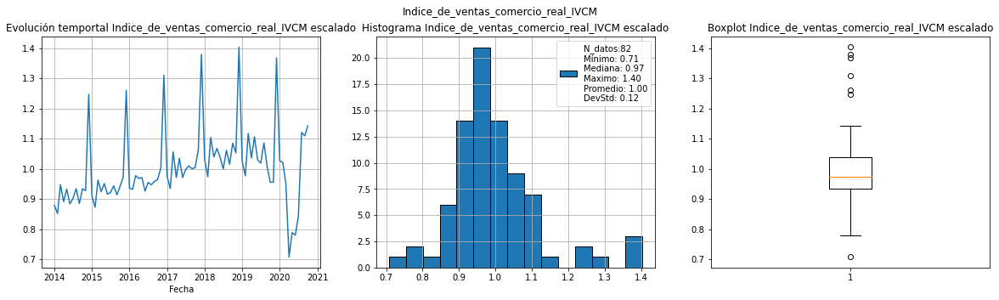

<Figure size 720x360 with 0 Axes>

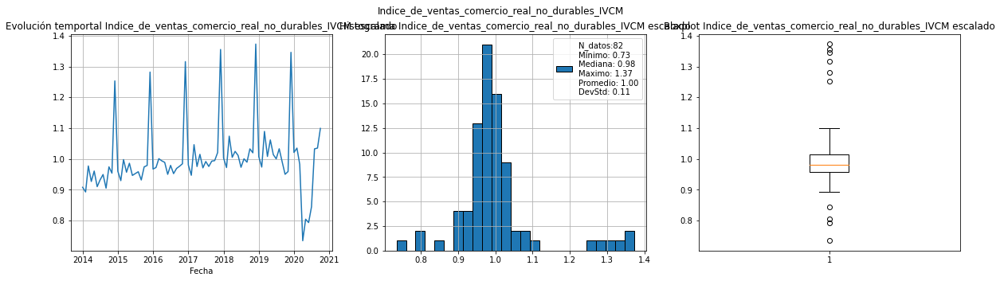

<Figure size 720x360 with 0 Axes>

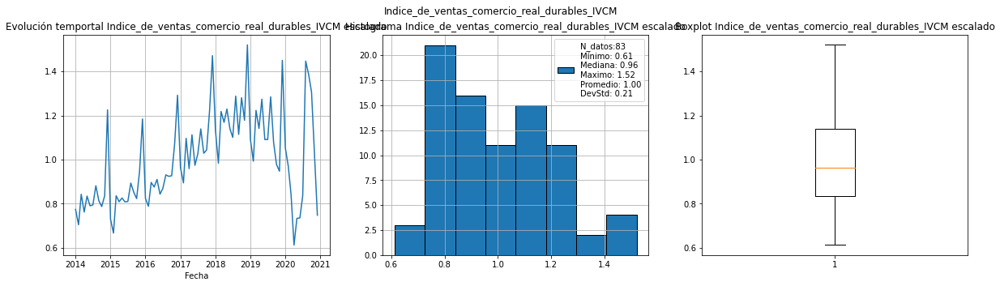

<Figure size 720x360 with 0 Axes>

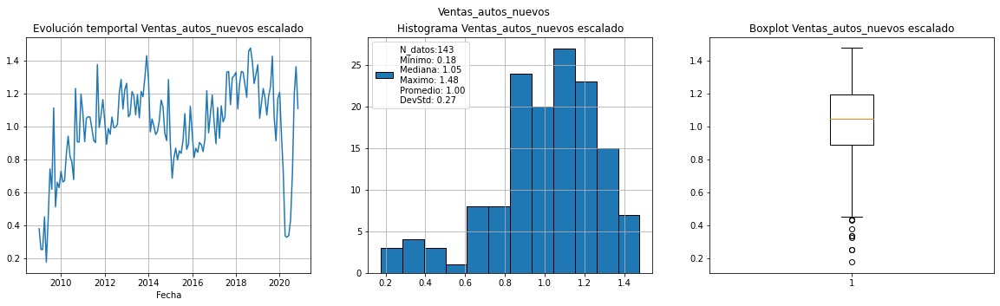

In [22]:

for col in columnas_banco:
    plt.figure(figsize=(10,5))
    plot_linea_hist(col)
    plt.suptitle(col)
    plt.show()

**Observación**: Es importante resaltar que solo se escalarón los valores anomalos. Aún así persisten errores en algunas variables. La solución más razonable en este caso es volver a importar estos datos.

# Visualización

En este sección sección se construyen las funciones solicitadas como parte del desafío para gráficar las series de tiempo. Las funciones programadas son las siguientes 

- `plot_precipitaciones`: recive una región, una fecha inicial y una fecha final. La región debe ser una columna del archivo 'precipitaciones.csv'. Gráfica la serie de tiempo correspondiente a la región en el rango de fechas especificado.
- `plot_precipitaciones_multi`: recive una región y una lista con años (deben ser de tipo numérico). Gráfica las precipitaciones de la región dada para cada año en la lista de años.
- `plot_banco`: recive dos columnas, una fecha incial y una fecha final. Gráfica las series asociadas a las columnas en el rango de fechas dado.



In [23]:
def plot_precipitaciones(region,fecha_inicio,fecha_final):
    fecha_inicio=pd.Timestamp(fecha_inicio)

    fecha_final=pd.Timestamp(fecha_final)
    if region not in regiones:
        print('Region no se encuentra en la base de datos.')
        return 
    if (fecha_inicio< df_merged.loc[~df_merged[region].isna(),'Fecha'].min()or 
        fecha_inicio> df_merged.loc[~df_merged[region].isna(),'Fecha'].max()):
        print('Fecha de inicio no se encuentra en la base de datos.')
        return
    if (fecha_final< df_merged.loc[~df_merged[region].isna(),'Fecha'].min()or 
        fecha_final> df_merged.loc[~df_merged[region].isna(),'Fecha'].max()):
        print('Fecha de final no se encuentra en la base de datos.')
        return
    plt.figure(figsize=(10,7))
    df_aux=df_merged.loc[(df_merged['Fecha']<=fecha_final)&
                                 (df_merged['Fecha']>=fecha_inicio)]
    plt.plot(df_aux['Fecha'],df_aux[region])
    plt.title('Precipitaciones región:'+region)
    plt.grid()
    plt.xlabel('Fecha')
    plt.ylabel('Precipitaciones[mm]')

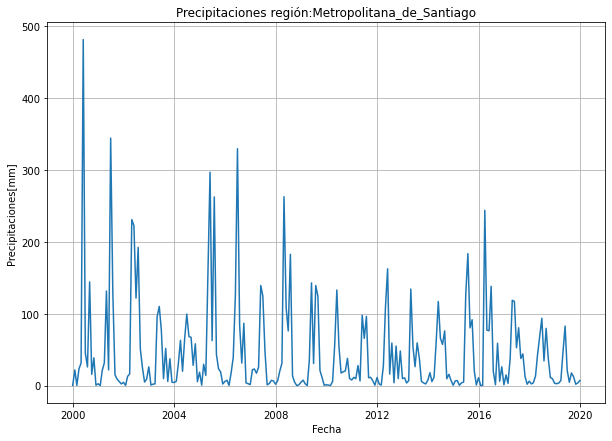

In [24]:
plot_precipitaciones('Metropolitana_de_Santiago','2000-01-01','2020-01-01')

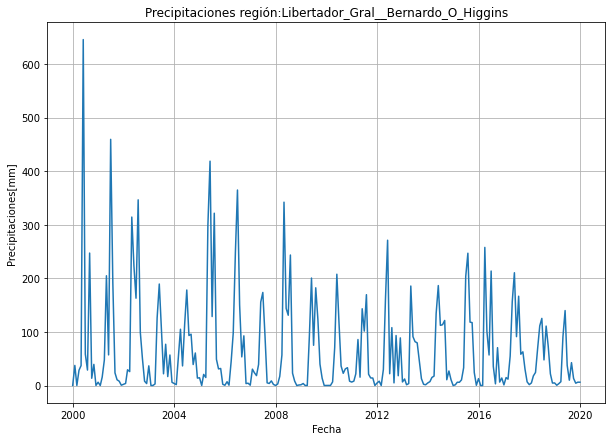

In [25]:
plot_precipitaciones('Libertador_Gral__Bernardo_O_Higgins','2000-01-01','2020-01-01')

**Observación:** Según los gráficos para las regiones Libertador_Gral__Bernardo_O_Higgins y Metropolitana_de_Santiago es posible ver que las precipitaciones mensuales han ido disminuyendo en el tiempo.

In [26]:
def plot_precipitaciones_multi(region,años):
    if region not in regiones:
        print('Region no se encuentra en la base de datos.')
        return 
    for año in años:
        if año not in df_merged.loc[~df_merged[region].isna(),'Fecha'].dt.year.unique():
            print('Año no se encuentra en la base de datos.')
            return 
        
    plt.figure(figsize=(10,7))
    for año in años:
        
        df_aux=df_merged.loc[df_merged['Fecha'].dt.year==año]
        plt.plot(range(12),df_aux[region],label='Año '+str(año))
        
    plt.xticks(range(12),meses,rotation=90)
    plt.title('Precipitaciones región:'+region)
    plt.xlabel('Fecha')
    plt.ylabel('Precipitaciones[mm]')
    plt.legend()
    plt.grid()

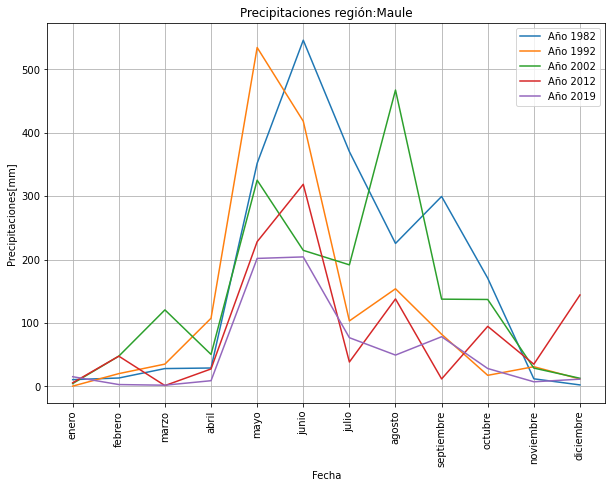

In [27]:
plot_precipitaciones_multi('Maule',[1982, 1992, 2002, 2012,2019])

**Observación:** Al igual que en la serie de tiempo para las regiones Libertador_Gral__Bernardo_O_Higgins y Metropolitana_de_Santiago, en este gráfico se puede pareciar una disminución en las precipitaciones para la región del Maule. Además en este gráfico y en el anterior se logra aprecir que hay un efecto estacionario en las precipitaciones, cosa que ya se había visto en los boxplots por mes para cada región.

In [28]:
def plot_banco(col1,col2,fecha_inicio,fecha_final):
    fecha_inicio=pd.Timestamp(fecha_inicio)

    fecha_final=pd.Timestamp(fecha_final)
    if col1 not in columnas_banco:
        print(col1+' no se encuentra en la base de datos.')
        return 
    if col2 not in columnas_banco:
        print(col2+' no se encuentra en la base de datos.')
        return
    mask_no_nulos=~df_merged[col1].isna()
    mask_no_nulos=mask_no_nulos&(~df_merged[col2].isna())
    if (fecha_inicio< df_merged.loc[mask_no_nulos,'Fecha'].min() or 
        fecha_inicio> df_merged.loc[mask_no_nulos,'Fecha'].max()):
        print('Fecha de inicio no se encuentra en la base de datos.')
        return
    if (fecha_final< df_merged.loc[mask_no_nulos,'Fecha'].min() or 
        fecha_final> df_merged.loc[mask_no_nulos,'Fecha'].max()):
        print('Fecha de final no se encuentra en la base de datos.')
        return
    plt.figure(figsize=(10,7))
    df_aux=df_merged.loc[(df_merged['Fecha']<=fecha_final)&
                                 (df_merged['Fecha']>=fecha_inicio)]
    plt.plot(df_aux['Fecha'],df_aux[col1],label=col1)
    plt.plot(df_aux['Fecha'],df_aux[col2],label=col2)
    plt.title('Serie para '+col1+'-'+col2)
    plt.grid()
    plt.xlabel('Fecha')
    plt.ylabel('Serie')
    plt.legend()

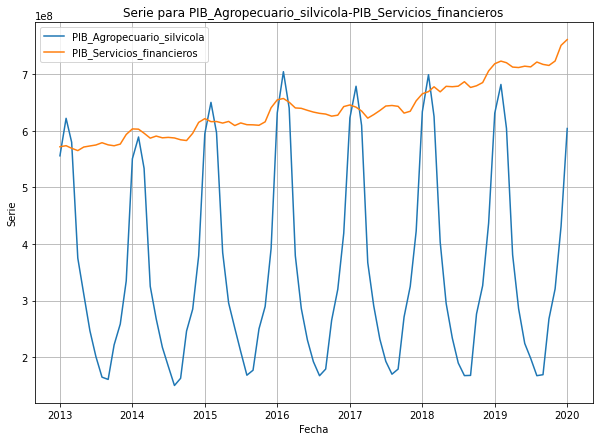

In [29]:
plot_banco('PIB_Agropecuario_silvicola','PIB_Servicios_financieros','2013-01-01',
                     '2020-01-13')

**Observación**: Según el último gráfico parace haber una  leve correlación entre las series de tiempo de 'PIB_Agropecuario_silvicola' y 'PIB_Servicios_financieros'. Una diferencia entre ambas series es que el 'PIB_Agropecuario_silvicola' tiene una estacionalidad marcada, de menera que alcanza su máximo en los meses de verano y su mínimo en los meses de invierno. Esto tiene sentido pues la cosecha y la crianza de muchos anilaes está relacionada con las estaciones del año. Esto nos podría indicar que el pib de servicios agropecuarios y silvicolas podría ser una variable a utilizar en el modelo para explciar la estacionalidad, sin embargo, solo se cuenta con datos desde el 2013 lo cual limíta la cantidad de datos del modelo.

Otras variables económicas que nos pueden ayudar a explicar el precio de la leche son las relacionadas con el IMACEC. Una ventaja con respecto a las variables relacionadas al PIB es que el IMACEC cuanta con mediciones más antiguas y además, como veremos más adelante, tiene una buena correlación con el precio de la leche.

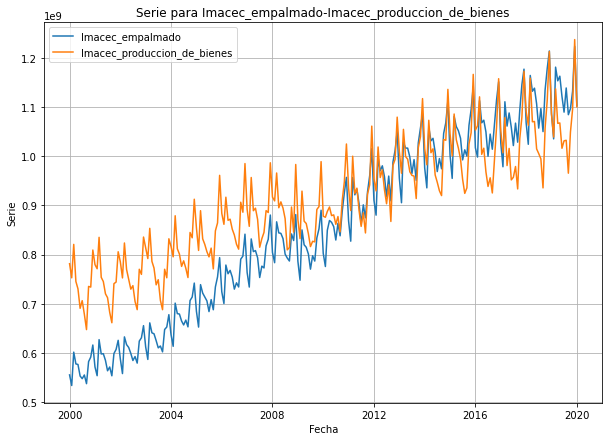

In [30]:
plot_banco(columnas_imacec[0],columnas_imacec[1],'2000-01-01',
                     '2020-01-13')

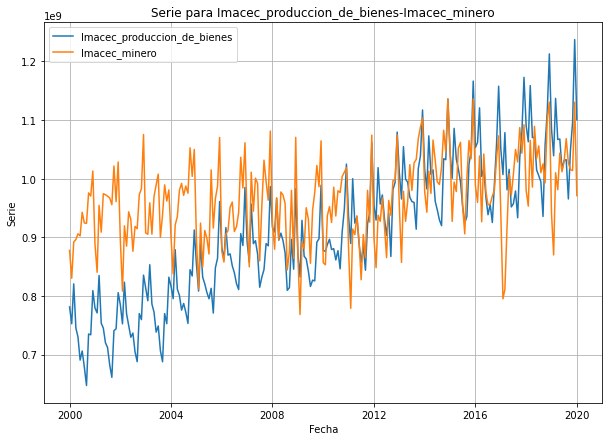

In [31]:
plot_banco(columnas_imacec[1],columnas_imacec[2],'2000-01-01',
                     '2020-01-13')

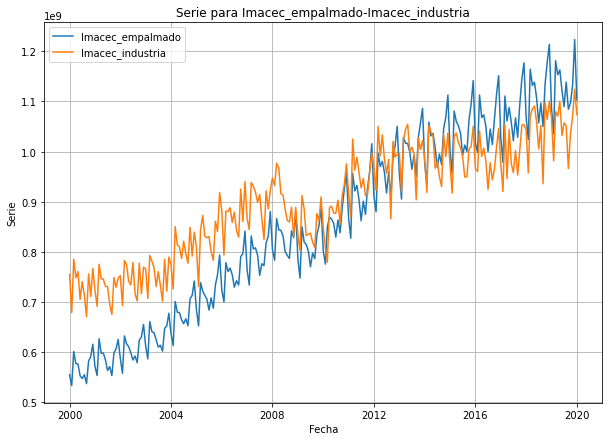

In [32]:
plot_banco(columnas_imacec[0],columnas_imacec[3],'2000-01-01',
                     '2020-01-13')

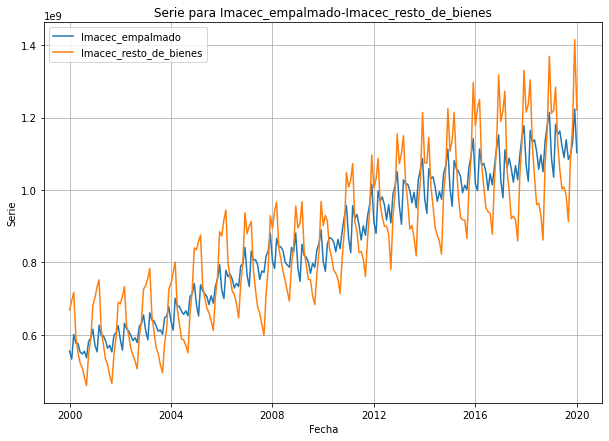

In [33]:
plot_banco(columnas_imacec[0],columnas_imacec[4],'2000-01-01',
                     '2020-01-13')

# Tratamiento, selección y creación de variables.
En esta sección vamos a analizar la correlación entre las variables y se programa una función para generar las funciones lageadas, las variables temporales (mes, año, triemestre), etc.

Para seleccionar las variables se ven dos aspectos. Primero tomamos en consideración que debemos explicar la variabilidad del precio de la leche y su tendencia. Para esto vamos a mirar la correlación entre las series de tiempo con el precio de la leche y la correlación de las series de tiempo diferencias y el precio de la leche difereciado (diferenciado quiere decir restar el valor del mes anterior). Luego se seleccionarán las variables que tengan una mayor correlación y que además no esten demasiado correlacionadas entre sí. Para esto se va a gráficar la matriz de correlaciones al cuadrado.

In [34]:
N_min_datos=200
def seleccion_de_variables(dif=True,corr_min=0.8):
    df_aux=df_merged.copy()
    if dif:
        df_aux[[col for col in df_aux.columns if col!='Fecha']]=(
            df_aux[[col for col in df_aux.columns if col!='Fecha']].diff(1))
        
    correlaciones=(df_aux.corr()['Precio_leche']**2)[[col for col in 
                                                           df_aux.columns if col!='Precio_leche'
                     and col!='Fecha' and df_merged[col].count()>N_min_datos]].sort_values()
    
    columnas_seleccionadas=[col for col in correlaciones.index if correlaciones[col]>corr_min]
    print(correlaciones[columnas_seleccionadas])
    plt.figure(figsize=(30,10))
    plt.bar(columnas_seleccionadas,correlaciones[columnas_seleccionadas])
    plt.xticks(rotation=90)
    for col in columnas_seleccionadas:
        plt.figure(figsize=(15,7))
        scatter_media_condicional('Precio_leche',col,dif=dif)
        plt.suptitle(col,y=1.01)
    return columnas_seleccionadas
def scatter_media_condicional(col1,col2,n_per=5,dif=True):
    df_aux=df_merged[['Fecha',col1,col2]].dropna()
    if dif:
        df_aux[[col1,col2]]=df_aux[[col1,col2]].diff(1)
        df_aux=df_aux.dropna()
    corr_aux=df_aux.corr()[col1][col2]
    n_datos=df_aux.shape[0]
    plt.subplot(1,3,1)
    leyenda='N:{}\ncorrelación:{:.2f}'.format(n_datos,corr_aux)
    plt.scatter(df_aux[col1].values,df_aux[col2].values,alpha=0.5,label=leyenda)
    plt.ylabel(col2)
    plt.xlabel(col1)
    plt.legend()
    plt.title('Scatter variables')
    plt.grid()
    plt.subplot(1,3,2)
    percentiles_x=np.percentile(df_aux[col1].values,[i/n_per*100 for i in range(n_per)])

    y_mean=[]
    x_mean=[]
    y_std=[]
    for i in range(n_per-1):
        mask=(df_aux[col1]<percentiles_x[i+1])&(df_aux[col1]>=percentiles_x[i])
        x_mean.append(np.mean(df_aux.loc[mask,col1]))
        y_mean.append(np.mean(df_aux.loc[mask,col2]))
        y_std.append(1.5*np.std(df_aux.loc[mask,col2])/np.sum(mask)**0.5)
    
    y_std=np.array(y_std)
    y_mean=np.array(y_mean)
    
    plt.plot(x_mean,y_mean,label='Media condicional')
    plt.ylabel(col2)
    plt.xlabel(col1)
    plt.fill_between(x_mean,y_mean-y_std,y_mean+y_std,label='Intervalo confianza',alpha=0.2)
    plt.grid()
    plt.legend()
    plt.title('Media condicional')
    plt.subplot(1,3,3)
    plt.plot(df_aux['Fecha'].values,(df_aux[col1].values-df_aux[col1].mean())/df_aux[col1].std(),label=col1)
    plt.plot(df_aux['Fecha'].values,(df_aux[col2].values-df_aux[col2].mean())/df_aux[col2].std(),label=col2)
    plt.title('Serie de Tiempo estandarizadas')
    plt.legend()
    plt.grid()

Valparaiso                             0.046988
Metropolitana_de_Santiago              0.051126
Imacec_resto_de_bienes                 0.056836
Libertador_Gral__Bernardo_O_Higgins    0.069174
Maule                                  0.078658
Los_Rios                               0.086608
La_Araucania                           0.091727
Biobio                                 0.094064
Name: Precio_leche, dtype: float64


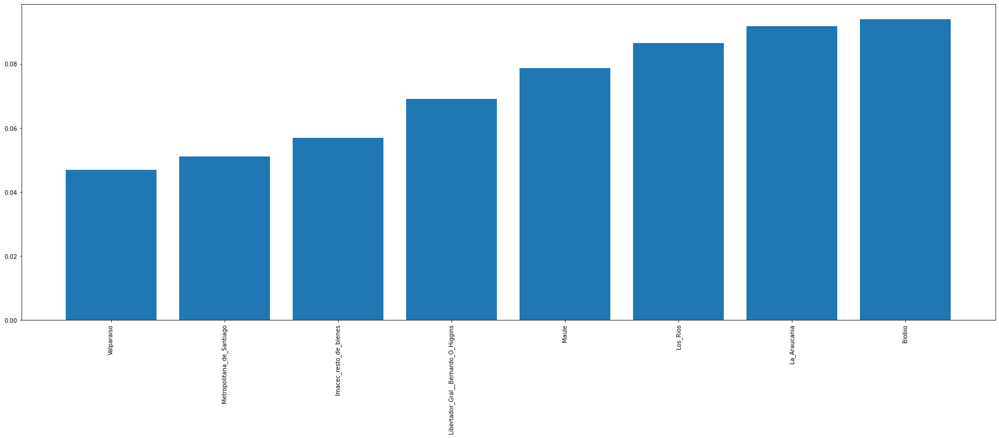

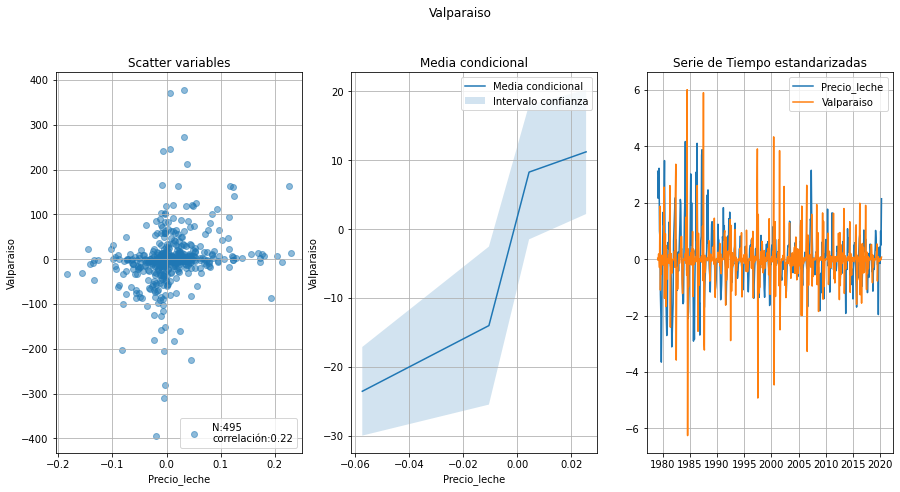

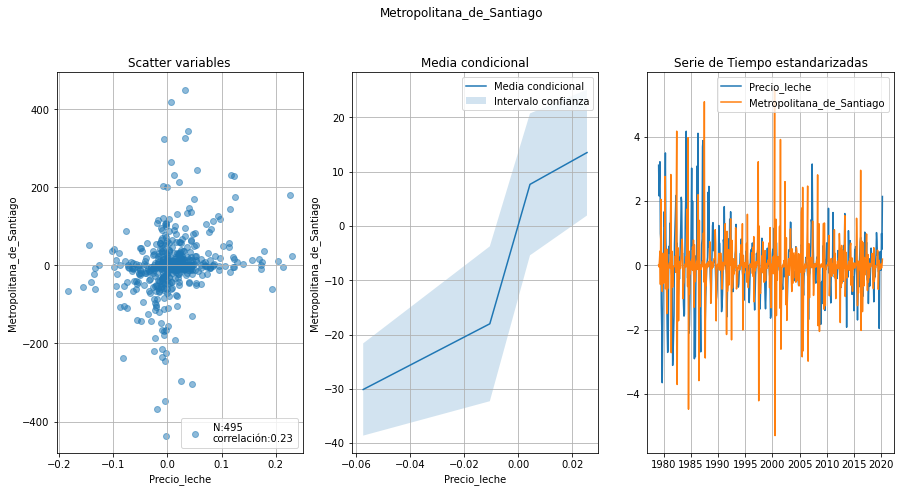

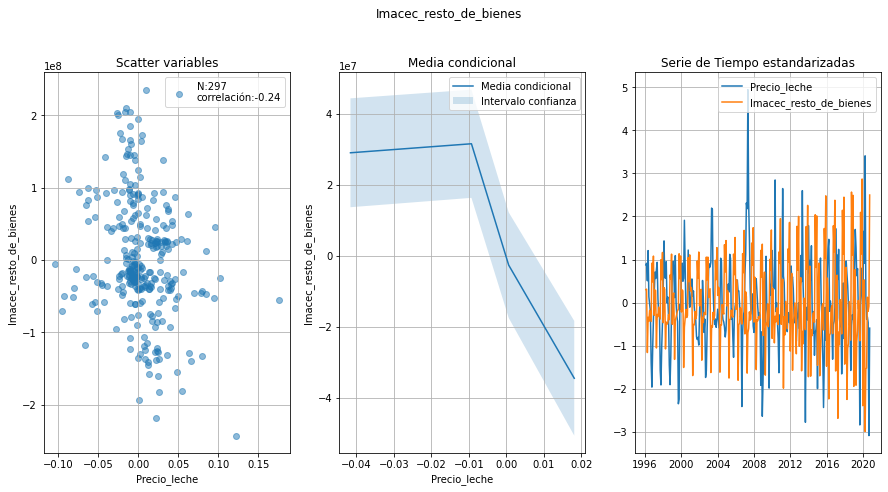

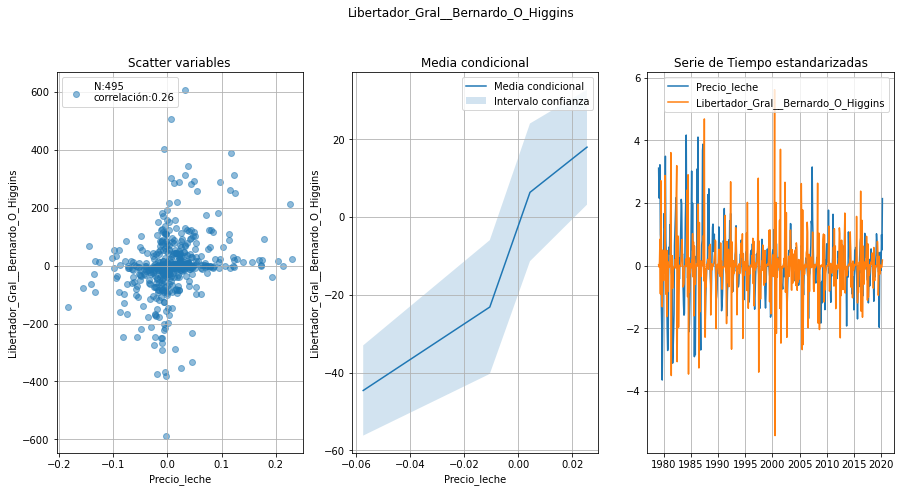

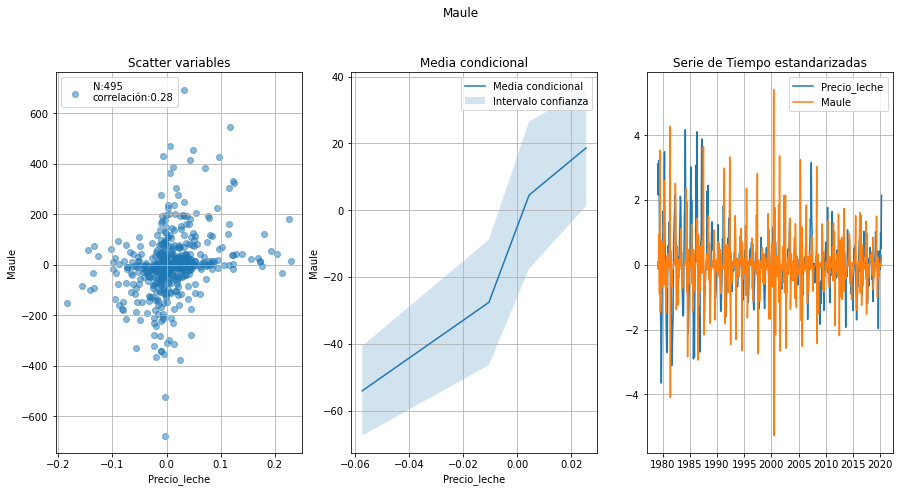

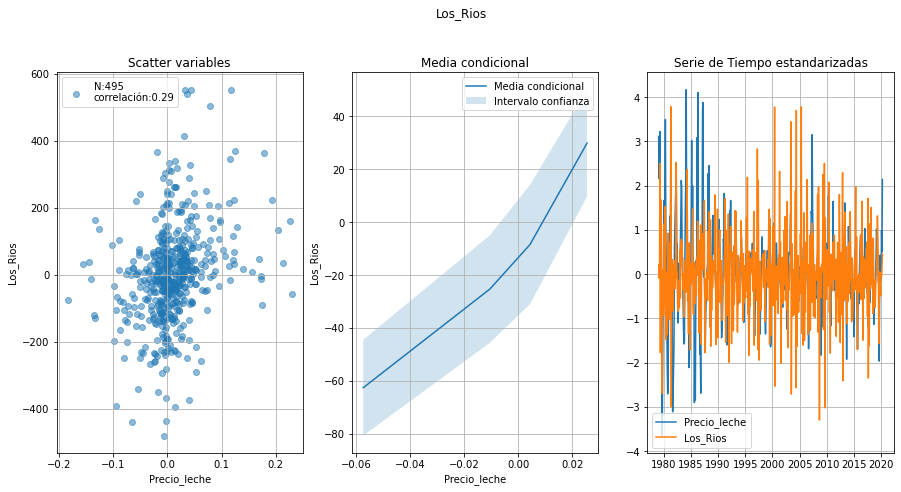

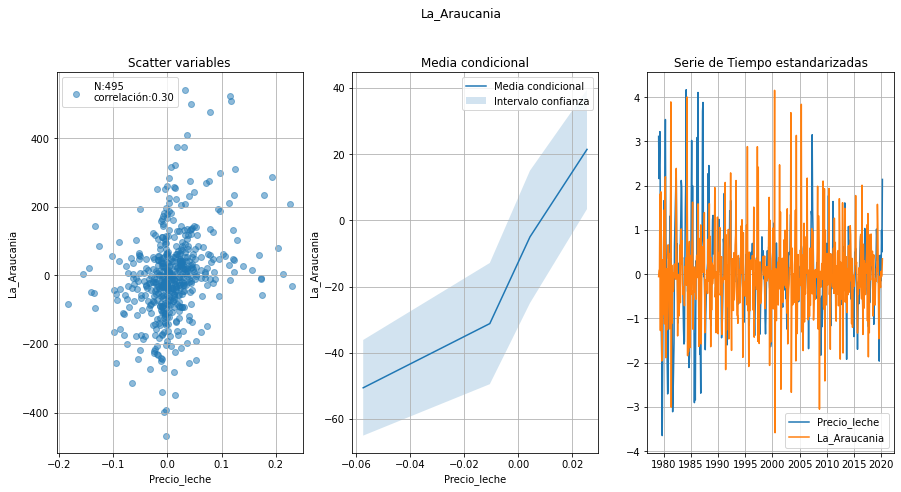

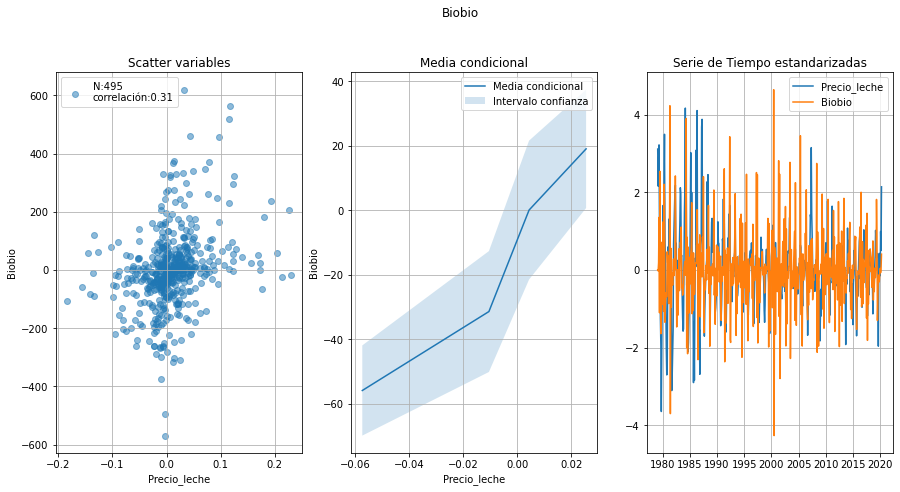

In [35]:
variables_dif=seleccion_de_variables(True,0.04)

Imacec_resto_de_bienes                            0.582950
Imacec_produccion_de_bienes                       0.697898
Indice_de_produccion_industrial__mineria          0.739105
Imacec_comercio                                   0.786437
Tipo_de_cambio_del_dolar_observado_diario         0.793761
Imacec_industria                                  0.808079
Indice_de_produccion_industrial__manufacturera    0.849227
Imacec_a_costo_de_factores                        0.856328
Imacec_empalmado                                  0.857835
Generacion_de_energia_electrica_CDEC_GWh          0.860324
Imacec_no_minero                                  0.862299
Imacec_servicios                                  0.879790
Name: Precio_leche, dtype: float64


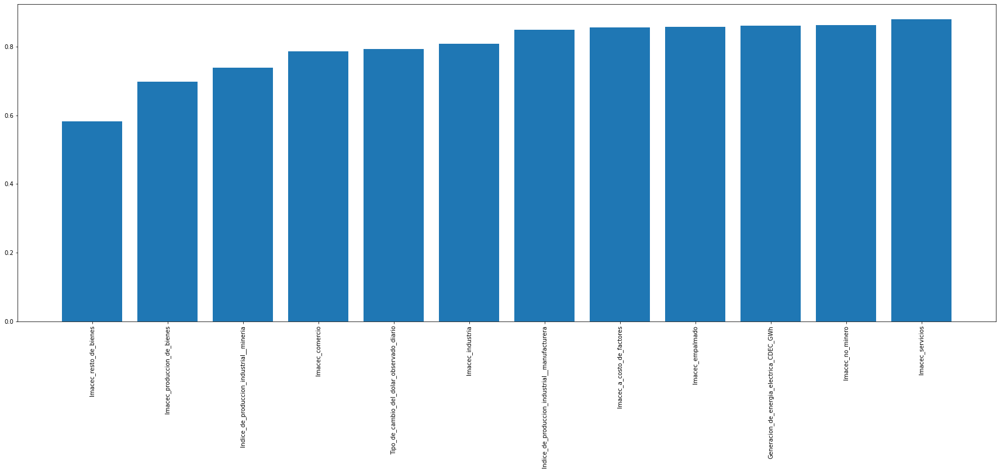

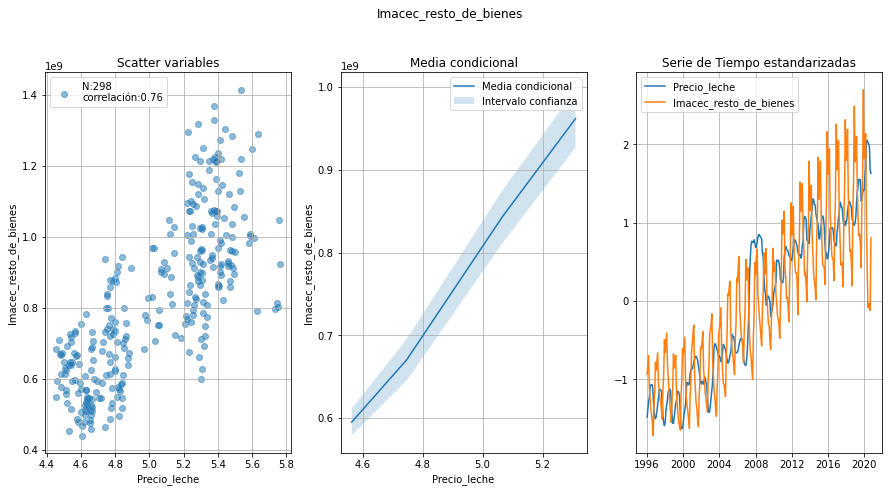

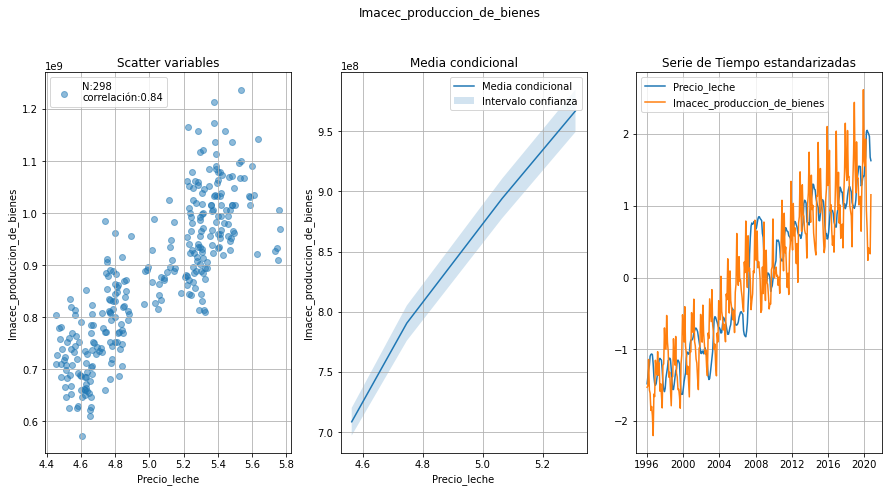

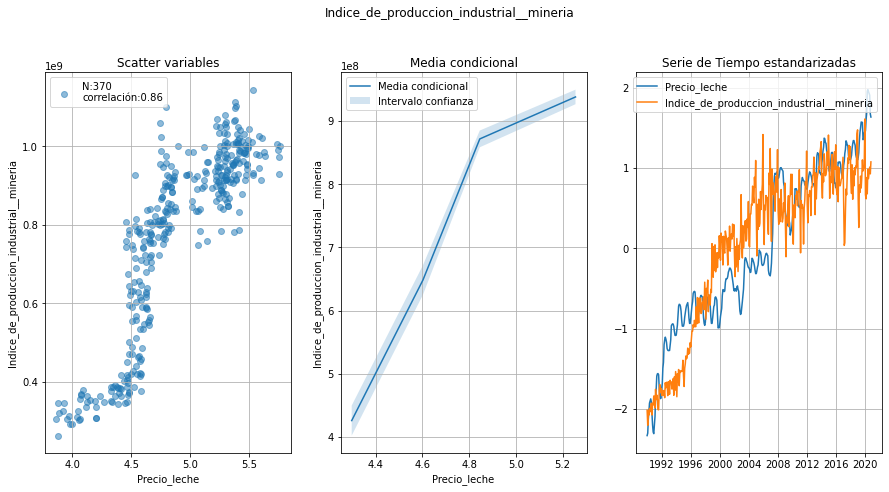

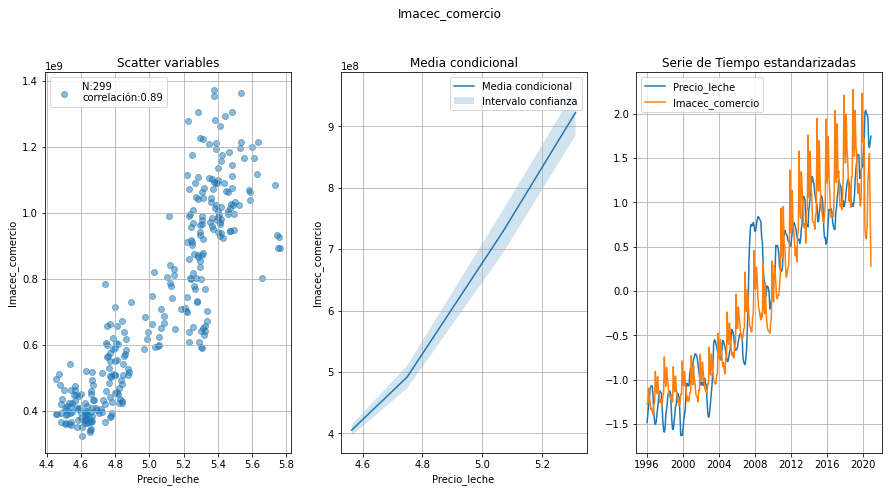

...

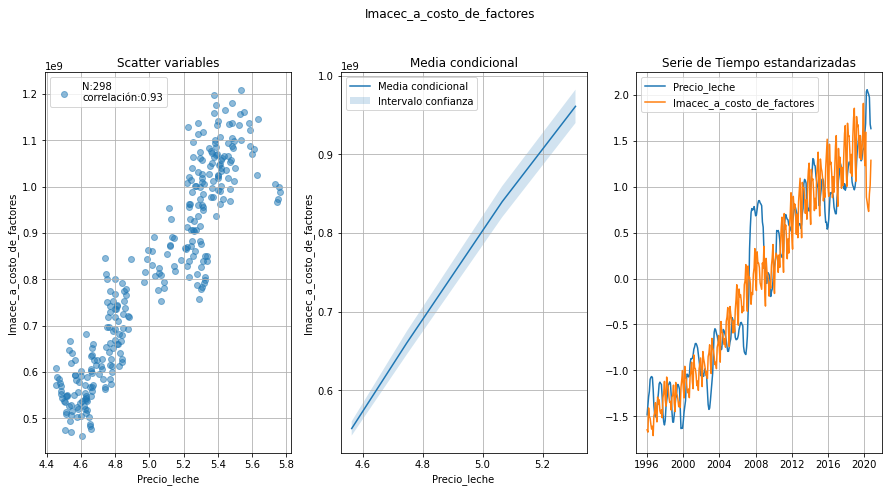

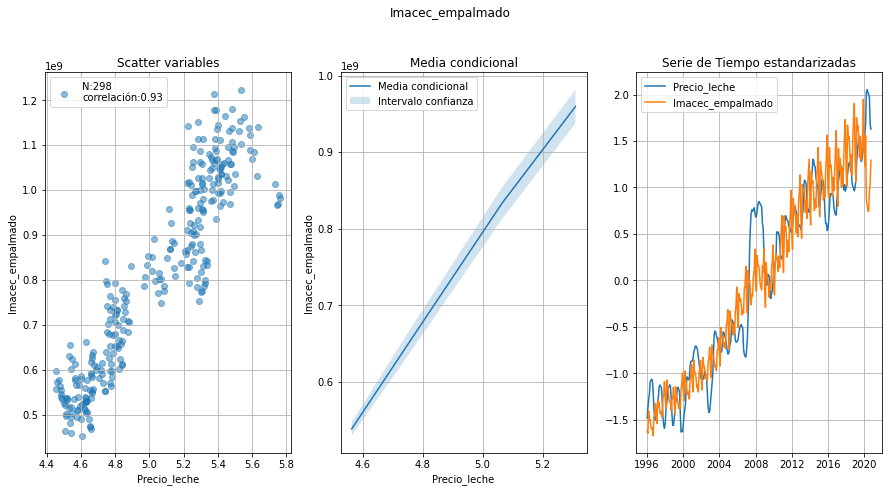

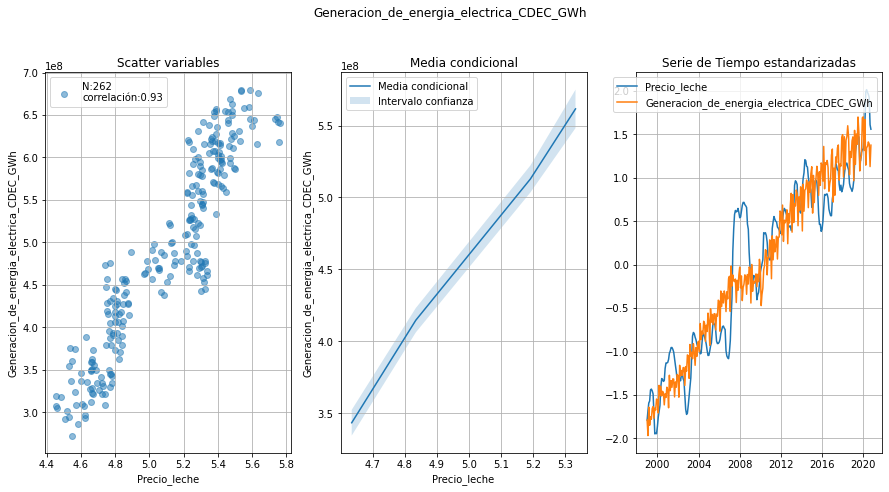

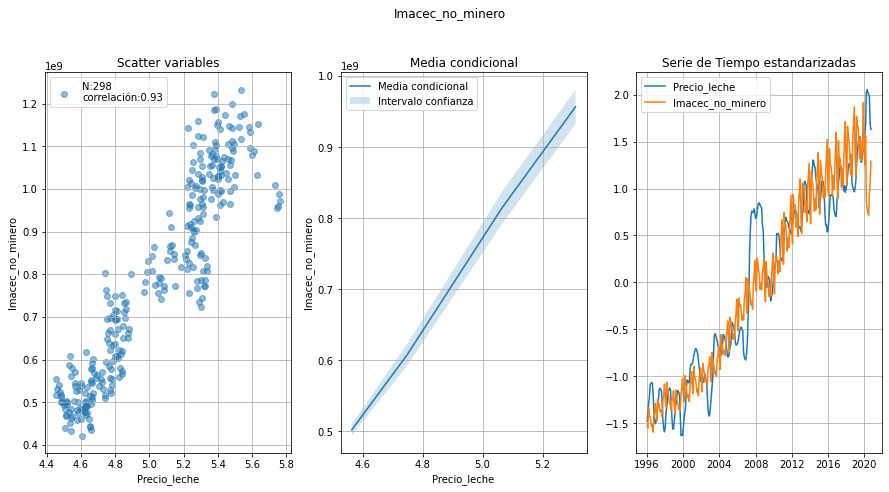

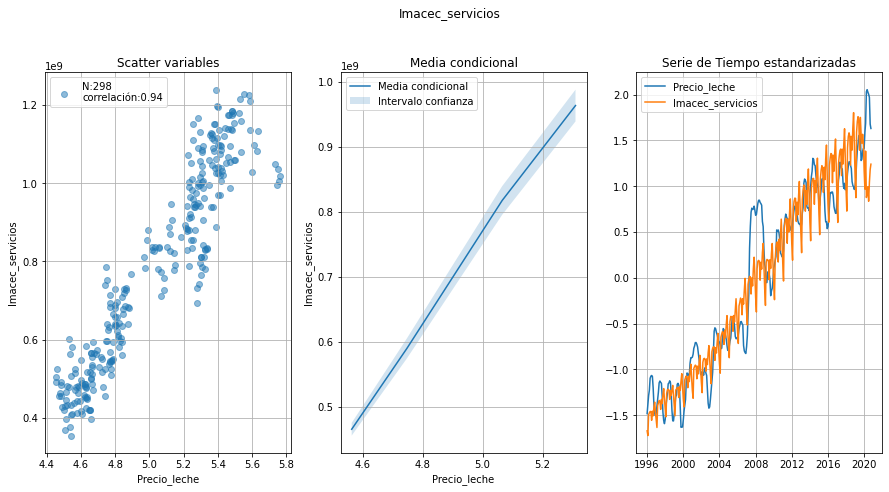

In [36]:
variables_trend=seleccion_de_variables(False,0.4)

In [37]:
def corr_plot(variables):
    plt.figure(figsize=(10,7))
    im=plt.imshow(df_merged[variables].corr()**2)
    plt.xticks(range(len(variables)),variables,rotation=90)
    plt.yticks(range(len(variables)),variables)
    plt.colorbar(im)

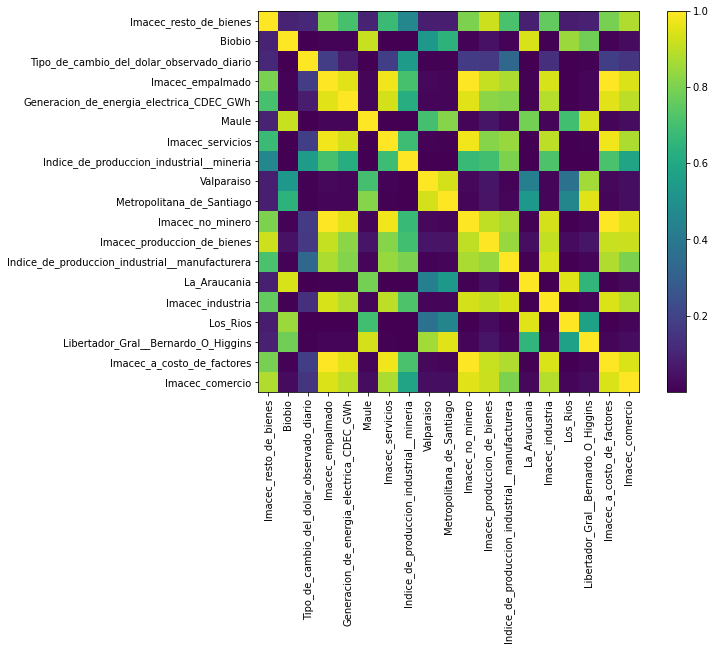

In [38]:
corr_plot(list(set(variables_dif+variables_trend)))

**Observación:** Varias de las variables económicas están muy correlacionadas y de hecho miden aspectos similares. Nos vamos a quedar con solo algunas.

In [39]:
variables_trend

['Imacec_resto_de_bienes',
 'Imacec_produccion_de_bienes',
 'Indice_de_produccion_industrial__mineria',
 'Imacec_comercio',
 'Tipo_de_cambio_del_dolar_observado_diario',
 'Imacec_industria',
 'Indice_de_produccion_industrial__manufacturera',
 'Imacec_a_costo_de_factores',
 'Imacec_empalmado',
 'Generacion_de_energia_electrica_CDEC_GWh',
 'Imacec_no_minero',
 'Imacec_servicios']

In [40]:
co_variables=['Imacec_minero','Indice_de_produccion_industrial__mineria',
           'Indice_de_produccion_industrial__manufacturera' ]+regiones
##

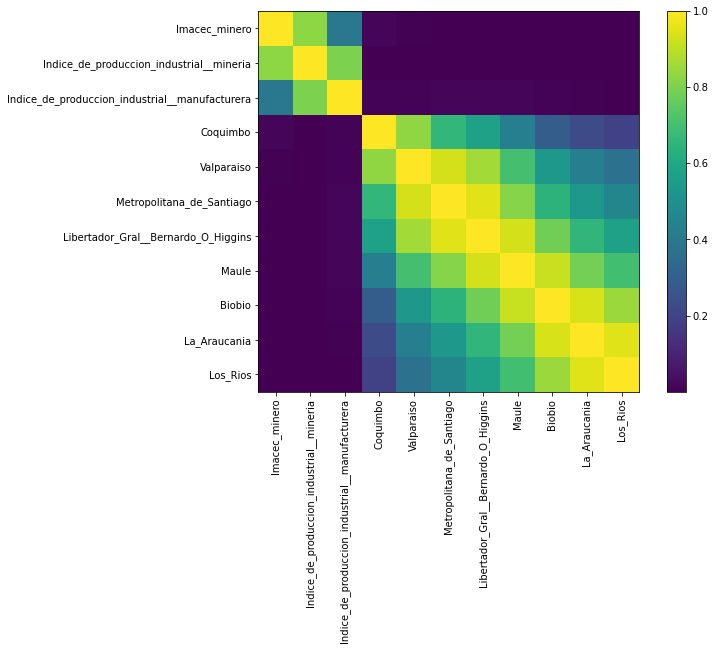

In [41]:
corr_plot(co_variables)

Habiendo elegido las variables para construir el modelo, vamos a eliminar los valores nulos asociados a estas variables. Con esto nos quedan 292 datos. La próxima etapa es construir variables lageadas, el año, los meses, los cuatrimestres y estadísticos de resumen para los últimos n valores de las variables. 

In [42]:
df_aux=df_merged.dropna(subset=co_variables)
print('Numero de datos:',df_aux.shape[0])

Numero de datos: 292


In [43]:
def crear_variables(df,lags,lags_acum,variables_relevantes):
    """
    Función que crea distintas variables para el modelo.
    
    Para cadad variable agregamos su versión lageada para cada valor en lag. 
    De la misma forma, para cada valor 'x' en lag_acum agregamos la mediana,
    la media y la desv std acumulados en los ultimos 'x' meses sin contar
    el mes en curso.
    """
    features=[]
    df_new=df.copy()
    df_new['Año']=df_new['Fecha'].dt.year.values
    df_new['Mes']=df_new['Fecha'].dt.month.values
    df_new['Tiempo']=(df_new['Fecha']-df_new['Fecha'].min()).dt.total_seconds()/10**9
    for i in range(1):
        mes=meses[i]
        df_new[mes]=0
        df_new.loc[df_new['Fecha'].dt.month==(i+1),mes]=1
        features.append(mes)
    df_new['Trimestre']=1
    df_new.loc[(df_new['Mes']==4)|(df_new['Mes']==5)|(df_new['Mes']==6),'Trimestre']=2
    df_new.loc[(df_new['Mes']==7)|(df_new['Mes']==8)|(df_new['Mes']==9),'Trimestre']=3
    df_new.loc[(df_new['Mes']==10)|(df_new['Mes']==11)|(df_new['Mes']==12),'Trimestre']=4
    for i in range(1,4):
        df_new['Trimestre'+str(i)]=0
        df_new.loc[df_new['Trimestre']==(i+1),'Trimestre'+str(i)]=1
        features.append('Trimestre'+str(i))
    features=features+['Año','Tiempo']
    for variable in variables_relevantes:
        for lag in lags:
            df_new[variable+'_lag_'+str(lag)]=df_new[variable].shift(lag)
            features.append(variable+'_lag_'+str(lag))
    variable='Precio_leche'
    for lag in lags_acum:
        df_new[variable+'_lag_median_'+str(lag)]=df_new[variable].shift(1).rolling(lag).quantile(0.5)
        features.append(variable+'_lag_median_'+str(lag))
        df_new[variable+'_lag_media_'+str(lag)]=df_new[variable].shift(1).rolling(lag).mean()
        features.append(variable+'_lag_media_'+str(lag))
        df_new[variable+'_lag_std_'+str(lag)]=df_new[variable].shift(1).rolling(lag).std()
        features.append(variable+'_lag_std_'+str(lag))
    df_new.dropna(subset=features,inplace=True)
    return df_new,features

# Modelo 
Se utilizará un modelo con variables lageadas para predecir el precio del mes siguiente. Dependiendo del uso que se le quiera dar al modelo se pueden considerar distintas métricas. Dado que es un variable continua y no tenemos información adicional sobre el uso que se le dará al modelo, es razonable pensar en utilziar la raíz del error cuadratico medio:
$$ rmse(y_{real},y_{pred})=\sqrt{\sum_{i}(y_{real(i)}-y_{pred(i)})^{2}}.$$
Es importante mencionar que si conocieramos la distribución de $y$ dado $x$, el valor que minimiza el error cuadrático medio es el valor esperado de $y$ dado $x$. En este sentido el modelo elegido debe predecir el valor esperado. Para esto vamos a utilizar un proceso gaussiano para modelar el logaritmo del precio de la leche:
$$\ln(y(x))=\mu+f(x)+N(0,\sigma),\mbox{ donde }f\sim GP(0,k), $$
$$ k(x_1,x_2)=a\exp\left( \sum_{i}\frac{(x_{1,i}-x_{2,i})^{2}}{l_{i}^2}\right)+bx_{1}\cdot x_{2}$$
la función $k$ en este caso modela la correlación que existe entre los valores de $y$ para distintos valores de $x$. Las primera parte del kernel $\exp\left( \sum_{i}\frac{(x_{1,i}-x_{2,i})^{2}}{l_{i}^2}\right)$ mide la parte no lineal de las relaciones entre las covariables y la segunda parte $x_{1}\cdot x_{2}$ corresponde a las correlacioens lineales. Las constantes $a,b>0$ miden el aporte de cada parte del kernel a la variabilidad de $y$.

Las componentes de la variable $x$ constan de :
- el precio de le leche en el mes anterior.
- la mediana, media y desviación estandar de los últimos 6 meses del precio de la leche (se podría evaluar considerar más lags y estdísticos de resumen, para esto se requeire más tiempo).
- el valor del mes anterior para las covariables seleccioandas anteriormente.
- las variables temporales 'año', 'tiempo', 'trimestre' y 'mes'.

En lo anteior es importante mencionar que:

- La variable tiempo es las cantidad de segundos dividida por $10^9$ (medidos desde el valor más antiguo de la base de datos).
- La variable mes está considerada como dummies para los primeros 11 meses.
- La variable trimestre está considerada como dummies para los primeros 3 triemestres.
- El año es simplemente el año.

La idea es que los trimestres y meses capturen el efecto estacionario, mientras que año y tiempo capturen la tendencia de los datos (en conjunto con la parte autoregresiva y las variables seleccionadas anteriormente). Además del analisis de la autocorrelación parcial lo más razonable es utilizar solo el precio del mes anterior y estadisticas resumidas para los últimos 6 meses que capturen la posible periodicidad en la covarianza.

Una gran ventaja es que podemos calcular de forma cerrada la distribución a posteriori del precio de la leche, es decir, contamos con la distribución de la respuesta para cada $x$. Tomando esto en cuenta, la predicción se realiza como 
$$ y_{pred}(x)=\exp\left(E(f(x))+\mu+\frac{Var(f(x))+\sigma^2}{2} \right) $$
donde la esperanza y la varianza se calculan con respecto a la los datos de entrenamiento. Además podemos proporcionar un intervalo de confianza (o credibilidad en el lenguaje bayesiano) de aproximadamente 95%:
$$ \left[\exp\left(E(f(x))+\mu-2\sqrt{Var(f(x))} \right),\exp\left(E(f(x))+\mu+2\sqrt{Var(f(x))} \right)\right].$$
Para validar el modelo tomamos 96 datos para testear, que corresponden a 8 años de datos y dejamos 196 datos como set de entrenamiento (antes de construir las variables lageadas). Esto corresponde a aproximadamente utilizar un 67% de datos para entrenar y un 37% para testear. En la construcción de estos subconjuntos se respeta el orden temporal para evitar el sobreajuste (no se puede y no se debería predecir el pasado con el futuro).

Dado que hay una alta correlación del precio de la leche con su valor del mes anterior, es razonable pedir que el modelo sea mejor que simplemente utilizar como predicción el precio de la leche en el mes anterior. Para realizar esta comparación se construye un scatter y gráficos de linea con el modelo y precio de la leche del mes anterior.

**Observación**: sobre la elección del modelo, es importante decir que por la cantidad de datos y la alta correlación no es recomendable utilizar modelos como redes neuronales o modelos de boosting. Además, este modelo modelo nos entrega un predicción en forma de distribución lo cual no se puede hacer de forma sencilla con las otras opciones. Sin embargo, en un analsis más profundo se podrían incorporar este tipo de modelos. 

In [44]:
df_aux_lag=df_aux.copy()
df_aux_lag,features=crear_variables(df_aux_lag,[1],[6],co_variables+['Precio_leche'])
###Creamos la base de datos con variables lageadas

In [45]:
from sklearn.model_selection import train_test_split
train,valid=train_test_split(df_aux_lag,shuffle=False,test_size=12*8)

In [46]:
X_train,X_valid=train[features].values,valid[features].values
Y_train,Y_valid=train[['Precio_leche']].values,valid[['Precio_leche']].values

In [47]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import TransformedTargetRegressor
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF,WhiteKernel,DotProduct,Matern,ExpSineSquared,ConstantKernel

In [48]:
lm=make_pipeline(StandardScaler(),GaussianProcessRegressor(
kernel=RBF(np.ones(len(features)))*1+WhiteKernel(0.01)+DotProduct(0.1),
    n_restarts_optimizer=20,random_state=0,normalize_y=True));

In [49]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
def plot_validacion(y_true,y_pred):
    rmse=mean_squared_error(y_true,y_pred)**0.5
    r2=r2_score(y_true.flatten(),y_pred.flatten())
    mae=mean_absolute_error(y_true,y_pred)
    bias=np.mean(y_true-y_pred)
    legenda='rmse={:.2f}\nR2={:.2f}\nmae={:.2f}\nBias={:.2f}\nN datos={:}'.format(rmse,r2,mae,bias,len(y_true))
    plt.scatter(y_pred,y_true,alpha=0.5,label=legenda)
    y_min=min(np.min(y_pred),np.min(y_true))
    y_max=max(np.max(y_pred),np.max(y_true))
    plt.plot([y_min,y_max],[y_min,y_max],'-',c='r',label='x=y')
    plt.xlabel('y_pred')
    plt.ylabel('y_true')
    plt.legend()
    plt.title('Validacion modelo')

In [50]:
lm.fit(X_train,Y_train);

In [51]:
Y_p,Y_p_std=lm.predict(X_valid,return_std=True)
Y_p=Y_p.flatten()
Y_p_std=Y_p_std.flatten()

Text(0.5, 0.98, 'Validación logaritmo del precio de la leche.')

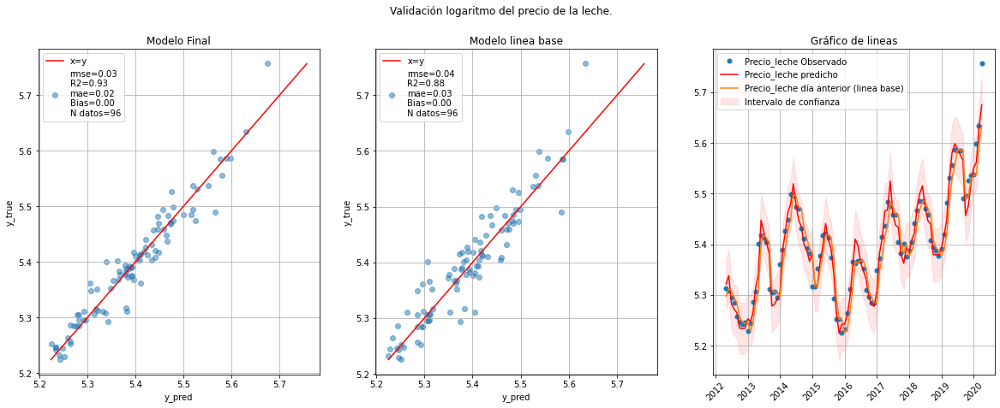

In [54]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plot_validacion(Y_valid,Y_p)
plt.title('Modelo Final')
plt.grid(True)
plt.subplot(1,3,2)
plot_validacion(Y_valid,valid['Precio_leche_lag_1'].values)
plt.title('Modelo linea base')
plt.grid(True)

plt.subplot(1,3,3)

plt.plot(valid['Fecha'].values,Y_valid,'.',label='Precio_leche Observado',markersize=10,)
plt.plot(valid['Fecha'].values,Y_p,label='Precio_leche predicho',c='r')
plt.fill_between(valid['Fecha'].values,Y_p-2*Y_p_std,Y_p+2*Y_p_std,
                 alpha=0.1,color='r',label='Intervalo de confianza')
plt.plot(valid['Fecha'].values,valid['Precio_leche_lag_1'].values,
         label='Precio_leche día anterior (linea base)')
plt.xticks(rotation=45)
plt.grid()
plt.legend()

plt.title('Gráfico de lineas')
plt.suptitle('Validación logaritmo del precio de la leche.')

En la figura anterior, podemos apreciar que este modelo es mejor que haber utilizado como predicción para el logaritmo del precio de la leche su valor en el mes anterior. Además todos los puntos excepto el último del año 2020 están dentro del intervalo de confianza. Probablemente esto corresponda al alza en el precio de varios productos al comienzo de la cuarentena, cosa que el modelo no mide y por lo tanto es razonable que no pueda predecir.

Text(0.5, 0.98, 'Validación del precio de la leche.')

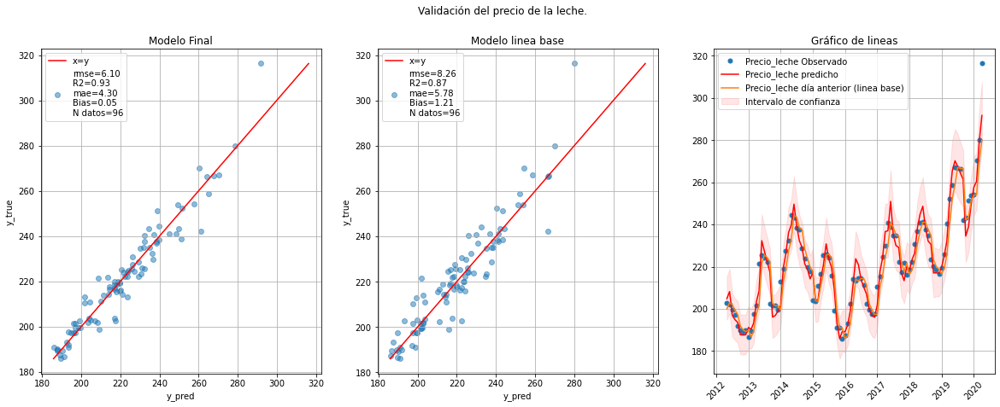

In [55]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plot_validacion(np.exp(Y_valid),np.exp(Y_p+(Y_p_std**2)/2))
plt.title('Modelo Final')
plt.grid(True)
plt.subplot(1,3,2)
plot_validacion(np.exp(Y_valid),np.exp(valid['Precio_leche_lag_1'].values))
plt.title('Modelo linea base')
plt.grid(True)

plt.subplot(1,3,3)

plt.plot(valid['Fecha'].values,np.exp(Y_valid),'.',label='Precio_leche Observado',markersize=10)
plt.plot(valid['Fecha'].values,np.exp(Y_p+(Y_p_std**2)/2),label='Precio_leche predicho',c='r')
plt.fill_between(valid['Fecha'].values,np.exp(Y_p-2*Y_p_std),np.exp(Y_p+2*Y_p_std).flatten(),
                 alpha=0.1,color='r',label='Intervalo de confianza')
plt.plot(valid['Fecha'].values,np.exp(valid['Precio_leche_lag_1'].values),
         label='Precio_leche día anterior (linea base)')
plt.xticks(rotation=45)
plt.grid()
plt.legend()

plt.title('Gráfico de lineas')
plt.suptitle('Validación del precio de la leche.')

En la último figura, podemos apreciar que el modelo obtiene un RMSE de 6.1, contra un 8.26 de utilizar el mes anterior como predicción del precio de la leche. Además podemos observar que el sesgo del modelo es muy bajo y que tiene un $R^2$ de $0.93$, lo cual implica que el modelo explica el 93% de la varianza del precio de la leche. Es importante resaltar que se lográ captar la tendencia de los datos y gran parte de la variabilidad.

Para mejorar este modelo se podría hacer un estudio más profundo de las variables economicas, por ejemplo en base al conocimiento experto del cliente se podría agregar los precios/costos de algunos elementos claves en el producción de la leche. También se podría considerar utilziar la predicción de las variables económicas o las variables de precipitaciones utilizadas entregadas por algún modelo confiable. 

Para que este modelo funcione de debe tener el valor de las variables econónmicas y de precipitaciones en el mes anterior al cual se desea predecir. Por lo tanto este modelo es adecuado para predecir solo un horizonte de un mes. Para considerar un horizonte más largo sería necesarío tener la predicción de las variables exogenas utilizadas para construir el modelo. 

Una aplicación directa de este modelo es utilizarlo para planificar procesos donde la leche sea un factor clave. También se puede utilizar para detectar valores anómalos en el precio de la leche, pues no solo se entrega una predicción puntos, sino que se estima la distribución. Por ejemplo en el gráfico de validación se aprecia que a comienzos en abril de 2020 se produce un aumento del precio de la leche que está fuera del intervalo de confianza (esto corresponde al inicio de la pandemia).

Con respecto al cambio climatico, dado que parte de las variables que el modelo utiliza son las precipitaciones (y asumiendo que hay una causalidad, esto requiere un analisis más profundo), se podría evaluar como afecta al precio de la leche el decrecimento en las precipitaciones provocado por el cambio climático, por medio de simulaciones. En esto último el hecho de predecir la distribución nos permitiría realizar simulaciones y obtener diferentes escenarios, lo cual es una gran ventaja de este modelo. 